In [1]:
import pandas as pd
import warnings 
import numpy as np
import pyodbc 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from category_encoders.woe import WOEEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from scipy.stats import randint
from scipy import stats
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
# from sklearn.model_selection import GridSearchCV
from sklearn import neighbors
from sklearn.metrics import classification_report
from matplotlib import pyplot
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
warnings.filterwarnings('ignore')

In [2]:
df_raw = pd.read_csv("C:/Users/Admins/Desktop/it_data.csv")
df_raw.head(20)

,ID_APPLICATION,TIME,NUMERICAL_0,NUMERICAL_1,NUMERICAL_2,NUMERICAL_3,NUMERICAL_4,NUMERICAL_5,NUMERICAL_6,NUMERICAL_7,...,CATEGORICAL_2,CATEGORICAL_3,CATEGORICAL_4,CATEGORICAL_5,CATEGORICAL_6,CATEGORICAL_7,CATEGORICAL_8,CATEGORICAL_9,CATEGORICAL_10,TARGET
0,0,2014-06-20 11:03:04,0.548205,6.273278,-0.557716,-0.086105,-0.726799,-0.523021,0.571528,0.176804,...,AB,DF,JK,TR,C,A,BB,AA,NFAYV,1
1,1,2014-06-20 11:05:39,-0.640991,5.662506,0.050086,0.233125,0.482266,0.085460,-0.552130,-0.017248,...,AA,DF,JK,WE,A,A,AA,BB,NFAYV,0
2,2,2014-06-20 11:07:00,0.394312,5.782492,-0.421450,0.756713,0.408276,0.327221,-0.905630,-0.941560,...,AB,AS,GH,TR,C,C,BB,BB,NFAYV,0
3,3,2014-06-20 11:09:38,-0.320658,4.736009,0.334894,1.092682,0.646294,1.541267,0.966884,-0.790725,...,AB,AS,GH,TR,A,A,AA,BB,HNPAK,0
4,4,2014-06-20 11:11:10,0.433235,5.323432,0.826207,0.718267,-1.627944,2.203108,0.420342,-0.223997,...,NaN,NaN,NaN,NaN,B,B,BB,BB,NFAYV,0
5,5,2014-06-20 11:15:32,0.804809,3.676883,-1.570088,-0.781643,-0.003953,-0.436355,-0.486709,0.451905,...,AA,AS,GH,TR,A,A,BB,AA,NFAYV,1
6,6,2014-06-20 11:19:04,-0.426573,5.097641,-0.418891,-1.319540,-1.101307,0.300634,0.053150,1.015488,...,AB,AS,JK,WE,A,A,AA,BB,HNPAK,0
7,7,2014-06-20 11:21:15,1.309813,5.299140,0.555682,0.280822,0.885091,-0.548538,-0.287544,0.736760,...,AB,AS,GH,TR,A,A,BB,BB,NFAYV,0
8,8,2014-06-20 11:26:13,-0.040456,4.772854,0.247977,-0.479995,-0.143546,-0.281755,-0.471861,-0.014056,...,NaN,NaN,NaN,NaN,B,A,AA,AA,HNPAK,0
9,9,2014-06-20 11:30:13,0.535139,7.009628,1.571081,0.051838,-0.340032,-1.466277,-0.122555,1.019615,...,AB,DF,GH,WE,B,C,BB,BB,HNPAK,0


In [3]:
df_raw.isnull().sum()

ID_APPLICATION        0
TIME                  0
NUMERICAL_0           0
NUMERICAL_1           0
NUMERICAL_2           0
NUMERICAL_3           0
NUMERICAL_4           0
NUMERICAL_5           0
NUMERICAL_6           0
NUMERICAL_7           0
NUMERICAL_8           0
NUMERICAL_9           0
NUMERICAL_10      56251
NUMERICAL_11          0
NUMERICAL_12          0
NUMERICAL_13          0
NUMERICAL_14          0
NUMERICAL_15          0
NUMERICAL_16          0
NUMERICAL_17          0
NUMERICAL_18          0
NUMERICAL_19          0
NUMERICAL_20          0
NUMERICAL_21          0
NUMERICAL_22          0
NUMERICAL_23          0
NUMERICAL_24          0
NUMERICAL_25          0
NUMERICAL_26          0
NUMERICAL_27          0
NUMERICAL_28          0
NUMERICAL_29          0
NUMERICAL_30          0
NUMERICAL_31          0
NUMERICAL_32          0
NUMERICAL_33          0
NUMERICAL_34          0
NUMERICAL_35          0
NUMERICAL_36          0
NUMERICAL_37          0
NUMERICAL_38          0
NUMERICAL_39    

In [4]:
print(df_raw.shape[0])
print(df_raw['ID_APPLICATION'].count())

200000
200000


In [4]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 56 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ID_APPLICATION  200000 non-null  int64  
 1   TIME            200000 non-null  object 
 2   NUMERICAL_0     200000 non-null  float64
 3   NUMERICAL_1     200000 non-null  float64
 4   NUMERICAL_2     200000 non-null  float64
 5   NUMERICAL_3     200000 non-null  float64
 6   NUMERICAL_4     200000 non-null  float64
 7   NUMERICAL_5     200000 non-null  float64
 8   NUMERICAL_6     200000 non-null  float64
 9   NUMERICAL_7     200000 non-null  float64
 10  NUMERICAL_8     200000 non-null  float64
 11  NUMERICAL_9     200000 non-null  float64
 12  NUMERICAL_10    143749 non-null  float64
 13  NUMERICAL_11    200000 non-null  float64
 14  NUMERICAL_12    200000 non-null  float64
 15  NUMERICAL_13    200000 non-null  float64
 16  NUMERICAL_14    200000 non-null  float64
 17  NUMERICAL_

In [15]:
type(df_raw['TIME'])

pandas.core.series.Series

In [7]:
df_raw['MONTH'] = pd.to_datetime(df_raw['TIME']).dt.strftime('%Y-%m')
df_raw['DAY'] = pd.to_datetime(df_raw['TIME']).dt.strftime('%Y-%m-%d')

df_raw['CALC_DAYNAME'] = df_raw['DAY'].apply(lambda x: pd.to_datetime(x).day_name())
df_raw['CALC_DAYNAME'].value_counts()

Sunday       28928
Saturday     28841
Friday       28809
Tuesday      28449
Thursday     28355
Wednesday    28347
Monday       28271
Name: CALC_DAYNAME, dtype: int64

Text(0, 0.5, 'TARGET')

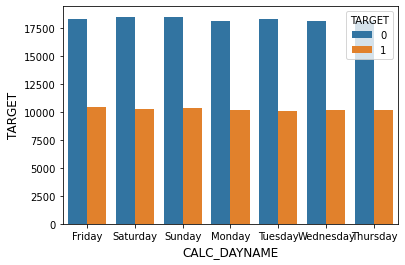

In [8]:
sns.countplot(df_raw['CALC_DAYNAME'], hue=df_raw["TARGET"])
plt.xlabel('CALC_DAYNAME', fontsize=12) 
plt.ylabel('TARGET', fontsize=12)

In [36]:
df_raw['CALC_SECOND']=pd.to_datetime(df_raw['TIME']).dt.second

df_raw['CALC_SECOND'].value_counts()

43    3513
11    3460
20    3438
41    3430
12    3425
8     3421
1     3407
27    3401
18    3396
35    3395
42    3392
50    3381
44    3372
34    3367
36    3366
28    3365
5     3365
14    3356
46    3352
45    3351
13    3346
54    3338
48    3337
57    3335
21    3333
31    3332
6     3332
37    3331
10    3330
24    3330
25    3329
55    3326
0     3324
26    3316
59    3315
33    3313
32    3311
3     3311
51    3309
16    3308
15    3305
56    3300
39    3299
19    3298
30    3297
7     3292
52    3291
38    3290
4     3290
49    3289
17    3289
2     3286
9     3272
47    3269
22    3268
23    3266
40    3258
29    3246
53    3221
58    3215
Name: CALC_SECOND, dtype: int64

In [76]:
df_sec = df_raw[['CALC_SECOND']]
df_sec.head()

,CALC_SECOND
0,4
1,39
2,0
3,38
4,10


### CHECK RARE_LABEL_ENCODING
### DO IT ON TRAIN AND AFTER TO TEST DATASET

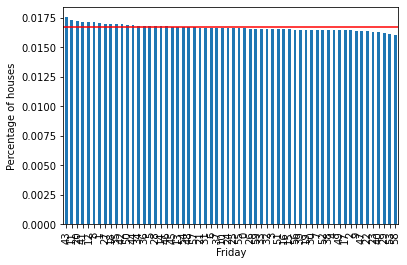

In [77]:
temp_df = pd.Series(df_sec['CALC_SECOND'].value_counts() / len(df_sec['CALC_SECOND']) )

# make plot with the above percentages
fig = temp_df.sort_values(ascending=False).plot.bar()
fig.set_xlabel(col)

# add a line at 5 % to flag the threshold for rare categories
fig.axhline(y=0.01675, color='red')
fig.set_ylabel('Percentage of houses')
plt.show()

In [79]:
df_sec = df_sec[['CALC_SECOND']].astype(str)
df_sec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 1 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   CALC_SECOND  200000 non-null  object
dtypes: object(1)
memory usage: 1.5+ MB


In [83]:
from feature_engine.encoding import RareLabelEncoder

rare_label_enc = RareLabelEncoder(tol=0.01675, n_categories=5, variables=['CALC_SECOND'])
df_sec = rare_label_enc.fit_transform(df_sec[['CALC_SECOND']])
df_sec

,CALC_SECOND
0,Rare
1,Rare
2,Rare
3,Rare
4,Rare
...,...
199995,41
199996,20
199997,45
199998,Rare


In [84]:
df_sec.value_counts()

CALC_SECOND
Rare           132047
43               3513
11               3460
20               3438
41               3430
12               3425
8                3421
1                3407
27               3401
18               3396
35               3395
42               3392
50               3381
44               3372
34               3367
36               3366
28               3365
5                3365
14               3356
46               3352
45               3351
dtype: int64

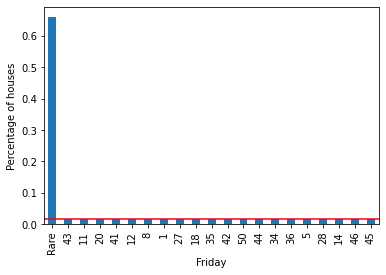

In [85]:
temp_df = pd.Series(df_sec['CALC_SECOND'].value_counts() / len(df_sec['CALC_SECOND']) )

# make plot with the above percentages
fig = temp_df.sort_values(ascending=False).plot.bar()
fig.set_xlabel(col)

# add a line at 5 % to flag the threshold for rare categories
fig.axhline(y=0.01675, color='red')
fig.set_ylabel('Percentage of houses')
plt.show()

In [3]:
df_raw['MONTH'] = pd.to_datetime(df_raw['TIME']).dt.strftime('%Y-%m')
df_raw['DAY'] = pd.to_datetime(df_raw['TIME']).dt.strftime('%Y-%m-%d')

def day_name(x):
    day_name = pd.to_datetime(x).day_name()
    if day_name.upper() in (['FRIDAY','SATURDAY','SUNDAY']):
        return 'FRI_SAT_SUN'
    else:
        return 'OTHER'
    
df_raw['CALC_CATEGORICAL_DAYNAME'] = df_raw['DAY'].apply(lambda x: day_name(x))

print(df_raw['MONTH'].drop_duplicates())
print(df_raw.head())

0         2014-06
6119      2014-07
24062     2014-08
42058     2014-09
59541     2014-10
77434     2014-11
94656     2014-12
112631    2015-01
130547    2015-02
146730    2015-03
164744    2015-04
182024    2015-05
Name: MONTH, dtype: object
   ID_APPLICATION                 TIME  NUMERICAL_0  NUMERICAL_1  NUMERICAL_2  \
0               0  2014-06-20 11:03:04     0.548205     6.273278    -0.557716   
1               1  2014-06-20 11:05:39    -0.640991     5.662506     0.050086   
2               2  2014-06-20 11:07:00     0.394312     5.782492    -0.421450   
3               3  2014-06-20 11:09:38    -0.320658     4.736009     0.334894   
4               4  2014-06-20 11:11:10     0.433235     5.323432     0.826207   

   NUMERICAL_3  NUMERICAL_4  NUMERICAL_5  NUMERICAL_6  NUMERICAL_7  ...  \
0    -0.086105    -0.726799    -0.523021     0.571528     0.176804  ...   
1     0.233125     0.482266     0.085460    -0.552130    -0.017248  ...   
2     0.756713     0.408276     0.327221    -

In [4]:
tmp = df_raw[['TARGET','MONTH']]
tmp['TARGET'] = tmp['TARGET'].astype(np.int64)
tmp = tmp.groupby('MONTH').agg({'TARGET':['sum','count']}).reset_index()
tmp['BAD_RATE'] = (tmp.iloc[:, 1]/tmp.iloc[:, 2])*100
tmp

MONTH TARGET          BAD_RATE
               sum  count           
0   2014-06   2199   6119  35.937245
1   2014-07   6463  17943  36.019618
2   2014-08   6433  17996  35.746833
3   2014-09   6303  17483  36.052165
4   2014-10   6346  17893  35.466384
5   2014-11   6126  17222  35.570782
6   2014-12   6406  17975  35.638387
7   2015-01   6441  17916  35.951105
8   2015-02   5810  16183  35.901872
9   2015-03   6497  18014  36.066393
10  2015-04   6231  17280  36.059028
11  2015-05   6523  17976  36.287272

In [9]:
# cols = [col for col in df_raw.columns if col.startswith('NUM') | col.startswith('CAT')]

# for col in df_raw.columns:
#     if col.startswith('NUM') or str(col)==str('TARGET'):
#         df_raw[col] = df_raw[col].astype(np.float64)
        
df_raw.info()

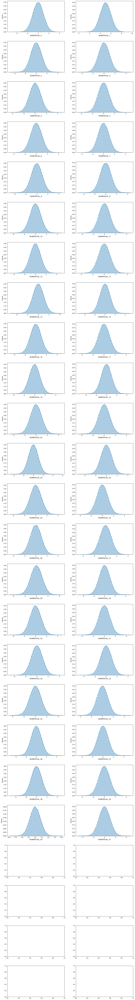

In [3]:
num_feat = [i for i in df_raw.columns if ((df_raw[i].dtype == np.int64) | (df_raw[i].dtype == np.float64))
           and i not in ['ID_APPLICATION','TARGET']
           ]

fig, ax = plt.subplots(25, 2, figsize=(16, 130))
plt.subplots_adjust(hspace=0.3)
plt.style.use('fivethirtyeight')
    
    
for i, feature in enumerate(num_feat):   
    plt.subplot(25, 2, i+1)
    sns.set(color_codes=True)
    sns.distplot(df_raw[feature])
    plt.xlabel(feature, fontsize=12) 

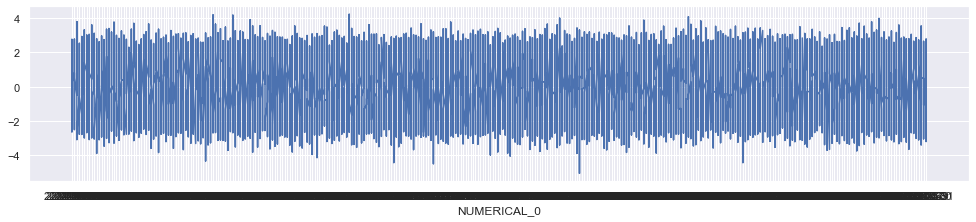

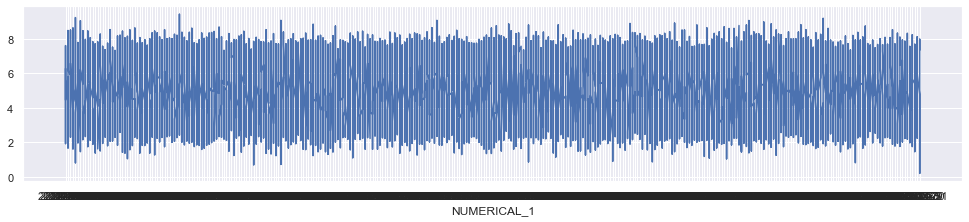

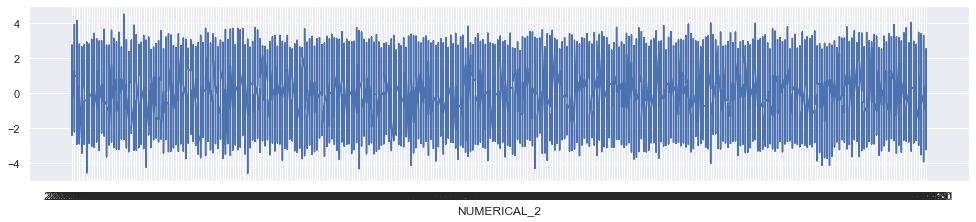

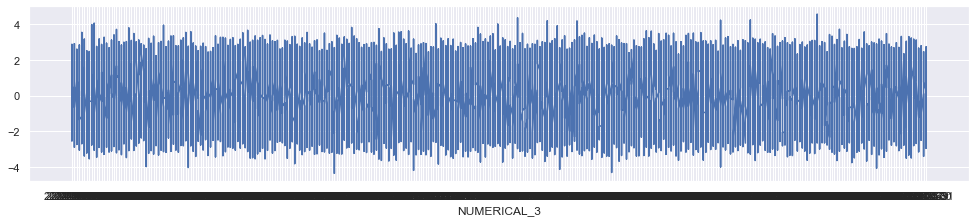

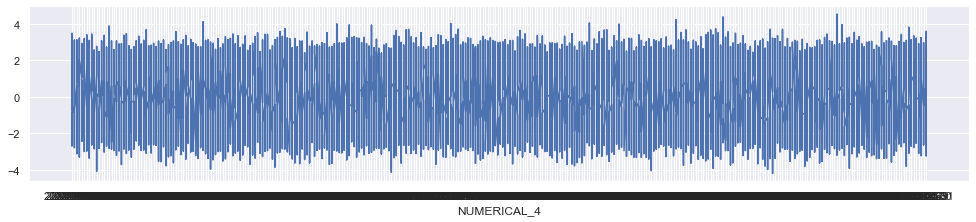

...

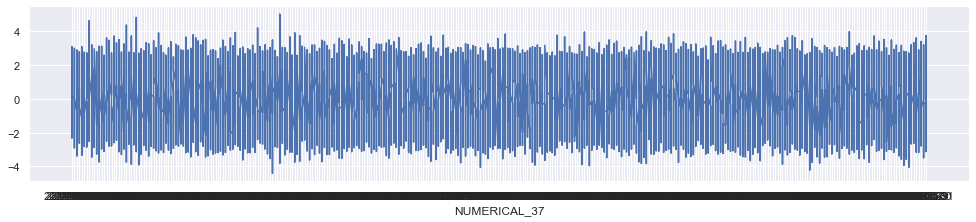

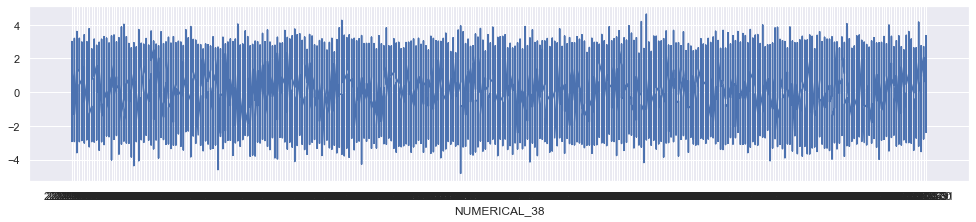

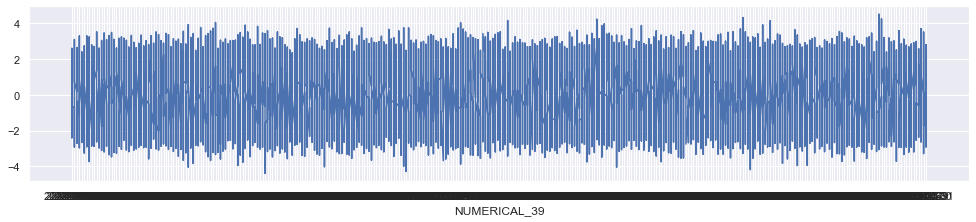

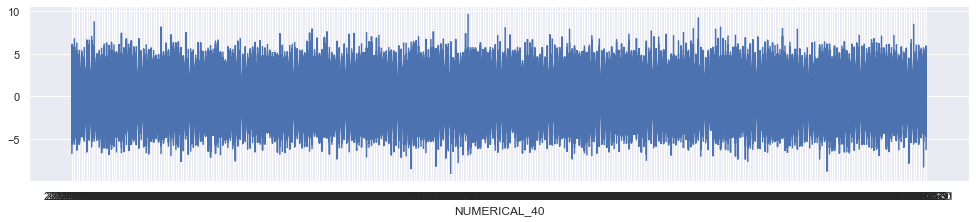

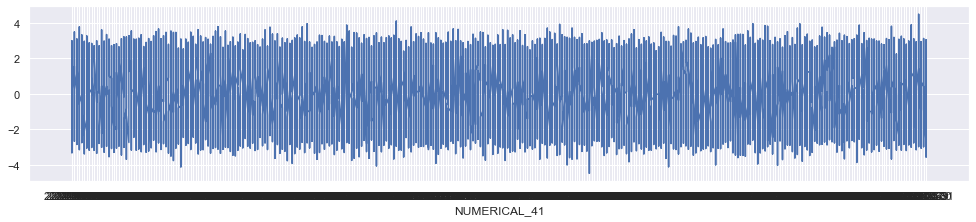

In [48]:
for num in num_feat:
    if num not in ['ID_APPLICATION','TARGET']:
        plt.figure(figsize=(15, 3))
        plt.plot(df_raw['DAY'], df_raw[num])
        plt.xlabel(num)
        plt.show()
    else:
        pass

In [195]:
# df_temp = df_raw[['MONTH','NUMERICAL_3', 'NUMERICAL_7']]
# df_temp

,MONTH,NUMERICAL_3,NUMERICAL_7
0,2014-06,-0.086105,0.176804
1,2014-06,0.233125,-0.017248
2,2014-06,0.756713,-0.941560
3,2014-06,1.092682,-0.790725
4,2014-06,0.718267,-0.223997
...,...,...,...
199995,2015-05,-1.084646,0.610075
199996,2015-05,-2.030206,-0.687367
199997,2015-05,1.777090,0.113520
199998,2015-05,0.041884,0.795207


In [196]:
# cols = ['NUMERICAL_3', 'NUMERICAL_7']

# def custom_variable(df, col):
    
#     s = df.groupby('MONTH')[col].sum()
#     l = df.groupby('MONTH')[col].size()
    
#     mean = s / l
#     median = df.groupby('MONTH')[col].median()
    
#     tmp = pd.DataFrame({col+'_MEAN': mean, col+'_MEDIAN': median}).reset_index()
    
#     return tmp



# for col in cols:
#     s = custom_variable(df_temp, col)
#     df_temp = df_temp.merge(s,how='left',on='MONTH')
    
    
# df_temp

,MONTH,NUMERICAL_3,NUMERICAL_7,NUMERICAL_3_MEAN,NUMERICAL_3_MEDIAN,NUMERICAL_7_MEAN,NUMERICAL_7_MEDIAN
0,2014-06,-0.086105,0.176804,0.002709,-0.009232,-0.000296,-0.001913
1,2014-06,0.233125,-0.017248,0.002709,-0.009232,-0.000296,-0.001913
2,2014-06,0.756713,-0.941560,0.002709,-0.009232,-0.000296,-0.001913
3,2014-06,1.092682,-0.790725,0.002709,-0.009232,-0.000296,-0.001913
4,2014-06,0.718267,-0.223997,0.002709,-0.009232,-0.000296,-0.001913
...,...,...,...,...,...,...,...
199995,2015-05,-1.084646,0.610075,-0.007007,-0.001779,-0.012036,-0.014532
199996,2015-05,-2.030206,-0.687367,-0.007007,-0.001779,-0.012036,-0.014532
199997,2015-05,1.777090,0.113520,-0.007007,-0.001779,-0.012036,-0.014532
199998,2015-05,0.041884,0.795207,-0.007007,-0.001779,-0.012036,-0.014532


In [200]:
# cols = ['NUMERICAL_3', 'NUMERICAL_7']


# for col in cols:
#     s = custom_variable(df_raw, col)
#     df_raw = df_raw.merge(s,how='left',on='MONTH')

    
# print(df_raw[['MONTH','NUMERICAL_3_MEAN','NUMERICAL_3_MEDIAN']].drop_duplicates())
# print(df_raw[['MONTH','NUMERICAL_7_MEAN','NUMERICAL_7_MEDIAN']].drop_duplicates())

          MONTH  NUMERICAL_3_MEAN  NUMERICAL_3_MEDIAN
0       2014-06          0.002709           -0.009232
6119    2014-07          0.004051           -0.004665
24062   2014-08          0.010968            0.019235
42058   2014-09          0.013063            0.012562
59541   2014-10          0.003060            0.011820
77434   2014-11         -0.000393            0.000425
94656   2014-12          0.002041            0.010336
112631  2015-01         -0.007661           -0.004384
130547  2015-02         -0.001224           -0.009097
146730  2015-03         -0.003602           -0.003072
164744  2015-04         -0.007318           -0.010804
182024  2015-05         -0.007007           -0.001779
          MONTH  NUMERICAL_7_MEAN  NUMERICAL_7_MEDIAN
0       2014-06         -0.000296           -0.001913
6119    2014-07         -0.006670           -0.016788
24062   2014-08          0.008146            0.020908
42058   2014-09          0.011821            0.005490
59541   2014-10         -0.0

In [7]:
data = df_raw['MONTH'].sort_values().value_counts().reset_index() 
pd.DataFrame(data=data).sort_values(by='index',ascending=True)

,index,MONTH
11,2014-06,6119
4,2014-07,17943
1,2014-08,17996
7,2014-09,17483
6,2014-10,17893
9,2014-11,17222
3,2014-12,17975
5,2015-01,17916
10,2015-02,16183
0,2015-03,18014


In [221]:
df_raw['NUMERICAL_10'].isnull().sum()

56251

In [9]:
data= df_raw[['MONTH','NUMERICAL_10']]
data['NUMERICAL_10'] = data['NUMERICAL_10'].apply(lambda x: 1 if pd.isnull(x) == True else 0)
data
# pd.DataFrame(data=data)

,MONTH,NUMERICAL_10
0,2014-06,0
1,2014-06,0
2,2014-06,0
3,2014-06,0
4,2014-06,0
...,...,...
199995,2015-05,0
199996,2015-05,0
199997,2015-05,0
199998,2015-05,0


In [10]:
data.groupby('MONTH').agg({'NUMERICAL_10':['count','sum']})

NUMERICAL_10       
               count    sum
MONTH                      
2014-06         6119      0
2014-07        17943      0
2014-08        17996      0
2014-09        17483      0
2014-10        17893   2434
2014-11        17222  17222
2014-12        17975  17975
2015-01        17916  17916
2015-02        16183    704
2015-03        18014      0
2015-04        17280      0
2015-05        17976      0

In [5]:
df_raw = df_raw.loc[~df_raw['MONTH'].isin(['2014-11','2014-12','2015-01'])]
df_raw['MONTH'].drop_duplicates().sort_values()

0         2014-06
6119      2014-07
24062     2014-08
42058     2014-09
59541     2014-10
130547    2015-02
146730    2015-03
164744    2015-04
182024    2015-05
Name: MONTH, dtype: object

In [52]:
df_raw.columns

Index(['ID_APPLICATION', 'TIME', 'NUMERICAL_0', 'NUMERICAL_1', 'NUMERICAL_2',
       'NUMERICAL_3', 'NUMERICAL_4', 'NUMERICAL_5', 'NUMERICAL_6',
       'NUMERICAL_7', 'NUMERICAL_8', 'NUMERICAL_9', 'NUMERICAL_10',
       'NUMERICAL_11', 'NUMERICAL_12', 'NUMERICAL_13', 'NUMERICAL_14',
       'NUMERICAL_15', 'NUMERICAL_16', 'NUMERICAL_17', 'NUMERICAL_18',
       'NUMERICAL_19', 'NUMERICAL_20', 'NUMERICAL_21', 'NUMERICAL_22',
       'NUMERICAL_23', 'NUMERICAL_24', 'NUMERICAL_25', 'NUMERICAL_26',
       'NUMERICAL_27', 'NUMERICAL_28', 'NUMERICAL_29', 'NUMERICAL_30',
       'NUMERICAL_31', 'NUMERICAL_32', 'NUMERICAL_33', 'NUMERICAL_34',
       'NUMERICAL_35', 'NUMERICAL_36', 'NUMERICAL_37', 'NUMERICAL_38',
       'NUMERICAL_39', 'NUMERICAL_40', 'NUMERICAL_41', 'CATEGORICAL_0',
       'CATEGORICAL_1', 'CATEGORICAL_2', 'CATEGORICAL_3', 'CATEGORICAL_4',
       'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7', 'CATEGORICAL_8',
       'CATEGORICAL_9', 'CATEGORICAL_10', 'TARGET', 'MONTH', 'DAY',


In [94]:
num_feat = [i for i in df_raw.columns if ((df_raw[i].dtype == np.int64) | (df_raw[i].dtype == np.float64))
           and i not in ['ID_APPLICATION','TARGET']
           ]

print(num_feat)

['NUMERICAL_0', 'NUMERICAL_1', 'NUMERICAL_2', 'NUMERICAL_3', 'NUMERICAL_4', 'NUMERICAL_5', 'NUMERICAL_6', 'NUMERICAL_7', 'NUMERICAL_8', 'NUMERICAL_9', 'NUMERICAL_10', 'NUMERICAL_11', 'NUMERICAL_12', 'NUMERICAL_13', 'NUMERICAL_14', 'NUMERICAL_15', 'NUMERICAL_16', 'NUMERICAL_17', 'NUMERICAL_18', 'NUMERICAL_19', 'NUMERICAL_20', 'NUMERICAL_21', 'NUMERICAL_22', 'NUMERICAL_23', 'NUMERICAL_24', 'NUMERICAL_25', 'NUMERICAL_26', 'NUMERICAL_27', 'NUMERICAL_28', 'NUMERICAL_29', 'NUMERICAL_30', 'NUMERICAL_31', 'NUMERICAL_32', 'NUMERICAL_33', 'NUMERICAL_34', 'NUMERICAL_35', 'NUMERICAL_36', 'NUMERICAL_37', 'NUMERICAL_38', 'NUMERICAL_39', 'NUMERICAL_40', 'NUMERICAL_41']


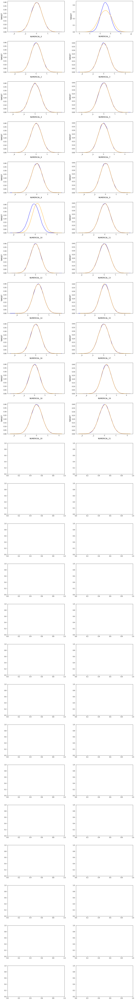

In [14]:
# num_feat.remove('ID_APPLICATION')
# num_feat.remove('TARGET')

fig, ax = plt.subplots(25, 2, figsize=(16, 130))
plt.subplots_adjust(hspace=0.3)


for i, feature in enumerate(num_feat[:22]):
    plt.subplot(25, 2, i+1)
    sns.distplot(df_raw[df_raw['TARGET'] == 0][feature], hist=False, color="blue") 
    sns.distplot(df_raw[df_raw['TARGET'] == 1][feature], hist=False, color="orange")  
    if df_raw[feature].nunique() > 10:
        plt.tick_params(axis='x', labelsize=9, labelrotation=45)
    plt.xlabel(feature, fontsize=12) 
    plt.ylabel('TARGET', fontsize=12)    

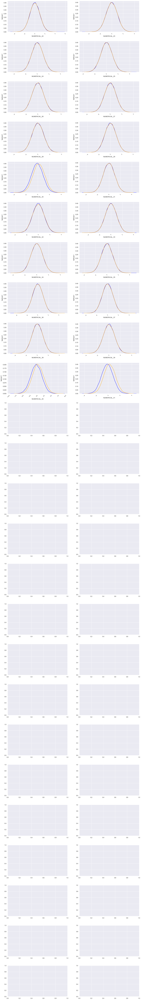

In [227]:
fig, ax = plt.subplots(25, 2, figsize=(16, 130))
plt.subplots_adjust(hspace=0.3)

for i, feature in enumerate(num_feat[22:]):
    plt.subplot(25, 2, i+1)
    sns.distplot(df_raw[df_raw['TARGET'] == 0][feature], hist=False, color="blue") 
    sns.distplot(df_raw[df_raw['TARGET'] == 1][feature], hist=False, color="orange")  
    if df_raw[feature].nunique() > 10:
        plt.tick_params(axis='x', labelsize=9, labelrotation=45)
    plt.xlabel(feature, fontsize=12) 
    plt.ylabel('TARGET', fontsize=12)    

In [231]:
df_raw['MONTH'].drop_duplicates()

0         2014-06
6119      2014-07
24062     2014-08
42058     2014-09
59541     2014-10
130547    2015-02
146730    2015-03
164744    2015-04
182024    2015-05
Name: MONTH, dtype: object

In [229]:
# used_num_feat = ['NUMERICAL_1', 'NUMERICAL_10', 'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41']

# def plot_pca(col,df):
#     moving_avg= df[col].rolling(6).mean()
#     moving_std= df[col].rolling(6).std()
#     plt.figure(figsize=(18,4))
#     orig = plt.plot(df[col], color='blue',label='Original')
#     mean = plt.plot(moving_avg, color='red', label='Rolling Mean')
#     std = plt.plot(moving_std, color='black', label = 'Rolling Std')
#     plt.xlabel(col)
#     plt.legend(loc='best')
#     plt.title('Rolling Mean & Standard Deviation')
#     plt.show(block=False)

# df_temp = pd.DataFrame()
# tmp = pd.DataFrame()

# for col in used_num_feat:
#     df_temp = df_raw[['MONTH',col]]
#     df_temp['MONTH']= pd.to_datetime(df_temp['MONTH'])
#     df_temp = df_temp.set_index('MONTH')
#     tmp[col]= df_temp[col].resample('MS').mean()
    
# tmp    


,NUMERICAL_1,NUMERICAL_10,NUMERICAL_30,NUMERICAL_40,NUMERICAL_41
MONTH,,,,,
2014-06-01,5.001856,-0.013324,0.015971,-0.015273,-0.021030
2014-07-01,5.006387,0.015133,-0.001822,0.002317,0.001682
2014-08-01,5.004445,-0.000412,0.010018,-0.007153,0.005177
2014-09-01,4.998033,-0.010936,0.013520,0.003355,-0.012158
2014-10-01,4.993015,-0.006178,0.019214,-0.022711,0.003197
2014-11-01,NaN,NaN,NaN,NaN,NaN
2014-12-01,NaN,NaN,NaN,NaN,NaN
2015-01-01,NaN,NaN,NaN,NaN,NaN
2015-02-01,5.013778,-0.002038,-0.002616,-0.033174,-0.007931


<Figure size 1080x216 with 0 Axes>

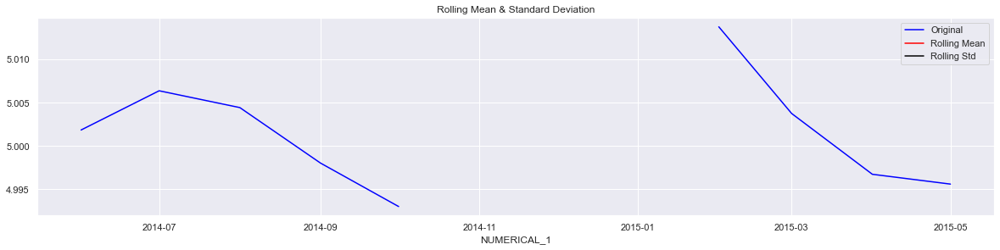

<Figure size 1080x216 with 0 Axes>

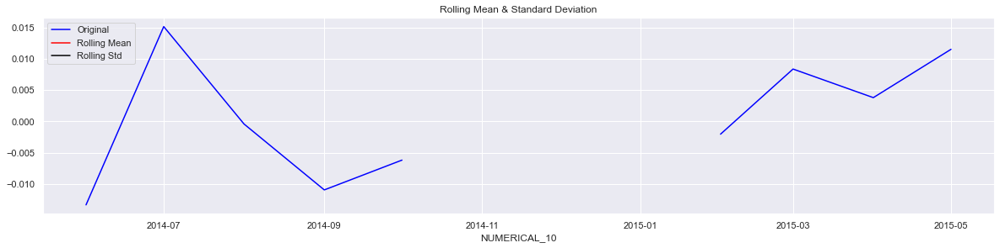

<Figure size 1080x216 with 0 Axes>

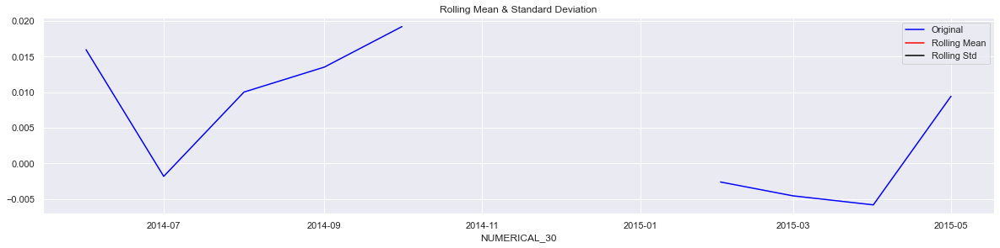

<Figure size 1080x216 with 0 Axes>

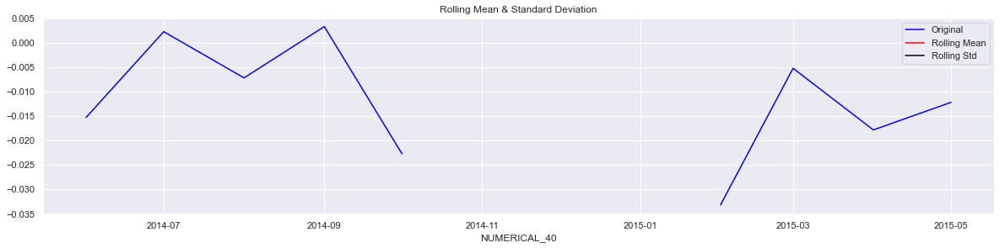

<Figure size 1080x216 with 0 Axes>

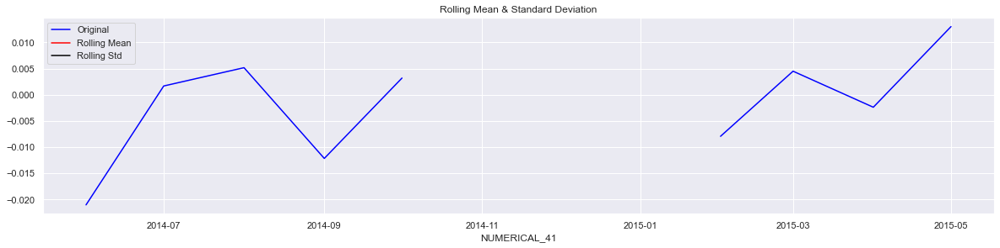

In [230]:
# for num in used_num_feat:
#     plt.figure(figsize=(15, 3))
#     plot_pca(num,tmp)

In [53]:
cat_feat = [i for i in df_raw.columns if df_raw[i].dtype == object]


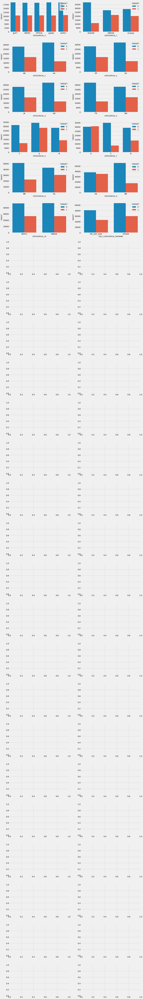

In [54]:
cat_feat = [i for i in df_raw.columns if df_raw[i].dtype == object]
rmv_cat_feat=['TIME','MONTH','DAY']
for i in rmv_cat_feat:
    cat_feat.remove(i)


fig, ax = plt.subplots(25, 2, figsize=(16, 130))
plt.subplots_adjust(hspace=0.3)
plt.style.use('fivethirtyeight')

for i, feature in enumerate(cat_feat):
    plt.subplot(25, 2, i+1)
    sns.countplot(df_raw[feature], hue=df_raw["TARGET"])
    if df_raw[feature].nunique() > 10:
        plt.tick_params(axis='x', labelsize=9, labelrotation=45)
    plt.xlabel(feature, fontsize=12) 
    plt.ylabel('TARGET', fontsize=12)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


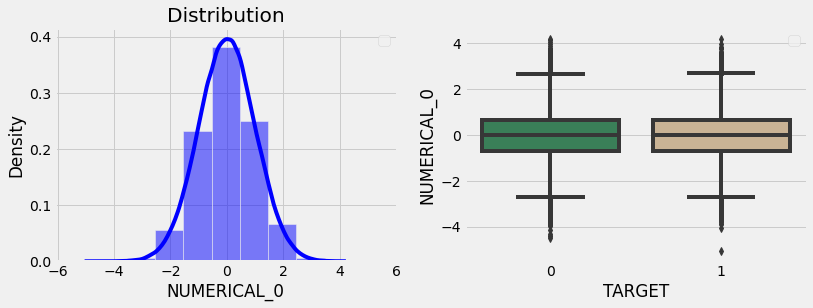

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


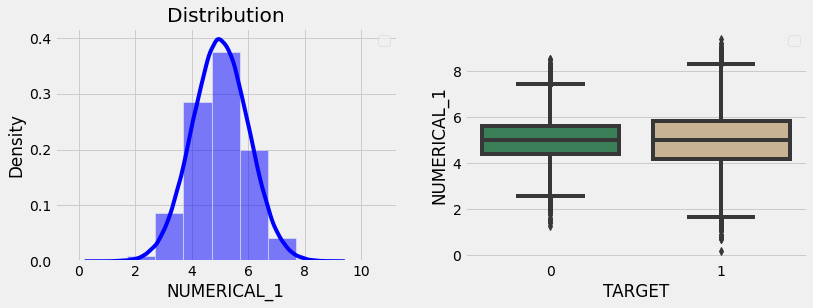

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


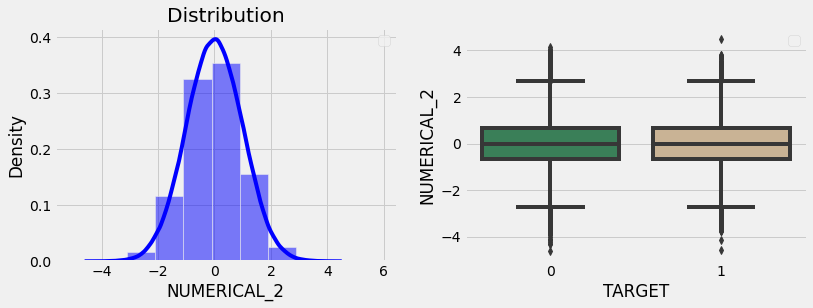

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


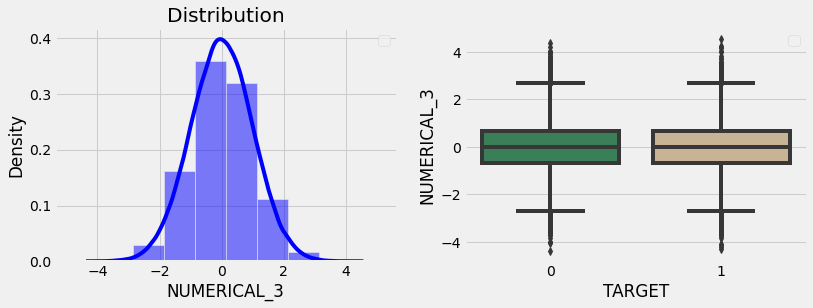

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


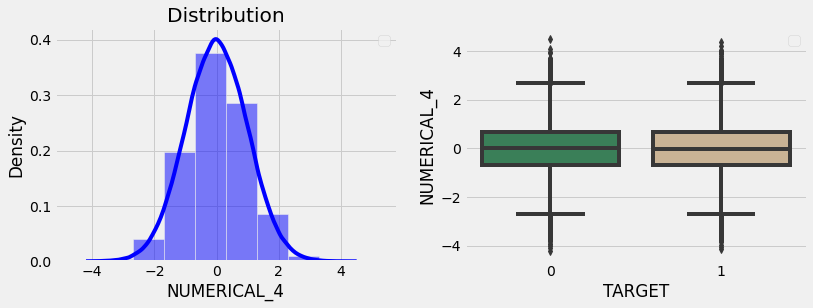

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


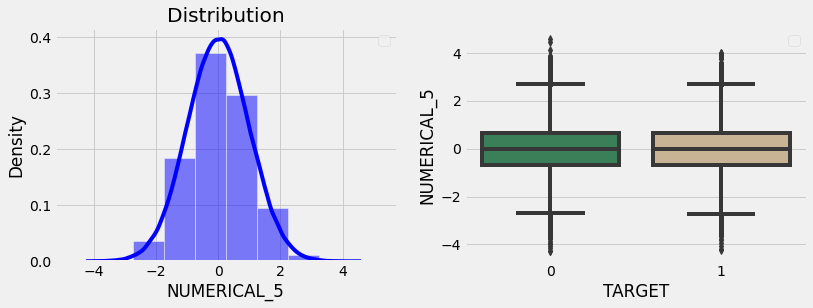

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


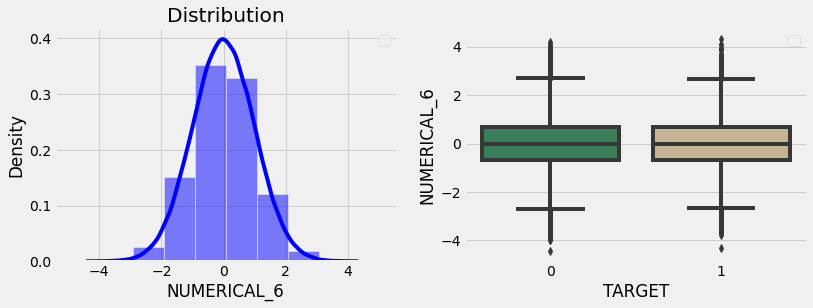

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


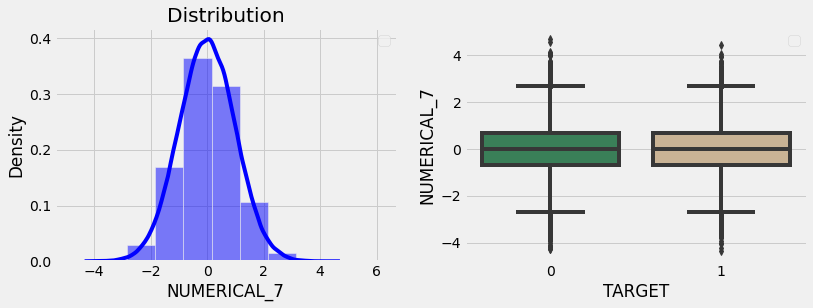

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


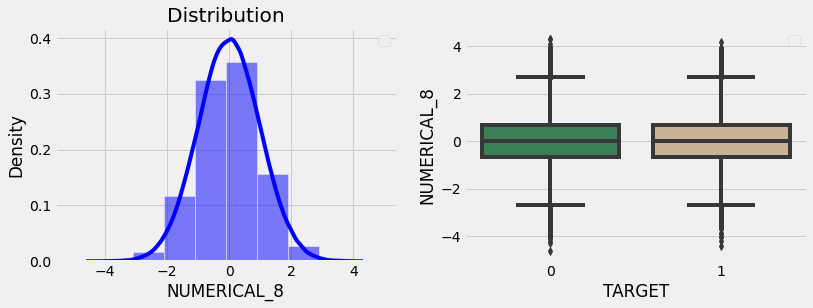

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


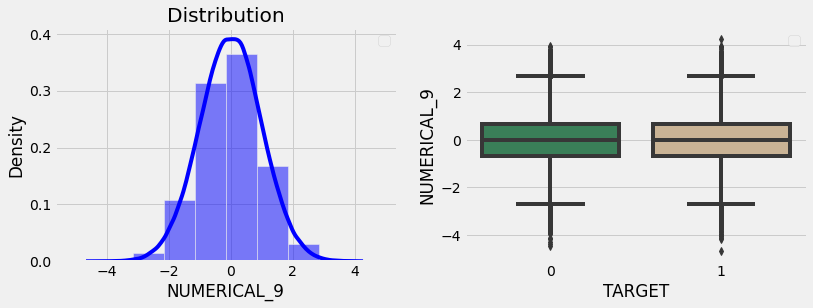

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


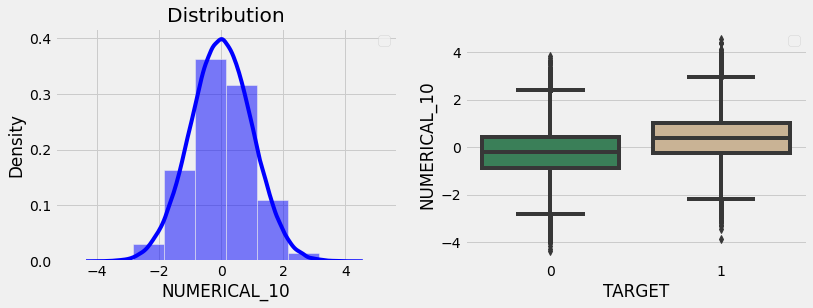

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


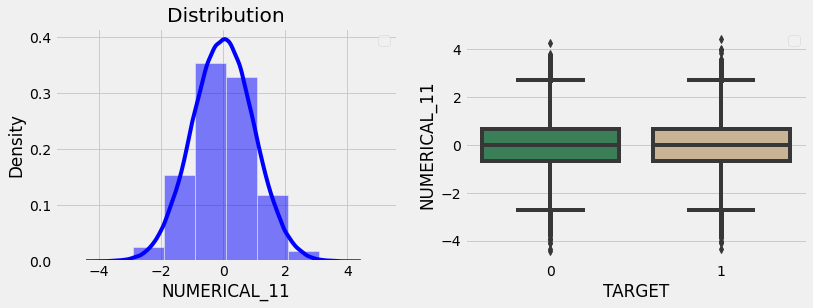

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


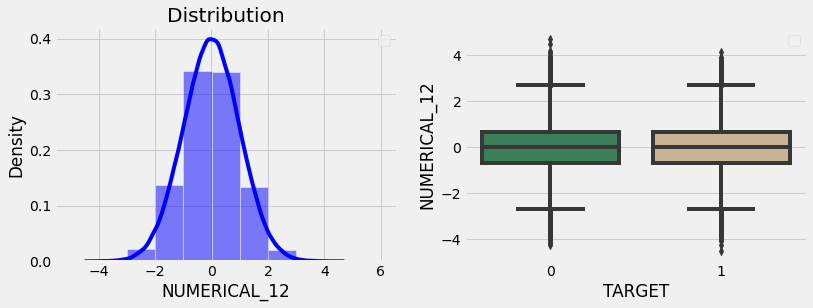

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


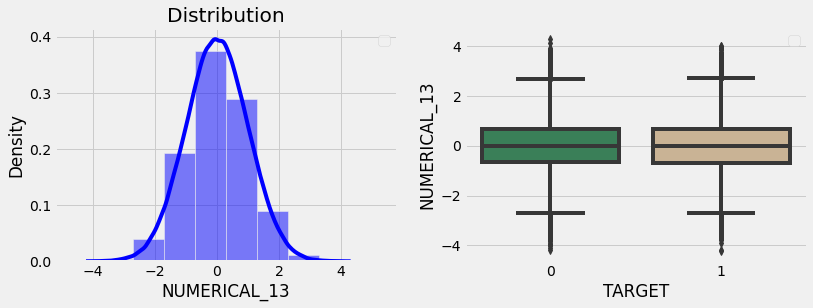

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


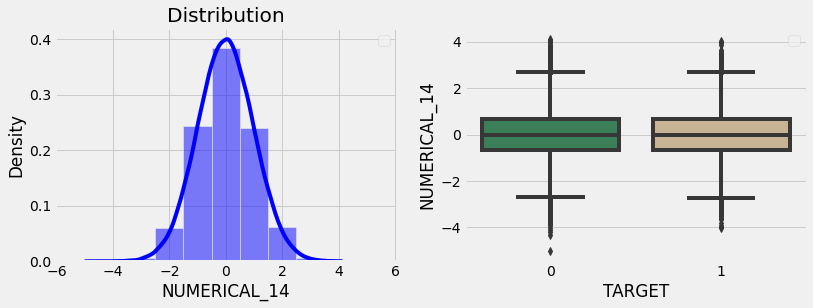

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


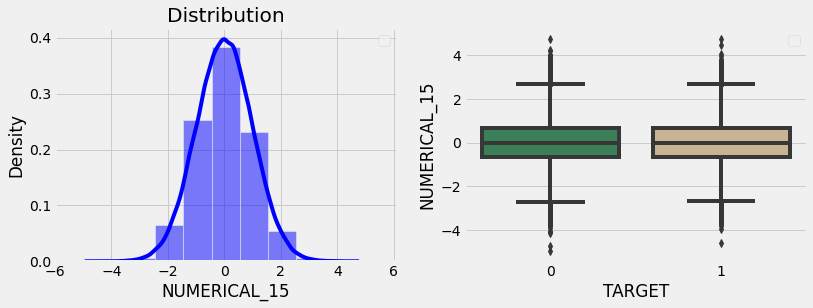

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


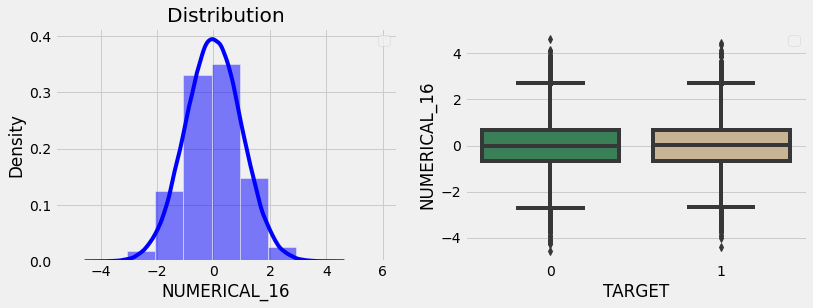

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


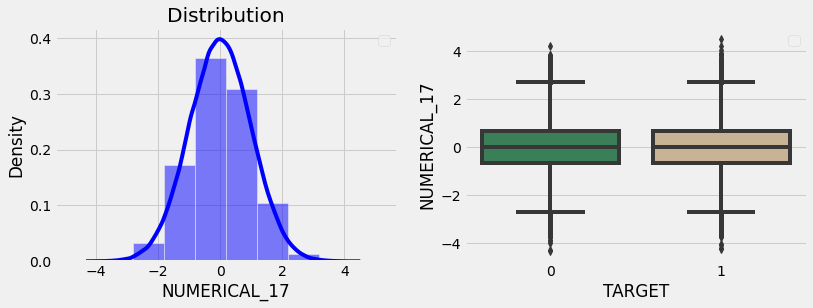

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


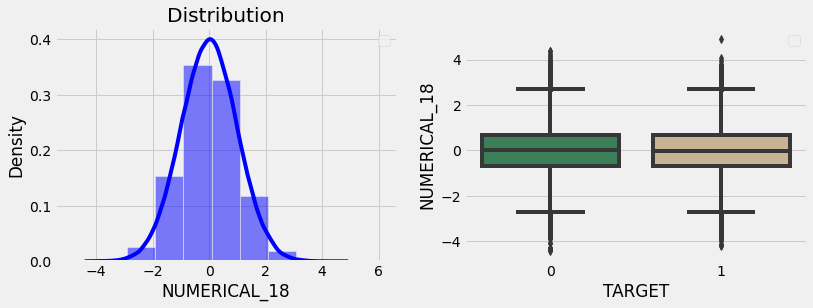

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


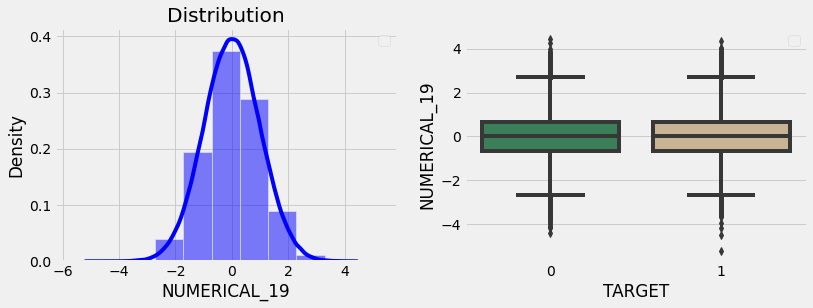

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


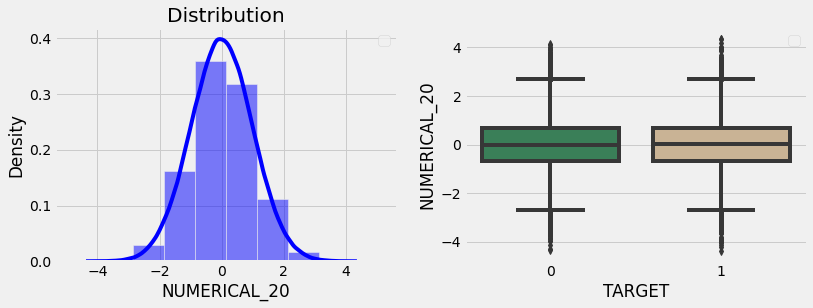

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


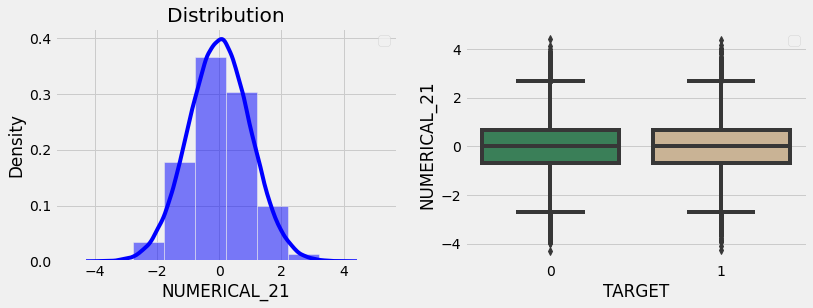

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


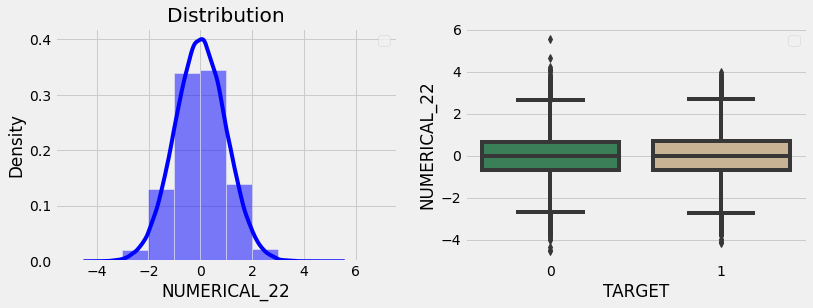

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


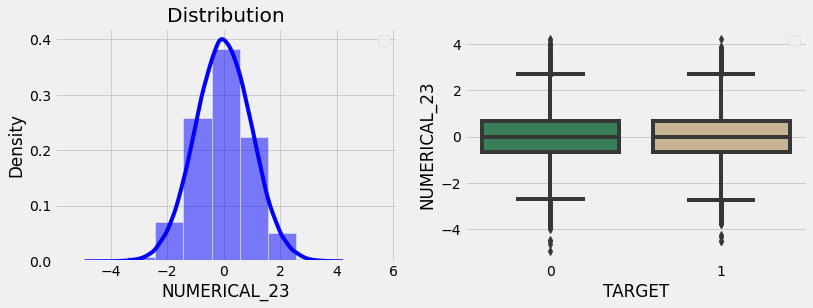

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


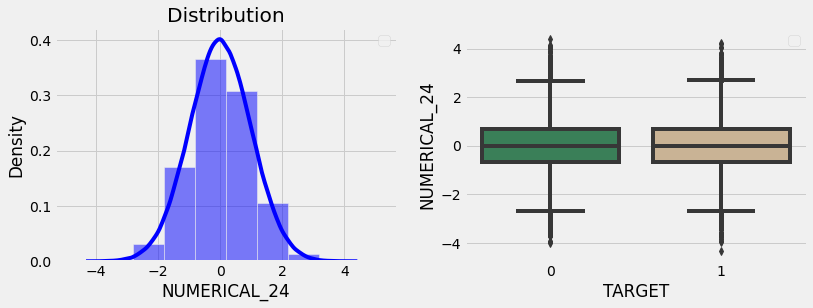

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


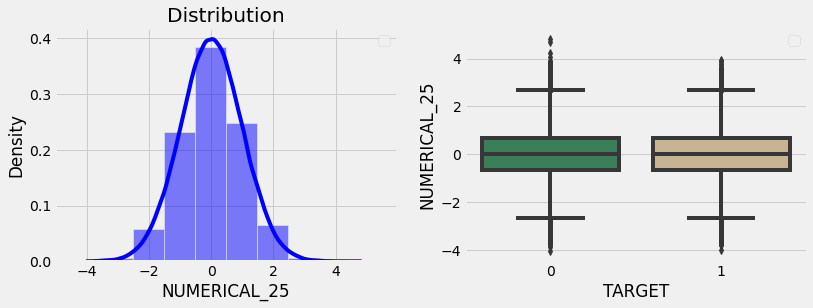

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


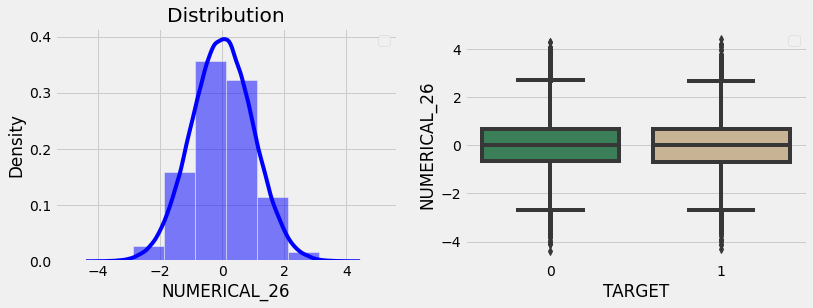

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


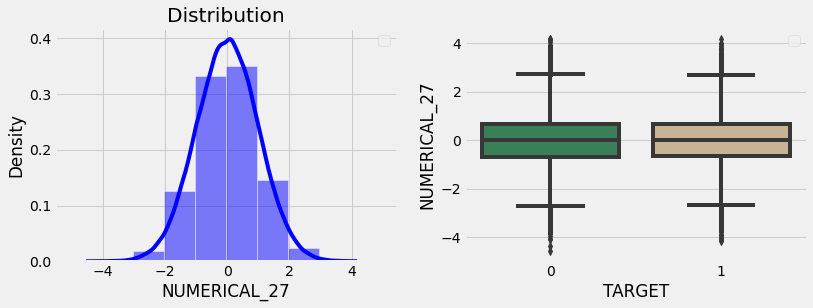

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


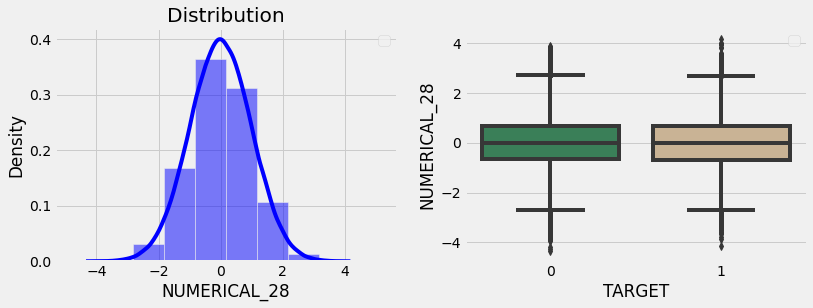

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


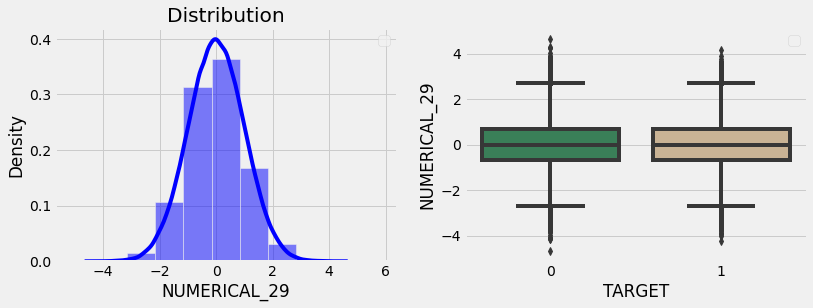

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


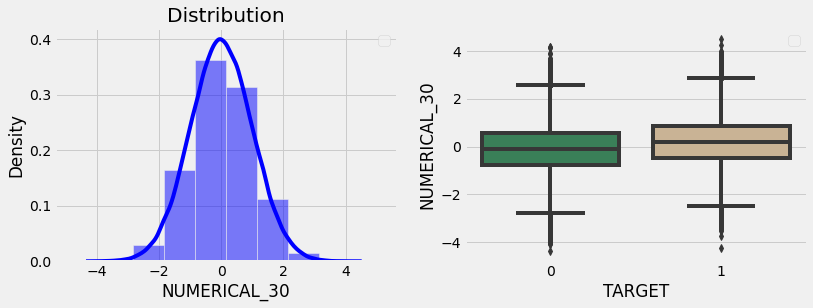

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


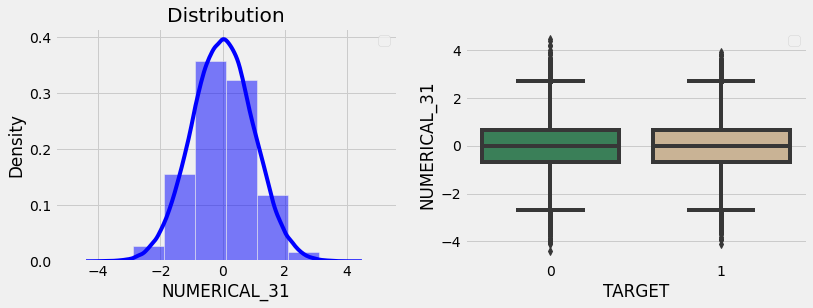

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


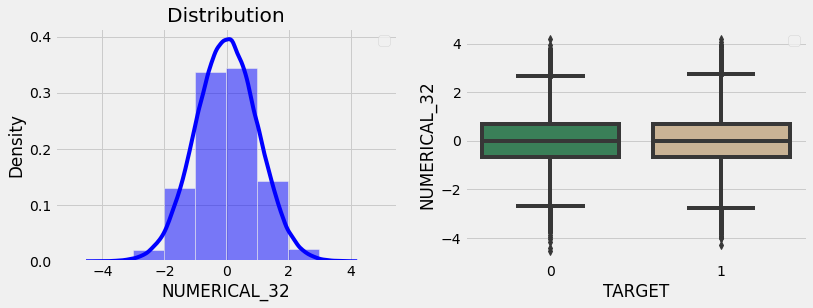

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


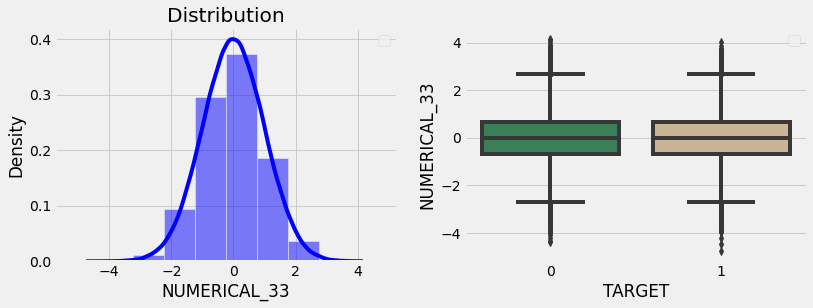

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


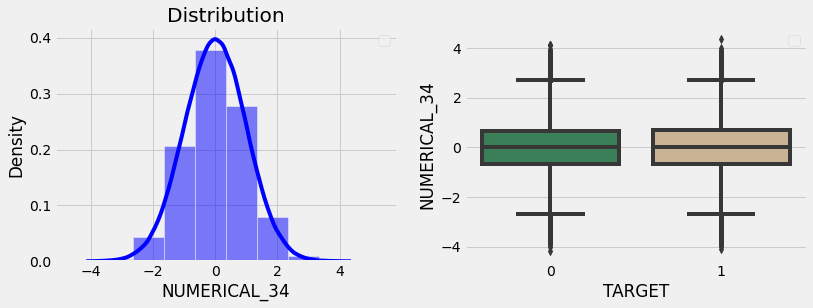

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


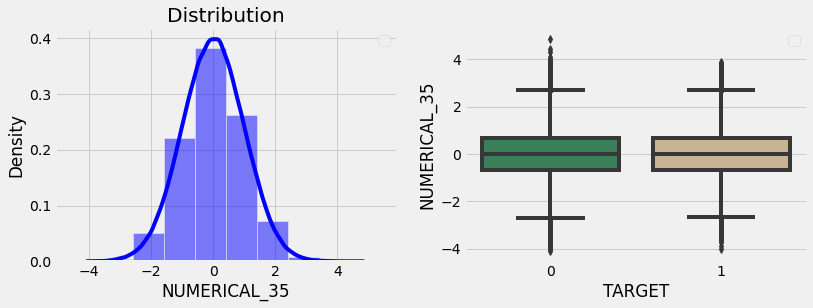

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


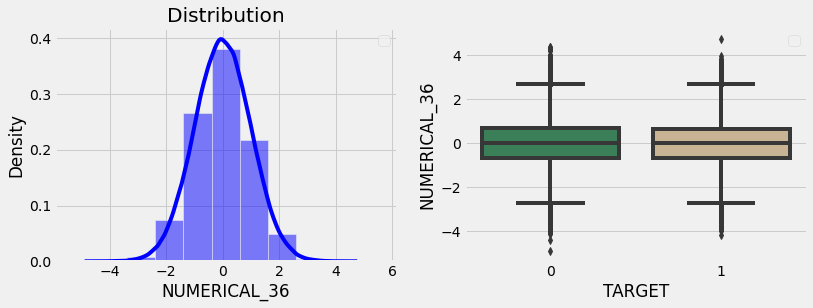

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


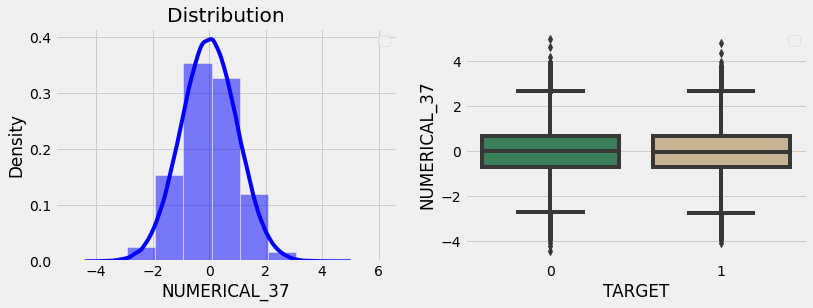

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


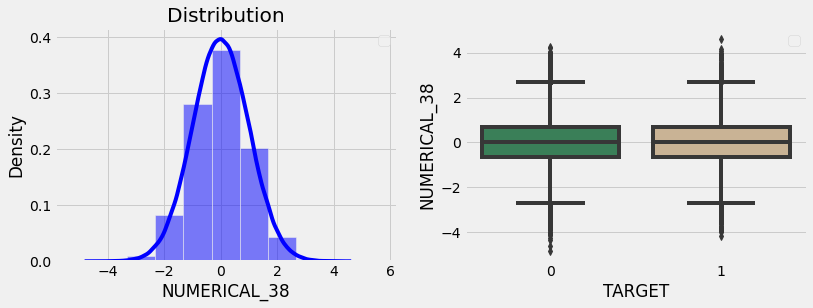

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


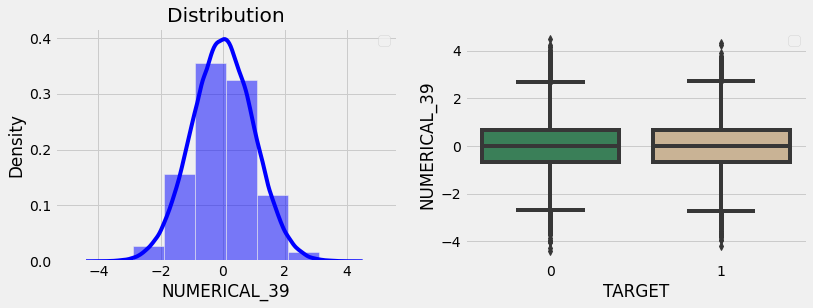

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


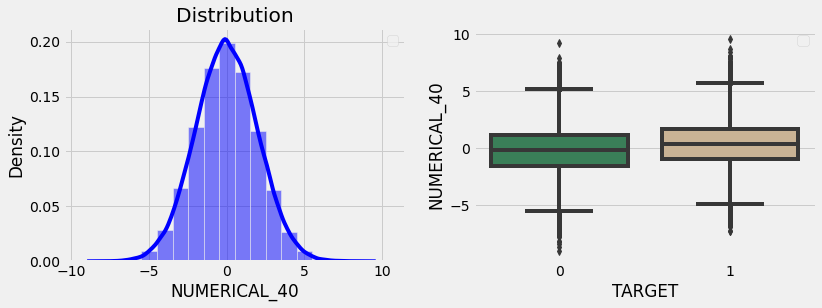

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


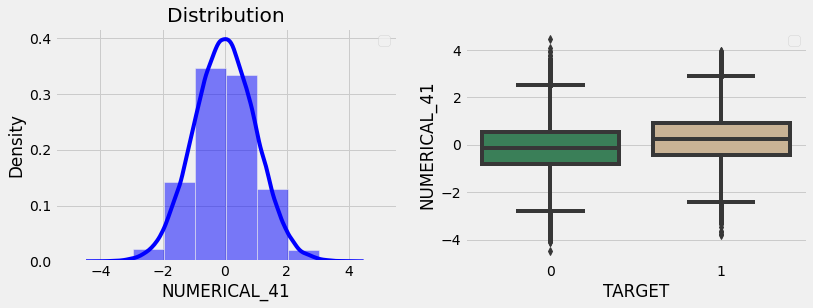

In [98]:
def plot_dis_int64(data,feature):
    target = 'TARGET'
    _, axes = plt.subplots(1,2, figsize=(12,4))
    sns.histplot(data[feature], kde=True, stat='density',discrete=True
                , color='blue', ax=axes[0])
    axes[0].legend()
    axes[0].set_title('Distribution')
    sns.boxplot(x=target,y=feature, data=data, palette=['seagreen','tan'])
#     plt.suptitle('{} distributions'.format(feature), y= 1.15);
    plt.legend()
    plt.show()
    
for num in num_feat:
    plot_dis_int64(df_raw,num)

In [237]:
print([x for x in df_raw['MONTH'].drop_duplicates()])

['2014-06', '2014-07', '2014-08', '2014-09', '2014-10', '2015-02', '2015-03', '2015-04', '2015-05']


In [6]:
used_feat = ['ID_APPLICATION','TIME','MONTH',
            'NUMERICAL_1', 'NUMERICAL_10', 'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41',
            'CATEGORICAL_1', 'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7',
            'CATEGORICAL_8', 'CATEGORICAL_9','CALC_CATEGORICAL_DAYNAME',
             'TARGET'
            ]
df_raw = df_raw[used_feat]

mths = ['2014-06', '2014-07', '2014-08', '2014-09', '2014-10', '2015-02', '2015-03', '2015-04']

df_train = df_raw.loc[df_raw['MONTH'].isin(mths)]
print(df_train['MONTH'].drop_duplicates())
df_test = df_raw.loc[df_raw['MONTH']=='2015-05']
print(df_test['MONTH'].drop_duplicates())

0         2014-06
6119      2014-07
24062     2014-08
42058     2014-09
59541     2014-10
130547    2015-02
146730    2015-03
164744    2015-04
Name: MONTH, dtype: object
182024    2015-05
Name: MONTH, dtype: object


In [7]:
print(df_train.isnull().sum())
print(df_test.isnull().sum())

ID_APPLICATION                  0
TIME                            0
MONTH                           0
NUMERICAL_1                     0
NUMERICAL_10                 3138
NUMERICAL_30                    0
NUMERICAL_40                38612
NUMERICAL_41                    0
CATEGORICAL_1                   0
CATEGORICAL_2               51257
CATEGORICAL_5               51257
CATEGORICAL_6                   0
CATEGORICAL_7                   0
CATEGORICAL_8                   0
CATEGORICAL_9                   0
CALC_CATEGORICAL_DAYNAME        0
TARGET                          0
dtype: int64
ID_APPLICATION                 0
TIME                           0
MONTH                          0
NUMERICAL_1                    0
NUMERICAL_10                   0
NUMERICAL_30                   0
NUMERICAL_40                5484
NUMERICAL_41                   0
CATEGORICAL_1                  0
CATEGORICAL_2               7125
CATEGORICAL_5               7125
CATEGORICAL_6                  0
CATEGORICAL_7

In [5]:
df_train.to_pickle("C:/Users/Admins/Desktop/df_train_LR1.pkl")
df_test.to_pickle("C:/Users/Admins/Desktop/df_test_LR1.pkl")

In [8]:
from sklearn.impute import SimpleImputer


target = ['TARGET']
feature = ['NUMERICAL_1', 'NUMERICAL_10', 'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41',
            'CATEGORICAL_1', 'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7',
            'CATEGORICAL_8', 'CATEGORICAL_9']


num_feat_imp = [col for col in df_train[feature].columns if df_train[feature][col].dtype==np.float64 and df_train[feature][col].isnull().sum() !=0]
cat_feat_imp = [col for col in df_train[feature].columns if df_train[feature][col].dtype==object and df_train[feature][col].isnull().sum() !=0] 

for col in df_train[feature].columns:
    if col in num_feat_imp:
        imp = SimpleImputer(missing_values=np.NaN, strategy='mean')
        df_train[col] = imp.fit_transform(df_train[col].values.reshape(-1,1))
        df_test[col]= imp.transform(df_test[col].values.reshape(-1,1))
    elif col in cat_feat_imp:
        most_frequent_val = df_train[col].mode()[0]
        df_train[col].fillna(most_frequent_val, inplace=True)
        df_test[col].fillna(most_frequent_val, inplace=True)
    else:
        pass

df_train.isnull().sum()

ID_APPLICATION              0
TIME                        0
MONTH                       0
NUMERICAL_1                 0
NUMERICAL_10                0
NUMERICAL_30                0
NUMERICAL_40                0
NUMERICAL_41                0
CATEGORICAL_1               0
CATEGORICAL_2               0
CATEGORICAL_5               0
CATEGORICAL_6               0
CATEGORICAL_7               0
CATEGORICAL_8               0
CATEGORICAL_9               0
CALC_CATEGORICAL_DAYNAME    0
TARGET                      0
dtype: int64

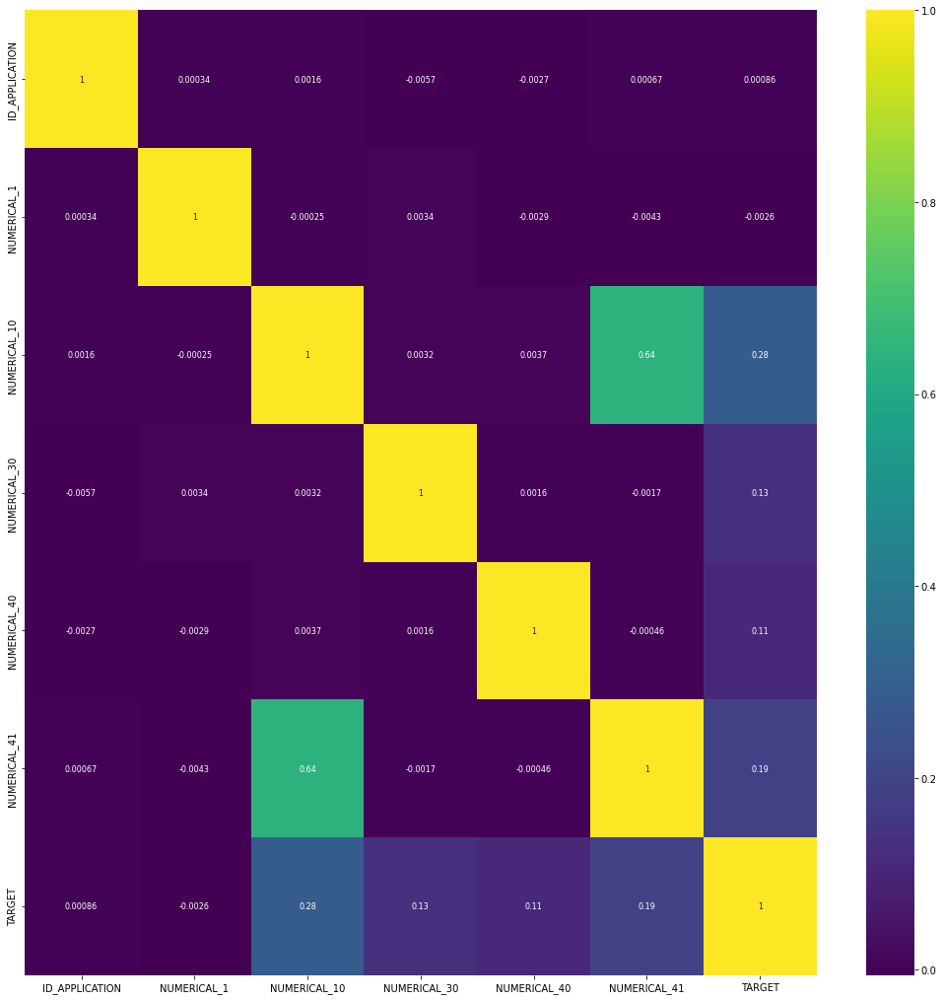

In [9]:
import numpy as np
np.bool = np.bool_
 
corr_feat = [col for col in df_train.columns if (df_train[col].dtype==np.float64) | (df_train[col].dtype==np.int64)]

 
corr =df_train[corr_feat].corr(method ='pearson')


lst=[]
 
for i in corr_feat:
    if(str(corr[i][i])=='nan'):
        lst.append(i)
for i in corr_feat:
    if i in lst:
        pass
    else:
        upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
        to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]
for i in to_drop:
    lst.append(i)
for i in lst:
    corr_feat.remove(i)

lst_used_var=[col for col in corr_feat if col not in lst]
plt.figure(figsize=(18,18))
cor1 = df_train[lst_used_var].corr()
sns.heatmap(cor1, annot=True, cmap="viridis",annot_kws={"size":8})
plt.show()
 

In [10]:
### NO NUMERICAL FEATURE HAS OVER >0.8 CORRELATED
print(lst)

[]


In [ ]:
NUMERICAL_1, NUMERICAL_10, NUMERICAL_30, NUMERICAL_40, NUMERICAL_41

In [11]:
pd.cut(df_train['NUMERICAL_1'].sort_values(),10).drop_duplicates()

43931     (0.686, 1.567]
136099    (1.567, 2.439]
149058    (2.439, 3.311]
22622     (3.311, 4.183]
140003    (4.183, 5.055]
148395    (5.055, 5.927]
44778     (5.927, 6.799]
134635    (6.799, 7.671]
38158     (7.671, 8.543]
2097      (8.543, 9.415]
Name: NUMERICAL_1, dtype: category
Categories (10, interval[float64, right]): [(0.686, 1.567] < (1.567, 2.439] < (2.439, 3.311] < (3.311, 4.183] ... (5.927, 6.799] < (6.799, 7.671] < (7.671, 8.543] < (8.543, 9.415]]

In [59]:
def default_bin(x):
    if x <1.567: return '01.<1.567'
    elif x <2.439: return '02.<2.439'
    elif x <3.311: return '03.<3.311'
    elif x <4.183: return '04.<4.183'
    elif x <5.055: return '05.<5.055'
    elif x <5.927: return '06.<5.927'
    elif x <6.799: return '07.<6.799'
    elif x <7.671: return '08.<7.671'
    elif x <8.543: return '09.<8.543'
    else: return '10.>=8.543'
    
df_train['NUMERICAL_1_BIN'] = df_train['NUMERICAL_1'].apply(lambda x: default_bin(x))
df_test['NUMERICAL_1_BIN'] = df_test['NUMERICAL_1'].apply(lambda x: default_bin(x))

df_train['NUMERICAL_1_BIN'].value_counts()

05.<5.055     40506
06.<5.927     38731
04.<4.183     20856
07.<6.799     18310
03.<3.311      5163
08.<7.671      4157
02.<2.439       629
09.<8.543       489
01.<1.567        42
10.>=8.543       28
Name: NUMERICAL_1_BIN, dtype: int64

In [163]:
pd.cut(df_train['NUMERICAL_10'].sort_values(),10).drop_duplicates()

49749     (-4.359, -3.459]
168437    (-3.459, -2.568]
61643     (-2.568, -1.676]
72943     (-1.676, -0.785]
40865      (-0.785, 0.106]
59882       (0.106, 0.997]
60250       (0.997, 1.889]
58899        (1.889, 2.78]
153684       (2.78, 3.671]
23253       (3.671, 4.562]
Name: NUMERICAL_10, dtype: category
Categories (10, interval[float64, right]): [(-4.359, -3.459] < (-3.459, -2.568] < (-2.568, -1.676] < (-1.676, -0.785] ... (0.997, 1.889] < (1.889, 2.78] < (2.78, 3.671] < (3.671, 4.562]]

In [60]:
def default_bin(x):
    if x <-3.459: return '01.<-3.459'
    elif x <-2.568: return '02.<-2.568'
    elif x <-1.676: return '03.<-1.676'
    elif x <-0.785: return '04.<-0.785'
    elif x <0.106: return '05.<0.106'
    elif x <0.997: return '06.<0.997'
    elif x <1.889: return '07.<1.889'
    elif x <2.78: return '08.<2.78'
    elif x <3.671: return '09.<3.671'
    else: return '10.>=3.671'
    
df_train['NUMERICAL_10_BIN'] = df_train['NUMERICAL_10'].apply(lambda x: default_bin(x))
df_test['NUMERICAL_10_BIN'] = df_test['NUMERICAL_10'].apply(lambda x: default_bin(x))

df_train['NUMERICAL_10_BIN'].value_counts()

05.<0.106     44349
06.<0.997     37468
04.<-0.785    21094
07.<1.889     16338
03.<-1.676     5287
08.<2.78       3366
02.<-2.568      625
09.<3.671       330
01.<-3.459       35
10.>=3.671       19
Name: NUMERICAL_10_BIN, dtype: int64

In [165]:
pd.cut(df_train['NUMERICAL_30'].sort_values(),10).drop_duplicates()

144615     (-4.366, -3.499]
1650        (-3.499, -2.64]
180661      (-2.64, -1.781]
33899      (-1.781, -0.922]
164533    (-0.922, -0.0632]
42650      (-0.0632, 0.796]
67997        (0.796, 1.654]
144294       (1.654, 2.513]
56596        (2.513, 3.372]
42039        (3.372, 4.231]
Name: NUMERICAL_30, dtype: category
Categories (10, interval[float64, right]): [(-4.366, -3.499] < (-3.499, -2.64] < (-2.64, -1.781] < (-1.781, -0.922] ... (0.796, 1.654] < (1.654, 2.513] < (2.513, 3.372] < (3.372, 4.231]]

In [61]:
def default_bin(x):
    if x <-3.499: return '01.<-3.499'
    elif x <-2.64: return '02.<-2.64'
    elif x <-1.781: return '03.<-1.781'
    elif x <-0.922: return '04.<-0.922'
    elif x <-0.0632: return '05.<-0.0632'
    elif x <0.796: return '06.<0.796'
    elif x <1.654: return '07.<1.654'
    elif x <2.513: return '08.<2.513'
    elif x <3.372: return '09.<3.372'
    else: return '10.>=3.372'
    
df_train['NUMERICAL_30_BIN'] = df_train['NUMERICAL_30'].apply(lambda x: default_bin(x))
df_test['NUMERICAL_30_BIN'] = df_test['NUMERICAL_30'].apply(lambda x: default_bin(x))

df_train['NUMERICAL_30_BIN'].value_counts()

06.<0.796      40041
05.<-0.0632    38303
07.<1.654      21283
04.<-0.922     18047
08.<2.513       5610
03.<-1.781      4279
09.<3.372        751
02.<-2.64        519
10.>=3.372        41
01.<-3.499        37
Name: NUMERICAL_30_BIN, dtype: int64

In [167]:
pd.cut(df_train['NUMERICAL_40'].sort_values(),10).drop_duplicates()

176704    (-8.719, -6.913]
23362     (-6.913, -5.125]
136683    (-5.125, -3.337]
149644    (-3.337, -1.549]
11258      (-1.549, 0.239]
145350      (0.239, 2.027]
56951       (2.027, 3.815]
132188      (3.815, 5.603]
176275      (5.603, 7.391]
26408       (7.391, 9.179]
Name: NUMERICAL_40, dtype: category
Categories (10, interval[float64, right]): [(-8.719, -6.913] < (-6.913, -5.125] < (-5.125, -3.337] < (-3.337, -1.549] ... (2.027, 3.815] < (3.815, 5.603] < (5.603, 7.391] < (7.391, 9.179]]

In [62]:
def default_bin(x):
    if x <-6.913: return '01.<-6.913'
    elif x <-5.125: return '02.<-5.125'
    elif x <-3.337: return '03.<-3.337'
    elif x <-1.549: return '04.<-1.549'
    elif x <0.239: return '05.<0.239'
    elif x <2.027: return '06.<2.027'
    elif x <3.815: return '07.<3.815'
    elif x <5.603: return '08.<5.603'
    elif x <7.391: return '09.<7.391'
    else: return '10.>=7.391'
    
df_train['NUMERICAL_40_BIN'] = df_train['NUMERICAL_40'].apply(lambda x: default_bin(x))
df_test['NUMERICAL_40_BIN'] = df_test['NUMERICAL_40'].apply(lambda x: default_bin(x))

df_train['NUMERICAL_40_BIN'].value_counts()

05.<0.239     68485
06.<2.027     26620
04.<-1.549    15571
07.<3.815     11389
03.<-3.337     3862
08.<5.603      2310
02.<-5.125      437
09.<7.391       204
01.<-6.913       19
10.>=7.391       14
Name: NUMERICAL_40_BIN, dtype: int64

In [169]:
pd.cut(df_train['NUMERICAL_41'].sort_values(),10).drop_duplicates()

25560        (-4.11, -3.283]
10100       (-3.283, -2.464]
2483        (-2.464, -1.645]
40902       (-1.645, -0.826]
1969      (-0.826, -0.00709]
70437      (-0.00709, 0.812]
25855         (0.812, 1.631]
15448          (1.631, 2.45]
132060         (2.45, 3.269]
167010        (3.269, 4.087]
Name: NUMERICAL_41, dtype: category
Categories (10, interval[float64, right]): [(-4.11, -3.283] < (-3.283, -2.464] < (-2.464, -1.645] < (-1.645, -0.826] ... (0.812, 1.631] < (1.631, 2.45] < (2.45, 3.269] < (3.269, 4.087]]

In [63]:
def default_bin(x):
    if x <-3.283: return '01.<-3.283'
    elif x <-2.464: return '02.<-2.464'
    elif x <-1.645: return '03.<-1.645'
    elif x <-0.826: return '04.<-0.826'
    elif x <-0.00709: return '05.<-0.00709'
    elif x <0.812: return '06.<0.812'
    elif x <1.631: return '07.<1.631'
    elif x <2.45: return '08.<2.45'
    elif x <3.269: return '09.<3.269'
    else: return '10.>=3.269'
    
df_train['NUMERICAL_41_BIN'] = df_train['NUMERICAL_41'].apply(lambda x: default_bin(x))
df_test['NUMERICAL_41_BIN'] = df_test['NUMERICAL_41'].apply(lambda x: default_bin(x))

df_train['NUMERICAL_41_BIN'].value_counts()

05.<-0.00709    37918
06.<0.812       37633
07.<1.631       20334
04.<-0.826      19957
08.<2.45         5668
03.<-1.645       5570
09.<3.269         868
02.<-2.464        826
10.>=3.269         75
01.<-3.283         62
Name: NUMERICAL_41_BIN, dtype: int64

In [64]:
def psi_calc(df_dev, df_val, col):
    
    df_dev = df_dev.groupby(col).agg(cnt_app_dev=(col,'count')).reset_index()
    df_dev['total_dev'] = df_dev['cnt_app_dev'].sum()
    df_dev['per_obs_dev']=0
    for i in range(0,len(df_dev)):
        df_dev['per_obs_dev'][i] = df_dev['cnt_app_dev'][i]/df_dev['total_dev'][i]
        
        
    df_val = df_val.groupby(col).agg(cnt_app_val=(col,'count')).reset_index()
    df_val['total_val'] = df_val['cnt_app_val'].sum()
    df_val['per_obs_val']=0
    for i in range(0,len(df_val)):
        df_val['per_obs_val'][i] = df_val['cnt_app_val'][i]/df_val['total_val'][i]
        
    df = df_dev.merge(df_val,how='left',on=col)      

    df.drop(columns=['total_dev','total_val'],axis=1,inplace=True)
    df['feature_name'] = col 
    df = df.rename(columns={col: "feature_value"})      
    
    df= df[['feature_name', 'feature_value', 'cnt_app_dev', 'per_obs_dev', 'cnt_app_val','per_obs_val']]
    
    def sub_psi(e_perc, a_perc):
        if a_perc == 0: a_perc = 0.0001
        if e_perc == 0: e_perc = 0.0001
        value = (e_perc - a_perc) * np.log(e_perc / a_perc)
        return(value)
    
        
    df['psi_value']=0

    for i in range(0, len(df)):
        df['psi_value'][i] = np.sum(sub_psi(df['per_obs_dev'][i], df['per_obs_val'][i]))
    
    df['psi_total'] = df['psi_value'].sum()

    df['psi_comment'] =  df['psi_total'].apply(lambda x: 'No change' if x < 0.1 else 
                                                          ('Significant change is required' if x >= 0.2 else
                                                            ('Slight change is required' if x < 0.2 else x)
                                                          )
                                                      ) 

    return df


cols_psi = [col for col in df_train.columns if col.startswith('CAT') | col.startswith('CALC') | col.endswith('BIN')]

for col in cols_psi:
    print(psi_calc(df_train,df_test,col))

    feature_name feature_value  cnt_app_dev  per_obs_dev  cnt_app_val  \
0  CATEGORICAL_1         DVSOM        42746     0.331593         6030   
1  CATEGORICAL_1         FCOHQ        43162     0.334820         6008   
2  CATEGORICAL_1         OMFDE        43003     0.333587         5938   

   per_obs_val  psi_value  psi_total psi_comment  
0     0.335447   0.000045   0.000078   No change  
1     0.334223   0.000001   0.000078   No change  
2     0.330329   0.000032   0.000078   No change  
    feature_name feature_value  cnt_app_dev  per_obs_dev  cnt_app_val  \
0  CATEGORICAL_2            AA        38799     0.300975         5421   
1  CATEGORICAL_2            AB        90112     0.699025        12555   

   per_obs_val     psi_value  psi_total psi_comment  
0     0.301569  1.169842e-06   0.000002   No change  
1     0.698431  5.044030e-07   0.000002   No change  
    feature_name feature_value  cnt_app_dev  per_obs_dev  cnt_app_val  \
0  CATEGORICAL_5            TR        38824     

In [31]:
## remove CATEGORICAL_7 due to significantly shifting

print(list(df_train.columns))

['ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_1', 'NUMERICAL_10', 'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41', 'CATEGORICAL_1', 'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7', 'CATEGORICAL_8', 'CATEGORICAL_9', 'TARGET']


In [27]:
df_train['MONTH'].drop_duplicates()

0         2014-06
6119      2014-07
24062     2014-08
42058     2014-09
59541     2014-10
130547    2015-02
146730    2015-03
164744    2015-04
Name: MONTH, dtype: object

In [8]:
from sklearn.metrics import mean_squared_error
from category_encoders.woe import WOEEncoder
from xgboost.sklearn import XGBClassifier

target = ['TARGET']

feature = [ 'NUMERICAL_41','CATEGORICAL_8','NUMERICAL_10','NUMERICAL_30','NUMERICAL_1','NUMERICAL_40', 
            'CATEGORICAL_1','CATEGORICAL_9', 'CATEGORICAL_5','CATEGORICAL_2', 'CATEGORICAL_6', 'CALC_CATEGORICAL_DAYNAME'
            ]

def check_mse(X_train, y_train, X_test, y_test):
    
    selected_features = []
    selected_mse = []
    init_mse = []
    init_feature =[]  
    gini_train_scr = []
    gini_test_scr = []
    
#     X_train = df_train[feature]    
#     y_train = df_train[target]  
#     X_test = df_test[feature]    
#     y_test = df_test[target]  

    encoder = WOEEncoder()
    X_train = encoder.fit_transform(X_train,y=y_train)
    X_test = encoder.transform(X_test) 
    
    features = list(X_train.columns)

    model = XGBClassifier(random_state=42)

    for feature in features:
        
        model.fit(X_train[feature], y_train)
        y_pred_test = model.predict(X_test[feature])
        mse = mean_squared_error(y_test, y_pred_test)
        init_mse.append(mse)    
        init_feature.append(feature)        
    
    for k, v in zip(init_feature, init_mse):
        if v == min(init_mse):
            selected_features.append(k)
            selected_mse.append(v)
              
    remaining_features = list([x for x in X_train.columns if x not in selected_features])
    
    for feature in remaining_features:
        model_features = selected_features + [feature]
        model.fit(X_train[model_features], y_train)
        
        y_pred_test = model.predict(X_test[model_features])
        mse = mean_squared_error(y_test, y_pred_test)
        
        if mse < min(selected_mse):
            selected_mse.append(mse)    
            selected_features.append(feature)
    
    for i in range(1,len(selected_features)+1):
        model_features = selected_features[:i]
        model.fit(X_train[model_features], y_train)

        y_pred_train = model.predict(X_train[model_features])
        auc_train = roc_auc_score(y_train, y_pred_train)
        gini_train=(2*auc_train-1)*100
        gini_train_scr.append(gini_train)

        y_pred_test = model.predict(X_test[model_features])
        auc_test = roc_auc_score(y_test, y_pred_test)
        gini_test=(2*auc_test-1)*100
        gini_test_scr.append(gini_test)

    return selected_features, selected_mse, gini_train_scr, gini_test_scr

selected_features, selected_mse, gini_train_scr, gini_test_scr = check_mse(df_train[feature], df_train[target], df_test[feature], df_test[target])

print(selected_features)
print(selected_mse)

['NUMERICAL_10', 'NUMERICAL_41', 'CATEGORICAL_8', 'NUMERICAL_30', 'NUMERICAL_1', 'NUMERICAL_40', 'CATEGORICAL_1', 'CATEGORICAL_5', 'CATEGORICAL_2', 'CATEGORICAL_6', 'CALC_CATEGORICAL_DAYNAME']
[0.3385068980863373, 0.33739430351579885, 0.33060747663551404, 0.32242990654205606, 0.30568535825545173, 0.2917779261237205, 0.27442145082332, 0.26618825100133514, 0.26340676457498885, 0.2479973297730307, 0.24755229194481532]


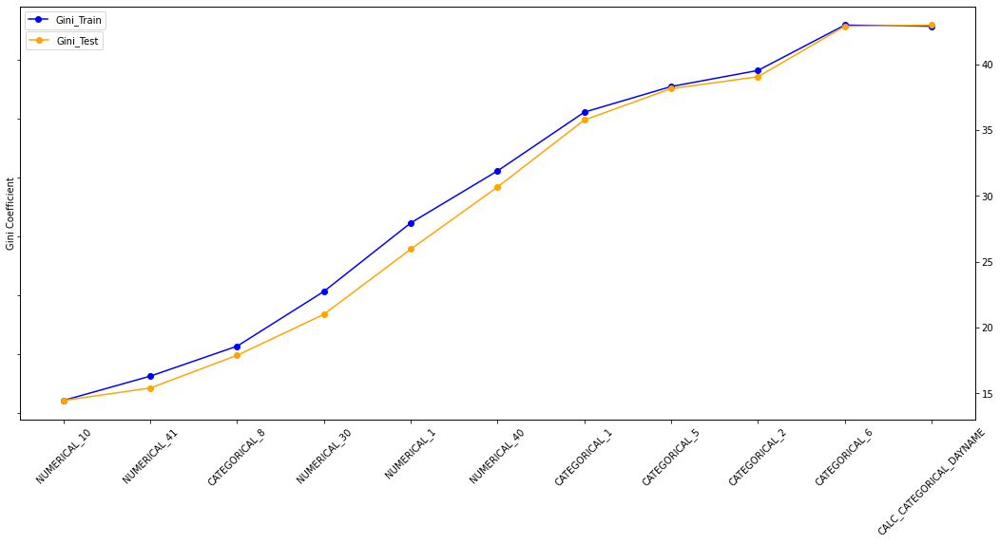

In [9]:
def plot(selected_features, selected_mse, train, test):
    categories = selected_features
    line_data_train = train
    line_data_test = test
    fig, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    ax1.plot(selected_features, line_data_train, color='blue', marker='o', label = 'Gini_Train')
    ax1.set_ylabel('Gini Coefficient')
    ax1.legend(loc='upper left')
    ax1.tick_params(axis='x', rotation=45)
    ax1.yaxis.set_tick_params(labelleft=False)
    
    ax2.plot(selected_features, line_data_test, color='orange', marker='o', label = 'Gini_Test')
    ax2.legend(loc='upper left', bbox_to_anchor=(0.001, 0.95))

#     ax3 = ax1.twinx()
#     ax3.plot(selected_features, selected_mse, color='red', marker='o', label = 'Mean_squared_error')
#     ax3.legend(loc='upper left', bbox_to_anchor=(0.001, 0.90))
#     ax3.yaxis.set_tick_params(labelright=False)
    
    plt.gcf().set_size_inches(18, 8) 
    plt.show()
    
plot(selected_features,selected_mse, gini_train_scr, gini_test_scr)

In [45]:
from sklearn.feature_selection import SelectFromModel
from numpy import sort

def best_accuracy_SelectFromModel(X_train, y_train, X_test, y_test):
    
    lst_accuracy = []
    lst_thresh = []
    
    encoder = WOEEncoder()
    X_train = encoder.fit_transform(X_train,y=y_train)
    X_test = encoder.transform(X_test) 
    
    model = XGBClassifier()
    model.fit(X_train, y_train)

    thresholds = sort(model.feature_importances_)

    for thresh in thresholds:
        lst_thresh.append(thresh)
        selection = SelectFromModel(model, threshold=thresh, prefit=True)
        select_X_train = selection.transform(X_train)

        selection_model = XGBClassifier()
        selection_model.fit(select_X_train, y_train)

        select_X_test = selection.transform(X_test)
        predictions = selection_model.predict(select_X_test)
        accuracy = accuracy_score(y_test, predictions)
        lst_accuracy.append(accuracy)
        
        print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy*100.0)) 

    best_thresh = 0
    
    for x, y in zip(lst_thresh, lst_accuracy):
        if y == max(lst_accuracy):
            best_thresh = x
            
    del selection        

    selection = SelectFromModel(model, threshold=best_thresh)         
    selection.fit(X_train, y_train)
    
    mask = selection.get_support()

    feature_names = X_train.columns
    n_selected_features = len([feature_names[i] for i in range(len(mask)) if mask[i]])
    selected_features = [feature_names[i] for i in range(len(mask)) if mask[i]]
         
    
    print("Best thresh=%.3f, n=%d" % (best_thresh, n_selected_features))  
    print("List selected features: ", selected_features)

    
best_accuracy_SelectFromModel(df_train[selected_features], df_train[target], df_test[selected_features], df_test[target])

Thresh=0.007, n=11, Accuracy: 75.24%
Thresh=0.012, n=10, Accuracy: 75.20%
Thresh=0.029, n=9, Accuracy: 75.23%
Thresh=0.042, n=8, Accuracy: 74.93%
Thresh=0.044, n=7, Accuracy: 73.18%
Thresh=0.084, n=6, Accuracy: 71.66%
Thresh=0.126, n=5, Accuracy: 67.86%
Thresh=0.135, n=4, Accuracy: 67.29%
Thresh=0.136, n=3, Accuracy: 66.99%
Thresh=0.169, n=2, Accuracy: 65.70%
Thresh=0.215, n=1, Accuracy: 63.71%
Best thresh=0.007, n=11
List selected features:  ['NUMERICAL_10', 'NUMERICAL_41', 'CATEGORICAL_8', 'NUMERICAL_30', 'NUMERICAL_1', 'NUMERICAL_40', 'CATEGORICAL_1', 'CATEGORICAL_5', 'CATEGORICAL_2', 'CATEGORICAL_6', 'CALC_CATEGORICAL_DAYNAME']


In [29]:
# X_train = df_train[selected_features]
# y_train = df_train[target]

# X_test = df_test[selected_features]
# y_test = df_test[target]

# encoder = WOEEncoder()
# X_train = encoder.fit_transform(X_train,y=y_train)
# X_test = encoder.transform(X_test) 

# model = XGBClassifier()
# model.fit(X_train, y_train)
    
# #     0.007080878
    
# selection = SelectFromModel(model, threshold=0.007080878, prefit=True)
# # select_X_train = selection.transform(X_train)

# mask = selection.get_support()
# print(mask)


# feature_names = X_train.columns
# print([feature_names[i] for i in range(len(mask)) if mask[i]])
# print(len([feature_names[i] for i in range(len(mask)) if mask[i]]))

# # # Retrieve selected feature names
# # selected_features = X_train.columns[mask]



# # selection_model = XGBClassifier()
# # selection_model.fit(select_X_train, y_train)

# # select_X_test = selection.transform(X_test)
# # predictions = selection_model.predict(select_X_test)
# # accuracy = accuracy_score(y_test, predictions)
# # print(select_X_train.shape[1])
# # print(select_X_train)
# # print("Selected features:", selected_features)

[ True  True  True  True  True  True  True  True  True  True  True]
['NUMERICAL_10', 'NUMERICAL_41', 'CATEGORICAL_8', 'NUMERICAL_30', 'NUMERICAL_1', 'NUMERICAL_40', 'CATEGORICAL_1', 'CATEGORICAL_5', 'CATEGORICAL_2', 'CATEGORICAL_6', 'CALC_CATEGORICAL_DAYNAME']
11


In [12]:
from sklearn.preprocessing import StandardScaler
from category_encoders.woe import WOEEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from scipy.stats import randint
from scipy import stats
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
# from sklearn.model_selection import GridSearchCV
from sklearn import neighbors
from sklearn.metrics import classification_report
from matplotlib import pyplot
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
 
target = ['TARGET']

feature = ['NUMERICAL_10','NUMERICAL_41','CATEGORICAL_8','NUMERICAL_30','NUMERICAL_1',
           'NUMERICAL_40','CATEGORICAL_1','CATEGORICAL_5','CATEGORICAL_2','CATEGORICAL_6','CALC_CATEGORICAL_DAYNAME']

X_train = df_train[feature]    
y_train = df_train[target]  
X_test = df_test[feature]    
y_test = df_test[target]  

encoder = WOEEncoder()
X_train = encoder.fit_transform(X_train,y=y_train)
X_test = encoder.transform(X_test)

scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)
 
clf_xgb=xgb.XGBClassifier(random_state=42)
 
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
 
params = {
    'max_depth': [3],
    'early_stopping_rounds': [20],
    'learning_rate': [0.01],
    'n_estimators': [1000],
    'min_child_weight' : [20],  ## Larger values avoid over-fitting.
}
    
rs_model=RandomizedSearchCV(clf_xgb
                            ,param_distributions=params
                            ,n_iter=100
                            ,scoring='roc_auc'
                            ,n_jobs=-1
                            ,cv=skf
                            ,verbose=3)
 
    
rs_model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=True)

rs_model.best_params_

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[0]	validation_0-logloss:0.69126	validation_1-logloss:0.69129
[1]	validation_0-logloss:0.68942	validation_1-logloss:0.68945
[2]	validation_0-logloss:0.68761	validation_1-logloss:0.68766
[3]	validation_0-logloss:0.68583	validation_1-logloss:0.68590
[4]	validation_0-logloss:0.68409	validation_1-logloss:0.68417
[5]	validation_0-logloss:0.68238	validation_1-logloss:0.68246
[6]	validation_0-logloss:0.68070	validation_1-logloss:0.68079
[7]	validation_0-logloss:0.67906	validation_1-logloss:0.67914
[8]	validation_0-logloss:0.67744	validation_1-logloss:0.67753
[9]	validation_0-logloss:0.67585	validation_1-logloss:0.67595
[10]	validation_0-logloss:0.67429	validation_1-logloss:0.67439
[11]	validation_0-logloss:0.67276	validation_1-logloss:0.67287
[12]	validation_0-logloss:0.67126	validation_1-logloss:0.67138
[13]	validation_0-logloss:0.66978	validation_1-logloss:0.66990
[14]	validation_0-logloss:0.66833	validation_1-logloss:0.66846
[15]	v

{'n_estimators': 1000,
 'min_child_weight': 20,
 'max_depth': 3,
 'learning_rate': 0.01,
 'early_stopping_rounds': 20}

In [13]:
xgb_save=rs_model.best_estimator_
xgb_save.save_model('HC_XGBOOST.model')

AUC train: 82.09
AUC test: 81.69
GINI train: 64.19
GINI test: 63.39


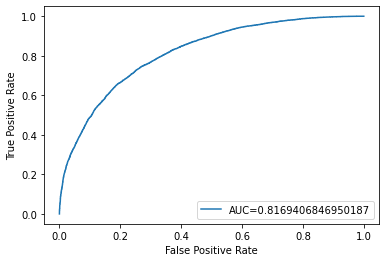

              precision    recall  f1-score   support

           0       0.77      0.88      0.82     11453
           1       0.72      0.54      0.61      6523

    accuracy                           0.76     17976
   macro avg       0.74      0.71      0.72     17976
weighted avg       0.75      0.76      0.75     17976



In [14]:
from sklearn import metrics   #Additional scklearn functions
 
bst = xgb.Booster({'nthread': 8})  # init model
bst.load_model('HC_XGBOOST.model')
 
dtotal = xgb.DMatrix(X_train)
y_pred_train = bst.predict(dtotal)
roc_auc_train =  metrics.roc_auc_score(y_train,y_pred_train)
gini_train = 2*roc_auc_train - 1
 
del dtotal
    
dtotal = xgb.DMatrix(X_test)
ypred_test_xgb = bst.predict(dtotal)
roc_auc_test =  metrics.roc_auc_score(y_test,ypred_test_xgb)
gini_test = 2*roc_auc_test - 1

print('AUC train: %.2f'%(roc_auc_train*100))
print('AUC test: %.2f'%(roc_auc_test*100))
 
print('GINI train: %.2f'%(gini_train*100))
print('GINI test: %.2f'%(gini_test*100))

#create ROC curve

fpr, tpr, _ = metrics.roc_curve(y_test,  ypred_test_xgb)  
plt.plot(fpr,tpr,label="AUC="+str(roc_auc_test))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()
 
predictions = rs_model.predict(X_test)
print(classification_report(y_test,predictions))


0.41526815324597943


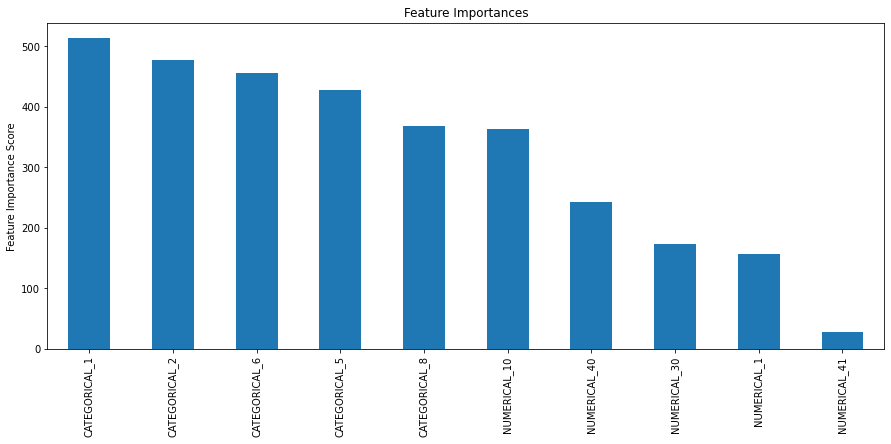

In [53]:
target = ['TARGET']

feature = ['NUMERICAL_10','NUMERICAL_41','CATEGORICAL_8','NUMERICAL_30','NUMERICAL_1',
           'NUMERICAL_40','CATEGORICAL_1','CATEGORICAL_5','CATEGORICAL_2','CATEGORICAL_6','CALC_CATEGORICAL_DAYNAME']



X_train = df_train[feature]    
y_train = df_train[target]  
X_test = df_test[feature]    
y_test = df_test[target]  

encoder = WOEEncoder()
X_train = encoder.fit_transform(X_train,y=y_train)
X_test = encoder.transform(X_test) 

xgb1 = XGBClassifier(max_depth=3,
    learning_rate=0.01,
    n_estimators=1000,
    min_child_weight=20)

def modelfit(alg, X, y):
    
    alg.fit(X, y)
    d_predprob = alg.predict(X)
    roc_auc =  metrics.roc_auc_score(y, d_predprob)
    GINI = 2*roc_auc-1
    print(GINI)
    
#     feature_importance = alg.feature_importances_
#     feature_names = X_train.columns
#     feature_importance_list = sorted(zip(feature_names, feature_importance), key=lambda x: x[1], reverse=True)
    
#     used_feat = []
    
#     for feature, importance in feature_importance_list:
#         print(f'{feature}: {importance}')
#         if importance > thres:
#             used_feat.append(feature)
        
#     print(used_feat)   
    
    feat_imp = pd.Series(alg.get_booster().get_score(importance_type='gain')).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.gcf().set_size_inches(15, 6) 
    plt.tick_params(axis='x', rotation=90)
    plt.ylabel('Feature Importance Score')
    
modelfit(xgb1, X_train, y_train)

0.43907927618757503


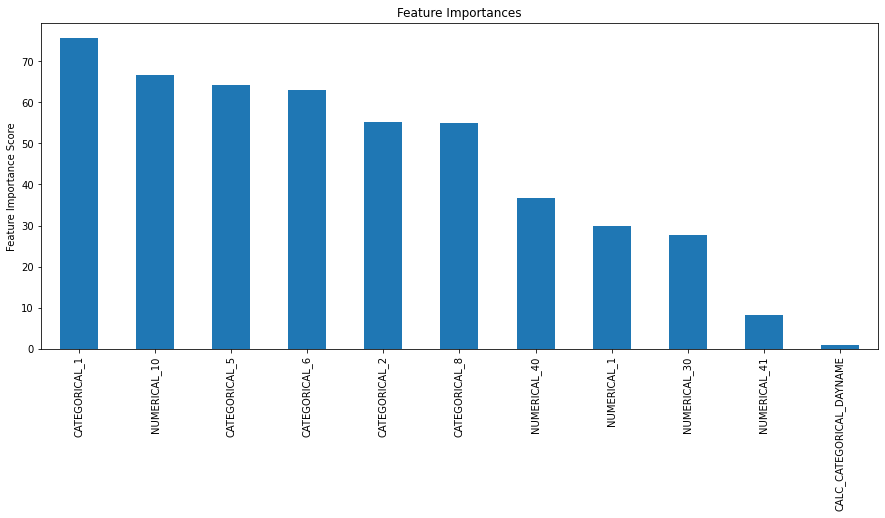

In [54]:
modelfit(xgb1, X_test, y_test)

In [16]:
# mydf=data_dev.loc[data_dev['approve_month'].isin(mth_train)]
ks_cols =['TARGET','ID_APPLICATION','MONTH','NUMERICAL_10','NUMERICAL_41','CATEGORICAL_8','NUMERICAL_30','NUMERICAL_1',
           'NUMERICAL_40','CATEGORICAL_1','CATEGORICAL_5','CATEGORICAL_2','CATEGORICAL_6','CALC_CATEGORICAL_DAYNAME']
mydf=df_train[ks_cols]

bst = xgb.Booster({'nthread': 8})
bst.load_model('HC_XGBOOST.model') 
dtotal = xgb.DMatrix(X_train)
y_pred_train = bst.predict(dtotal)
mydf['SCORE']=y_pred_train
mydf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 128911 entries, 0 to 182023
Data columns (total 15 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   TARGET                    128911 non-null  int64  
 1   ID_APPLICATION            128911 non-null  int64  
 2   MONTH                     128911 non-null  object 
 3   NUMERICAL_10              128911 non-null  float64
 4   NUMERICAL_41              128911 non-null  float64
 5   CATEGORICAL_8             128911 non-null  object 
 6   NUMERICAL_30              128911 non-null  float64
 7   NUMERICAL_1               128911 non-null  float64
 8   NUMERICAL_40              128911 non-null  float64
 9   CATEGORICAL_1             128911 non-null  object 
 10  CATEGORICAL_5             128911 non-null  object 
 11  CATEGORICAL_2             128911 non-null  object 
 12  CATEGORICAL_6             128911 non-null  object 
 13  CALC_CATEGORICAL_DAYNAME  128911 non-null  o

In [17]:
def ks(data=None,target=None, prob=None):
    data['target0'] = 1 - data[target]
    data['bucket'] = pd.qcut(data[prob], 10)
    grouped = data.groupby('bucket', as_index = False)
    kstable = pd.DataFrame()
    kstable['min_prob'] = grouped.min()[prob]
    kstable['max_prob'] = grouped.max()[prob]
    kstable['events']   = grouped.sum()[target]
    kstable['nonevents'] = grouped.sum()['target0']
    kstable = kstable.sort_values(by="min_prob", ascending=True).reset_index(drop = True)
    kstable['event_rate'] = (kstable.events / data[target].sum()).apply('{0:.2%}'.format)
    kstable['nonevent_rate'] = (kstable.nonevents / data['target0'].sum()).apply('{0:.2%}'.format)
    kstable['cum_eventrate_value']=(kstable.events / data[target].sum()).cumsum()
    kstable['cum_noneventrate_value']=(kstable.nonevents / data['target0'].sum()).cumsum()
    kstable['KS'] = abs(np.round(kstable['cum_eventrate_value']-kstable['cum_noneventrate_value'], 3) * 100)

    #Formating
    kstable['cum_eventrate']= kstable['cum_eventrate_value'].apply('{0:.2%}'.format)
    kstable['cum_noneventrate']= kstable['cum_noneventrate_value'].apply('{0:.2%}'.format)
    kstable.index = range(1,11)
    kstable.index.rename('Decile', inplace=True)
    pd.set_option('display.max_columns', 9)
    print(kstable)
    
    #Display KS
    from colorama import Fore
    print(Fore.RED + "KS is " + str(max(kstable['KS']))+"%"+ " at decile " + str((kstable.index[kstable['KS']==max(kstable['KS'])][0])))
    return(kstable)

mydf = ks(data=mydf,target='TARGET',prob='SCORE')
mydf['map'] = mydf['min_prob'].astype(str)+' - '+mydf['max_prob'].astype(str)

        min_prob  max_prob  events  nonevents  ... cum_noneventrate_value  \
Decile                                         ...                          
1       0.006381  0.094570     324      12568  ...               0.152102   
2       0.094572  0.149104     954      11937  ...               0.296567   
3       0.149108  0.202477    1743      11148  ...               0.431483   
4       0.202482  0.259581    2597      10294  ...               0.556064   
5       0.259584  0.322181    3476       9415  ...               0.670007   
6       0.322182  0.392581    4495       8396  ...               0.771618   
7       0.392581  0.472049    5824       7067  ...               0.857145   
8       0.472050  0.566387    7071       5820  ...               0.927580   
9       0.566392  0.686822    8713       4178  ...               0.978143   
10      0.686827  0.979877   11085       1806  ...               1.000000   

          KS  cum_eventrate  cum_noneventrate  
Decile                     

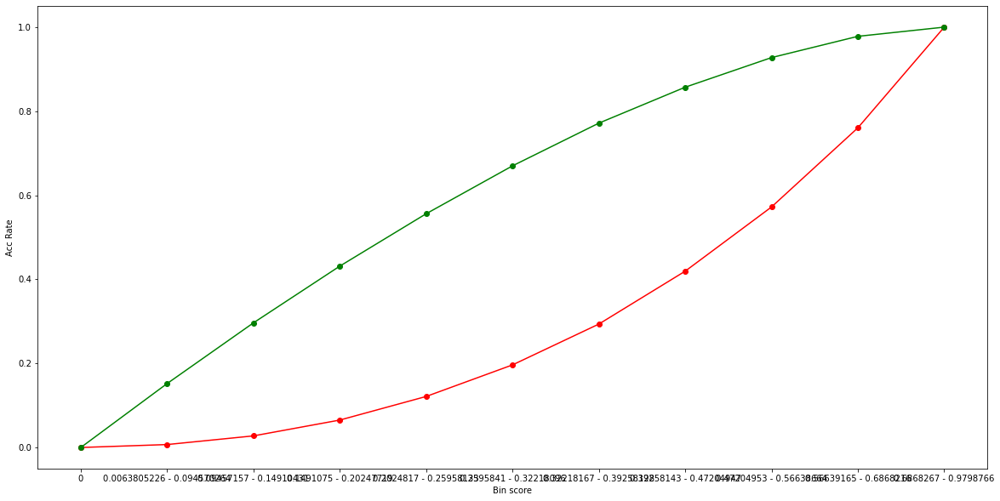

In [18]:
mydf['map'] = mydf['min_prob'].astype(str)+' - '+ mydf['max_prob'].astype(str)
plt.figure(figsize=(20,10))
plt.plot(['0']+list(mydf['map']),[0]+list(mydf['cum_eventrate_value']),'ro-')
plt.plot(['0']+list(mydf['map']),[0]+list(mydf['cum_noneventrate_value']),'go-')
plt.ylabel('Acc Rate')
plt.xlabel('Bin score')
plt.show()

In [22]:
data = df_test[ks_cols].reset_index()
data.drop(columns=['index'],axis=1,inplace=True)
bst = xgb.Booster({'nthread': 8})  # init model
bst.load_model('HC_XGBOOST.model')  # load data

dtotal = xgb.DMatrix(X_test)
ypred = bst.predict(dtotal)
data['score_raw']=ypred
data['GOOD'] = np.where((data['TARGET']==0) &(data['score_raw']<0.322182),1,0)
# data['score_bin'] = data['score_raw'].apply(lambda x: 1 if x <0.322182 else 0)
data

,TARGET,ID_APPLICATION,MONTH,NUMERICAL_10,...,CATEGORICAL_6,CALC_CATEGORICAL_DAYNAME,score_raw,GOOD
0,0,182024,2015-05,-0.044272,...,A,FRI_SAT_SUN,0.187029,1
1,1,182025,2015-05,-0.470032,...,A,FRI_SAT_SUN,0.512932,0
2,1,182026,2015-05,-0.655855,...,C,FRI_SAT_SUN,0.338064,0
3,0,182027,2015-05,-0.539909,...,C,FRI_SAT_SUN,0.104572,1
4,1,182028,2015-05,-0.417203,...,A,FRI_SAT_SUN,0.205441,0
...,...,...,...,...,...,...,...,...,...
17971,1,199995,2015-05,0.189615,...,A,FRI_SAT_SUN,0.750672,0
17972,0,199996,2015-05,-0.650916,...,C,FRI_SAT_SUN,0.136978,1
17973,0,199997,2015-05,1.011599,...,A,FRI_SAT_SUN,0.214272,1
17974,1,199998,2015-05,0.564535,...,B,FRI_SAT_SUN,0.630037,0


In [24]:
df_ab_xgb = data[['ID_APPLICATION','MONTH','TARGET','GOOD']]

# df_ab_xgb['BAD']=0
df_ab_xgb['ALG'] = 'XGB'

# for i in range(0,len(df_ab_xgb)):
#     if df_ab_xgb['score_bin'][i] ==1 and df_ab_xgb['TARGET'][i] ==1:
#         df_ab_xgb['BAD'][i] =1 
        
df_ab_xgb

,ID_APPLICATION,MONTH,TARGET,GOOD,ALG
0,182024,2015-05,0,1,XGB
1,182025,2015-05,1,0,XGB
2,182026,2015-05,1,0,XGB
3,182027,2015-05,0,1,XGB
4,182028,2015-05,1,0,XGB
...,...,...,...,...,...
17971,199995,2015-05,1,0,XGB
17972,199996,2015-05,0,1,XGB
17973,199997,2015-05,0,1,XGB
17974,199998,2015-05,1,0,XGB


In [25]:
df_ab_xgb.to_csv('C:\\Users\\Admins\\Desktop\\df_ab_xgb.csv')

In [26]:
### ----------------- LOGISTIC REGRESSION ----------------- 
### ----------------- LOGISTIC REGRESSION ----------------- 
### ----------------- LOGISTIC REGRESSION ----------------- 

df_train = pd.read_pickle("C:/Users/Admins/Desktop/df_train_LR1.pkl")
df_test= pd.read_pickle("C:/Users/Admins/Desktop/df_test_LR1.pkl")

print(df_train.shape)
print(df_train.columns)

(128911, 17)
Index(['ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_1', 'NUMERICAL_10',
       'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41', 'CATEGORICAL_1',
       'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7',
       'CATEGORICAL_8', 'CATEGORICAL_9', 'CALC_CATEGORICAL_DAYNAME', 'TARGET'],
      dtype='object')


In [3]:
df_test.shape

(17976, 17)

In [7]:
# used_col = ['TARGET','ID_APPLICATION', 'TIME', 'MONTH','NUMERICAL_1', 'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41',
#             'NUMERICAL_10', 'CATEGORICAL_1', 'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_8'
#             , 'CATEGORICAL_9']

# df_train = df_train[used_col]
# df_test = df_test[used_col]

df_train.head()

,ID_APPLICATION,TIME,MONTH,NUMERICAL_1,NUMERICAL_10,NUMERICAL_30,NUMERICAL_40,NUMERICAL_41,CATEGORICAL_1,CATEGORICAL_2,CATEGORICAL_5,CATEGORICAL_6,CATEGORICAL_7,CATEGORICAL_8,CATEGORICAL_9,CALC_CATEGORICAL_DAYNAME,TARGET
0,0,2014-06-20 11:03:04,2014-06,6.273278,1.158706,2.501600,3.030291,1.433575,DVSOM,AB,TR,C,A,BB,AA,FRI_SAT_SUN,1
1,1,2014-06-20 11:05:39,2014-06,5.662506,0.157380,-0.491356,-1.481401,-0.022775,OMFDE,AA,WE,A,A,AA,BB,FRI_SAT_SUN,0
2,2,2014-06-20 11:07:00,2014-06,5.782492,0.754308,-1.251672,3.040916,0.128277,DVSOM,AB,TR,C,C,BB,BB,FRI_SAT_SUN,0
3,3,2014-06-20 11:09:38,2014-06,4.736009,-0.131544,-0.294676,0.667023,-0.134636,DVSOM,AB,TR,A,A,AA,BB,FRI_SAT_SUN,0
4,4,2014-06-20 11:11:10,2014-06,5.323432,0.612547,0.506040,-1.004300,-0.472046,OMFDE,NaN,NaN,B,B,BB,BB,FRI_SAT_SUN,0


In [5]:
df_train.isnull().sum()

ID_APPLICATION                  0
TIME                            0
MONTH                           0
NUMERICAL_1                     0
NUMERICAL_10                 3138
NUMERICAL_30                    0
NUMERICAL_40                38612
NUMERICAL_41                    0
CATEGORICAL_1                   0
CATEGORICAL_2               51257
CATEGORICAL_5               51257
CATEGORICAL_6                   0
CATEGORICAL_7                   0
CATEGORICAL_8                   0
CATEGORICAL_9                   0
CALC_CATEGORICAL_DAYNAME        0
TARGET                          0
dtype: int64

In [27]:
from optbinning import OptimalBinning  

def rank_iv(iv):
    if iv <= 0.02:  return 'Useless'
    elif iv <= 0.1: return 'Weak'
    elif iv <= 0.3: return 'Medium'
    elif iv <= 0.5: return 'Strong'
    else:           return 'suspicious'

def rev_bin_num(data,feat):
    x = data[feat].values
    y = data['TARGET'].values
    optb3 = OptimalBinning(dtype="numerical",solver="cp")
    optb3.fit(x,y)
    rev= optb3.binning_table.build()
    rev_bin= rev[['Bin','Count','Count (%)','Non-event','Event','Event rate','WoE','IV']]
    rev_bin = rev_bin.rename(columns={"Bin": "bins", "WoE": "WOE", "Non-event": "#GOOD", "Event": "#BAD"})
    rev_bin = rev_bin.reset_index().drop(columns=['index'])
    rev_bin = rev_bin.loc[~rev_bin['bins'].isin([''])]
    rev_bin['IV'] = rev_bin['IV'].sum()
    rev_bin['IV_Rank'] = rev_bin['IV'].apply(lambda x: rank_iv(x))
    return rev_bin

def rev_bin_cat(data,feat):
    x = data[feat].values
    y = data['TARGET'].values
    optb3 = OptimalBinning(dtype="categorical",solver="cp")
    optb3.fit(x,y)
    rev= optb3.binning_table.build()
    rev_bin_cat= rev[['Bin','Count','Count (%)','Non-event','Event','Event rate','WoE','IV']]
    rev_bin_cat = rev_bin_cat.rename(columns={"Bin": "bins","WoE": "WOE", "Non-event": "#GOOD", "Event": "#BAD"})
    rev_bin_cat = rev_bin_cat.reset_index().drop(columns=['index'])
    rev_bin_cat = rev_bin_cat.loc[~rev_bin_cat['bins'].isin([''])]
    rev_bin_cat['IV'] = rev_bin_cat['IV'].sum()
    rev_bin_cat['IV_Rank'] = rev_bin_cat['IV'].apply(lambda x: rank_iv(x))
    return rev_bin_cat


def _bin_table_manual(data, colname, n_bins = None, qcut = None):
    X = data[[colname, 'TARGET']]
    X= X.rename(columns={'TARGET':'BAD'})
 
    X['bins'] = data[colname]      
 
    df_GB = pd.pivot_table(X,
                 index = ['bins'],
                values = ['BAD'],
                columns = ['BAD'],   #Phân loại 0-1 giá trị BAD
                aggfunc = {'BAD':np.size                            }    ,
                fill_value=0                )
    df_Count = pd.pivot_table(X,   #Bỏ columns ra ko phân loại giá trị, ra tổng là No_OBS (fpd30_base=1)
                index = ['bins'],
                values = ['BAD'],
                aggfunc = {
                    'BAD': np.size
                },
                fill_value=0
                )
    df_GB.columns = ['#GOOD', '#BAD']  #Rename giá trị 0-1 của cột BAD, 0=GOOD, 1=BAD

    df_Count.columns = ['No_Obs']  #Rename column thành No_OBs
    
 
    df_summary = df_Count.join(df_GB)
    
    
    df_summary['GOOD/BAD'] = df_summary['#GOOD']/df_summary['#BAD']
    df_summary['GOOD/BAD'].replace([np.inf, -np.inf], 0, inplace=True)
    df_summary['%BAD'] = df_summary['#BAD']/df_summary['#BAD'].sum()
    df_summary['%GOOD'] = df_summary['#GOOD']/df_summary['#GOOD'].sum()
    df_summary['WOE'] = np.log(df_summary['%GOOD']/df_summary['%BAD'])
    df_summary['WOE'].replace([np.inf, -np.inf], 0, inplace=True)
    df_summary['IV'] = (df_summary['%GOOD']-df_summary['%BAD'])*df_summary['WOE']
    df_summary['IV'] = df_summary['IV'].sum()
    df_summary['IV_Rank'] = df_summary['IV'].apply(lambda x: rank_iv(x))
    df_summary['COLUMN'] = colname
    df_summary = df_summary.reset_index()
    df_summary['%_no_obs'] = (df_summary['No_Obs']/df_summary['No_Obs'].sum())*100
    df_summary['bins'] = df_summary['bins'].astype(str)

    return df_summary

def WOE_mapping(df_train, df_woe, col):
    df_woe= df_woe[['bins','WOE']]
    df_train= df_train.merge(df_woe, how='left', left_on=col, right_on='bins')
    df_train = df_train.rename(columns={"WOE": "WOE_"+col})
    df_train.drop(columns='bins',axis=1,inplace=True)
    return df_train

def plot_by_woe(df):
    categories = [x for x in df['bins'].values]
    values1 = [x for x in df['#GOOD'].values]
    values2 = [x for x in df['#BAD'].values]
    line_data = [x for x in df['WOE'].values]
    fig, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    ax1.bar(categories, values1, color='b', label='#GOOD')
    ax1.bar(categories, values2, color='r', bottom=values1, label='#BAD')
    ax1.set_ylabel('Weight of Evidence')
    ax2.plot(categories, line_data, color='orange', marker='o', label='WOE')
    ax2.set_ylabel('Bins')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    ax1.tick_params(axis='x', rotation=45)
    plt.gcf().set_size_inches(15, 6) 
    plt.show()
    
def plot_by_woe_cat(df):
    categories = np.array(df.iloc[:, 0].apply(str))
    values1 = [x for x in df['#GOOD'].values]
    values2 = [x for x in df['#BAD'].values]
    line_data = [x for x in df['WOE'].values]
    fig, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    ax1.bar(categories, values1, color='b', label='#GOOD')
    ax1.bar(categories, values2, color='r', bottom=values1, label='#BAD')
    ax1.set_ylabel('Weight of Evidence')
    ax2.plot(categories, line_data, color='orange', marker='o', label='WOE')
    ax2.set_ylabel('Bins')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    ax1.tick_params(axis='x', rotation=45)
    plt.gcf().set_size_inches(15, 6) 
    plt.show()    

(CVXPY) Jul 31 09:18:59 AM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.6.2534). Expected < 9.5.0.Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Jul 31 09:18:59 AM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.6.2534). Expected < 9.5.0.Please open a feature request on cvxpy to enable support for this version.')


In [107]:
WOE_mapping(df_train,tmp, 'CALC_CATEGORICAL_DAYNAME')

,ID_APPLICATION,TIME,MONTH,NUMERICAL_1,NUMERICAL_10,NUMERICAL_30,NUMERICAL_40,NUMERICAL_41,CATEGORICAL_1,CATEGORICAL_2,...,CATEGORICAL_8,CATEGORICAL_9,CALC_CATEGORICAL_DAYNAME,TARGET,NUMERICAL_10_BIN,NUMERICAL_41_BIN,NUMERICAL_40_BIN,NUMERICAL_1_BIN,NUMERICAL_30_BIN,WOE_CALC_CATEGORICAL_DAYNAME
0,0,2014-06-20 11:03:04,2014-06,6.273278,1.158706,2.501600,3.030291,1.433575,DVSOM,AB,...,BB,AA,FRI_SAT_SUN,1,09.>=1.08,12.<1.62,05.>=-2.90_or_Missing,02.<3.59_or_>6.09,14.>=1.31,-0.001483
1,1,2014-06-20 11:05:39,2014-06,5.662506,0.157380,-0.491356,-1.481401,-0.022775,OMFDE,AA,...,AA,BB,FRI_SAT_SUN,0,06.<0.48,06.<0.01,02.<-0.67,05.<4.66_or_>5.54,04.<-0.47,-0.001483
2,2,2014-06-20 11:07:00,2014-06,5.782492,0.754308,-1.251672,3.040916,0.128277,DVSOM,AB,...,BB,BB,FRI_SAT_SUN,0,07.<0.80,07.<0.28,05.>=-2.90_or_Missing,04.<4.43_or_>5.70,02.<-1.13,-0.001483
3,3,2014-06-20 11:09:38,2014-06,4.736009,-0.131544,-0.294676,0.667023,-0.134636,DVSOM,AB,...,AA,BB,FRI_SAT_SUN,0,05.<0.10,06.<0.01,04.<2.90,06.<5.10,07.<-0.14,-0.001483
4,4,2014-06-20 11:11:10,2014-06,5.323432,0.612547,0.506040,-1.004300,-0.472046,OMFDE,NaN,...,BB,BB,FRI_SAT_SUN,0,07.<0.80,04.<-0.44,02.<-0.67,08.<5.54,10.<0.57,-0.001483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128906,182019,2015-04-30 23:56:18,2015-04,4.315609,0.745347,-1.177888,-2.193767,1.260500,FCOHQ,NaN,...,BB,BB,OTHER,1,07.<0.80,12.<1.62,01.<-1.73,04.<4.43_or_>5.70,02.<-1.13,0.001099
128907,182020,2015-04-30 23:56:39,2015-04,5.661804,0.197435,0.140778,NaN,-0.506444,DVSOM,NaN,...,AA,BB,OTHER,1,06.<0.48,04.<-0.44,05.>=-2.90_or_Missing,05.<4.66_or_>5.54,08.<0.18,0.001099
128908,182021,2015-04-30 23:58:39,2015-04,4.808521,-0.420825,2.879675,NaN,-0.949794,FCOHQ,AB,...,BB,BB,OTHER,1,04.<-0.32,03.<-0.72,05.>=-2.90_or_Missing,06.<5.10,14.>=1.31,0.001099
128909,182022,2015-04-30 23:59:04,2015-04,5.361339,-1.210846,-0.802345,6.710828,-0.634455,OMFDE,NaN,...,BB,AA,OTHER,0,02.<-1.02,04.<-0.44,05.>=-2.90_or_Missing,08.<5.54,03.<-0.75,0.001099


In [110]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 128911 entries, 0 to 182023
Data columns (total 17 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID_APPLICATION            128911 non-null  int64  
 1   TIME                      128911 non-null  object 
 2   MONTH                     128911 non-null  object 
 3   NUMERICAL_1               128911 non-null  float64
 4   NUMERICAL_10              125773 non-null  float64
 5   NUMERICAL_30              128911 non-null  float64
 6   NUMERICAL_40              90299 non-null   float64
 7   NUMERICAL_41              128911 non-null  float64
 8   CATEGORICAL_1             128911 non-null  object 
 9   CATEGORICAL_2             77654 non-null   object 
 10  CATEGORICAL_5             77654 non-null   object 
 11  CATEGORICAL_6             128911 non-null  object 
 12  CATEGORICAL_7             128911 non-null  object 
 13  CATEGORICAL_8             128911 non-null  o

              bins  Count  Count (%)  #GOOD  #BAD  Event rate       WOE  \
0    (-inf, -1.46)   9176   0.071181   8045  1131    0.123256  1.382341   
1   [-1.46, -1.07)   8644   0.067054   7037  1607    0.185909  0.897205   
2   [-1.07, -0.86)   6454   0.050066   5024  1430    0.221568  0.676944   
3   [-0.86, -0.69)   6508   0.050484   4949  1559    0.239551  0.575533   
4   [-0.69, -0.52)   7006   0.054348   5146  1860    0.265487  0.438036   
5   [-0.52, -0.32)   9488   0.073601   6756  2732    0.287943  0.325789   
6   [-0.32, -0.08)  11527   0.089418   7727  3800    0.329661  0.130112   
7    [-0.08, 0.10)   9276   0.071957   6017  3259    0.351337  0.033561   
8     [0.10, 0.33)  10963   0.085043   6753  4210    0.384019 -0.107083   
9     [0.33, 0.48)   6964   0.054022   4142  2822    0.405227 -0.195875   
10    [0.48, 0.63)   6540   0.050733   3696  2844    0.434862 -0.317568   
11    [0.63, 0.80)   6469   0.050182   3547  2922    0.451693 -0.385774   
12    [0.80, 1.08)   9085

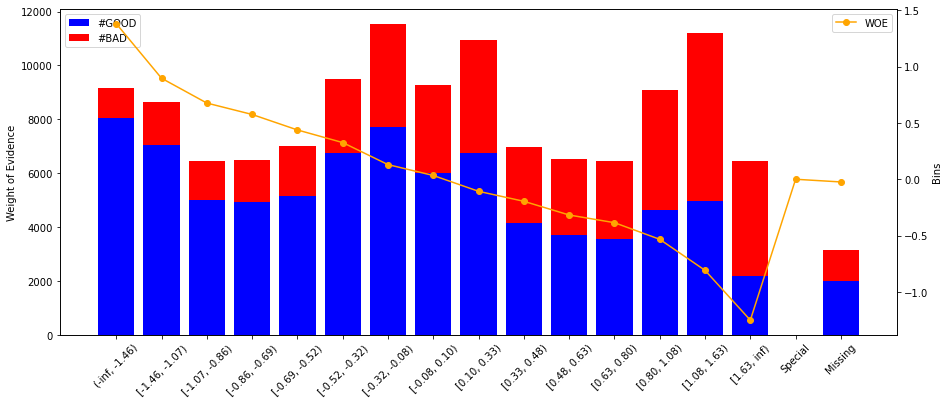

In [111]:
tmp = rev_bin_num(df_train,'NUMERICAL_10')
print(tmp)
plot_by_woe(tmp)

                   bins  No_Obs  #GOOD   #BAD  ...        IV  IV_Rank  \
0  01.Missing_or_<-1.46   12238   9969   2269  ...  0.335869   Strong   
1             02.<-1.02   10172   8247   1925  ...  0.335869   Strong   
2             03.<-0.69   11420   8759   2661  ...  0.335869   Strong   
3             04.<-0.32   16369  11822   4547  ...  0.335869   Strong   
4              05.<0.10   20892  13808   7084  ...  0.335869   Strong   
5              06.<0.48   18084  10997   7087  ...  0.335869   Strong   
6              07.<0.80   13133   7309   5824  ...  0.335869   Strong   
7              08.<1.08    9004   4596   4408  ...  0.335869   Strong   
8             09.>=1.08   17599   7122  10477  ...  0.335869   Strong   

             COLUMN   %_no_obs  
0  NUMERICAL_10_BIN   9.493371  
1  NUMERICAL_10_BIN   7.890715  
2  NUMERICAL_10_BIN   8.858825  
3  NUMERICAL_10_BIN  12.697908  
4  NUMERICAL_10_BIN  16.206530  
5  NUMERICAL_10_BIN  14.028283  
6  NUMERICAL_10_BIN  10.187649  
7  NU

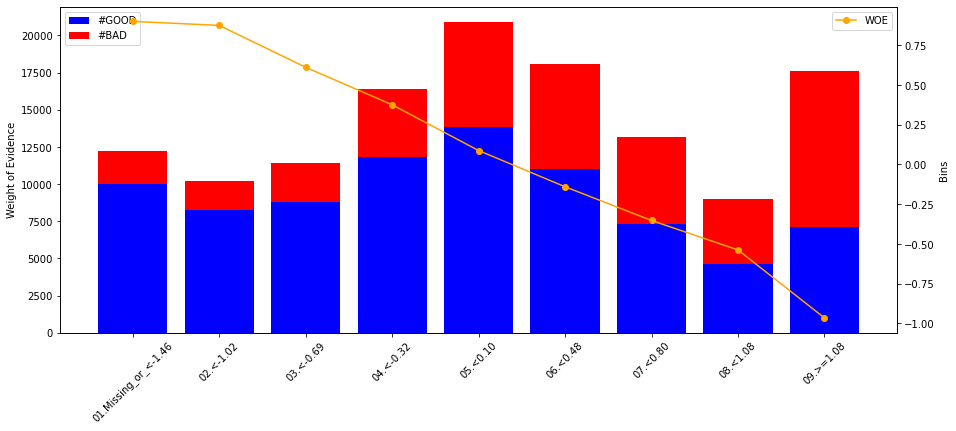

Index(['ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_1', 'NUMERICAL_10',
       'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41', 'CATEGORICAL_1',
       'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7',
       'CATEGORICAL_8', 'CATEGORICAL_9', 'CALC_CATEGORICAL_DAYNAME', 'TARGET',
       'NUMERICAL_10_BIN', 'WOE_NUMERICAL_10_BIN'],
      dtype='object')


In [28]:
def group_bin(x):
    
    if x <-1.46 or pd.isnull(x) == True: return '01.Missing_or_<-1.46'
    elif x <-1.02: return '02.<-1.02'
    elif x <-0.69: return '03.<-0.69'
    elif x <-0.32: return '04.<-0.32'
    elif x <0.10: return '05.<0.10'
    elif x <0.48: return '06.<0.48'
    elif x <0.80: return '07.<0.80'
    elif x <1.08: return '08.<1.08'
    else: return '09.>=1.08'
    
df_train['NUMERICAL_10_BIN'] = df_train['NUMERICAL_10'].apply(lambda x: group_bin(x))
df_test['NUMERICAL_10_BIN'] = df_test['NUMERICAL_10'].apply(lambda x: group_bin(x))

tmp=_bin_table_manual(df_train,'NUMERICAL_10_BIN')
df_train = WOE_mapping(df_train,tmp, 'NUMERICAL_10_BIN')
print(tmp)
plot_by_woe(tmp)

print(df_train.columns)

              bins  Count  Count (%)  #GOOD  #BAD  Event rate       WOE  \
0    (-inf, -1.60)   7048   0.054673   5753  1295    0.183740  0.911603   
1   [-1.60, -1.05)  12012   0.093181   9145  2867    0.238678  0.580334   
2   [-1.05, -0.72)  11450   0.088821   8217  3233    0.282358  0.353187   
3   [-0.72, -0.44)  12234   0.094903   8472  3762    0.307504  0.232208   
4   [-0.44, -0.20)  11530   0.089442   7759  3771    0.327060  0.141906   
5    [-0.20, 0.01)  10854   0.084198   7097  3757    0.346140  0.056444   
6     [0.01, 0.28)  13720   0.106430   8669  5051    0.368149  -0.03944   
7     [0.28, 0.53)  11958   0.092762   7281  4677    0.391119 -0.136996   
8     [0.53, 0.74)   8556   0.066371   5015  3541    0.413862 -0.231583   
9     [0.74, 0.93)   6682   0.051834   3764  2918    0.436696 -0.325024   
10    [0.93, 1.17)   7145   0.055426   3821  3324    0.465220 -0.440264   
11    [1.17, 1.62)   8974   0.069614   4637  4337    0.483285 -0.512723   
12     [1.62, inf)   6748

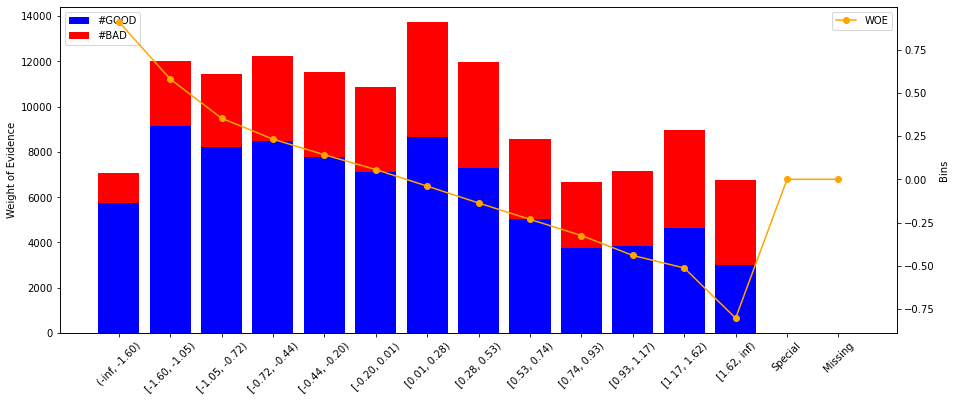

In [16]:
tmp = rev_bin_num(df_train,'NUMERICAL_41')
print(tmp)
plot_by_woe(tmp)

         bins  No_Obs  #GOOD  #BAD  ...        IV  IV_Rank            COLUMN  \
0   01.<-1.60    7071   5769  1302  ...  0.160635   Medium  NUMERICAL_41_BIN   
1   02.<-1.05   11850   9017  2833  ...  0.160635   Medium  NUMERICAL_41_BIN   
2   03.<-0.72   11539   8289  3250  ...  0.160635   Medium  NUMERICAL_41_BIN   
3   04.<-0.44   12097   8370  3727  ...  0.160635   Medium  NUMERICAL_41_BIN   
4   05.<-0.20   11859   7987  3872  ...  0.160635   Medium  NUMERICAL_41_BIN   
5    06.<0.01   10793   7061  3732  ...  0.160635   Medium  NUMERICAL_41_BIN   
6    07.<0.28   13743   8672  5071  ...  0.160635   Medium  NUMERICAL_41_BIN   
7    08.<0.53   11652   7087  4565  ...  0.160635   Medium  NUMERICAL_41_BIN   
8    09.<0.74    8681   5109  3572  ...  0.160635   Medium  NUMERICAL_41_BIN   
9    10.<0.93    6913   3886  3027  ...  0.160635   Medium  NUMERICAL_41_BIN   
10   11.<1.17    7029   3764  3265  ...  0.160635   Medium  NUMERICAL_41_BIN   
11   12.<1.62    8944   4621  4323  ... 

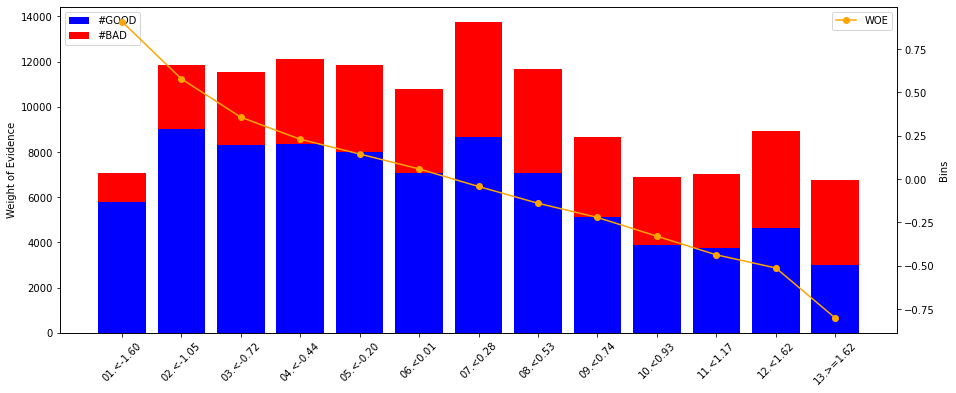

In [29]:
def group_bin(x):
    
    if x <-1.60: return '01.<-1.60'
    elif x <-1.05: return '02.<-1.05'
    elif x <-0.72: return '03.<-0.72'
    elif x <-0.44: return '04.<-0.44'
    elif x <-0.20: return '05.<-0.20'
    elif x <0.01: return '06.<0.01'
    elif x <0.28: return '07.<0.28'
    elif x <0.53: return '08.<0.53'
    elif x <0.74: return '09.<0.74'
    elif x <0.93: return '10.<0.93'
    elif x <1.17: return '11.<1.17'
    elif x <1.62: return '12.<1.62'
    
    else: return '13.>=1.62'
    
df_train['NUMERICAL_41_BIN'] = df_train['NUMERICAL_41'].apply(lambda x: group_bin(x))
df_test['NUMERICAL_41_BIN'] = df_test['NUMERICAL_41'].apply(lambda x: group_bin(x))

tmp=_bin_table_manual(df_train,'NUMERICAL_41_BIN')
df_train = WOE_mapping(df_train,tmp, 'NUMERICAL_41_BIN')
print(tmp)
plot_by_woe(tmp)

              bins  Count  Count (%)  #GOOD   #BAD  Event rate       WOE  \
0    (-inf, -2.67)   8287   0.064285   6600   1687    0.203572   0.78451   
1   [-2.67, -1.73)   9332   0.072391   6980   2352    0.252036  0.508175   
2   [-1.73, -1.12)   8487   0.065836   6195   2292    0.270060   0.41471   
3   [-1.12, -0.37)  12566   0.097478   8825   3741    0.297708  0.278628   
4   [-0.37, -0.02)   6492   0.050360   4423   2069    0.318700  0.180145   
5    [-0.02, 1.18)  20223   0.156876  13468   6755    0.334026  0.110426   
6     [1.18, 2.12)  11985   0.092971   7565   4420    0.368794 -0.042215   
7     [2.12, 2.92)   6479   0.050259   3892   2587    0.399290 -0.171183   
8      [2.92, inf)   6448   0.050019   3532   2916    0.452233 -0.387956   
9          Special      0   0.000000      0      0    0.000000       0.0   
10         Missing  38612   0.299524  21149  17463    0.452269 -0.388099   

          IV IV_Rank  
0   0.129067  Medium  
1   0.129067  Medium  
2   0.129067  Medi

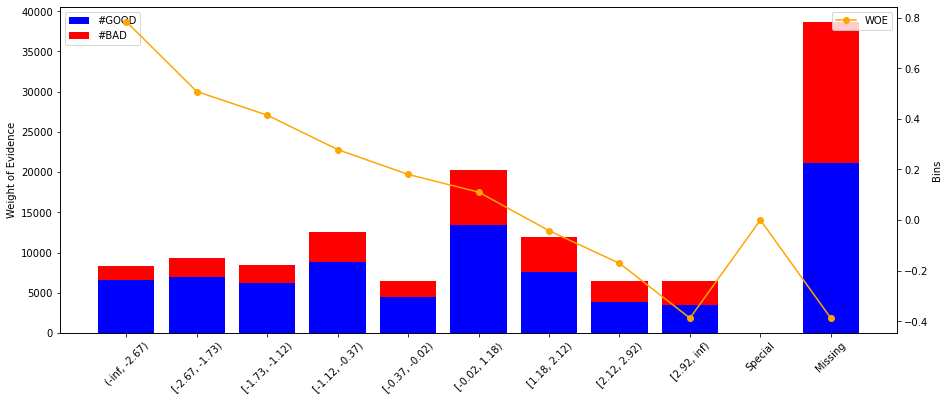

In [19]:
tmp = rev_bin_num(df_train,'NUMERICAL_40')
print(tmp)
plot_by_woe(tmp)

                    bins  No_Obs  #GOOD   #BAD  ...        IV  IV_Rank  \
0              01.<-1.73   17564  13534   4030  ...  0.122739   Medium   
1              02.<-0.67   15892  11405   4487  ...  0.122739   Medium   
2               03.<0.48   20484  13932   6552  ...  0.122739   Medium   
3               04.<2.90   29800  19012  10788  ...  0.122739   Medium   
4  05.>=-2.90_or_Missing   45171  24746  20425  ...  0.122739   Medium   

             COLUMN   %_no_obs  
0  NUMERICAL_40_BIN  13.624904  
1  NUMERICAL_40_BIN  12.327885  
2  NUMERICAL_40_BIN  15.890033  
3  NUMERICAL_40_BIN  23.116724  
4  NUMERICAL_40_BIN  35.040454  

[5 rows x 12 columns]


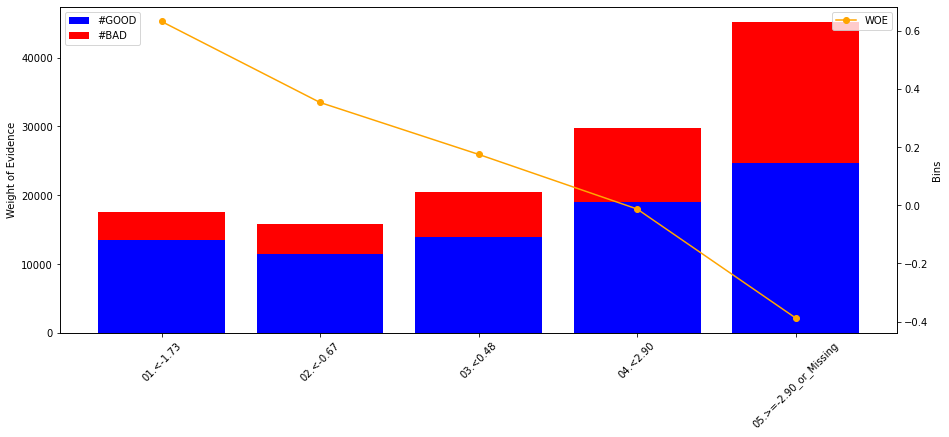

In [30]:
def group_bin(x):
    if x <-1.73: return '01.<-1.73'
    elif x <-0.67: return '02.<-0.67'
    elif x <0.48: return '03.<0.48'
    elif x <2.90: return '04.<2.90'
    else: return '05.>=-2.90_or_Missing'
    
df_train['NUMERICAL_40_BIN'] = df_train['NUMERICAL_40'].apply(lambda x: group_bin(x))
df_test['NUMERICAL_40_BIN'] = df_test['NUMERICAL_40'].apply(lambda x: group_bin(x))

tmp=_bin_table_manual(df_train,'NUMERICAL_40_BIN')
df_train = WOE_mapping(df_train,tmp, 'NUMERICAL_40_BIN')
print(tmp)
plot_by_woe(tmp)

            bins  Count  Count (%)  #GOOD  #BAD  Event rate       WOE  \
0   (-inf, 3.45)   7721   0.059894   3213  4508    0.583862 -0.918256   
1   [3.45, 3.95)  11105   0.086145   6562  4543    0.409095   -0.2119   
2   [3.95, 4.17)   7335   0.056900   4804  2531    0.345058  0.061227   
3   [4.17, 4.39)   8784   0.068140   5942  2842    0.323543   0.15793   
4   [4.39, 4.66)  12391   0.096121   8576  3815    0.307885  0.230419   
5   [4.66, 4.86)   9877   0.076619   7100  2777    0.281158  0.359116   
6   [4.86, 5.10)  12079   0.093700   8590  3489    0.288848  0.321376   
7   [5.10, 5.51)  20002   0.155161  14031  5971    0.298520  0.274747   
8   [5.51, 5.66)   6461   0.050120   4425  2036    0.315121  0.196676   
9   [5.66, 5.87)   8260   0.064075   5585  2675    0.323850  0.156527   
10  [5.87, 6.08)   6800   0.052750   4350  2450    0.360294  -0.00552   
11  [6.08, 6.46)   8714   0.067597   5218  3496    0.401193 -0.179113   
12   [6.46, inf)   9382   0.072779   4233  5149    

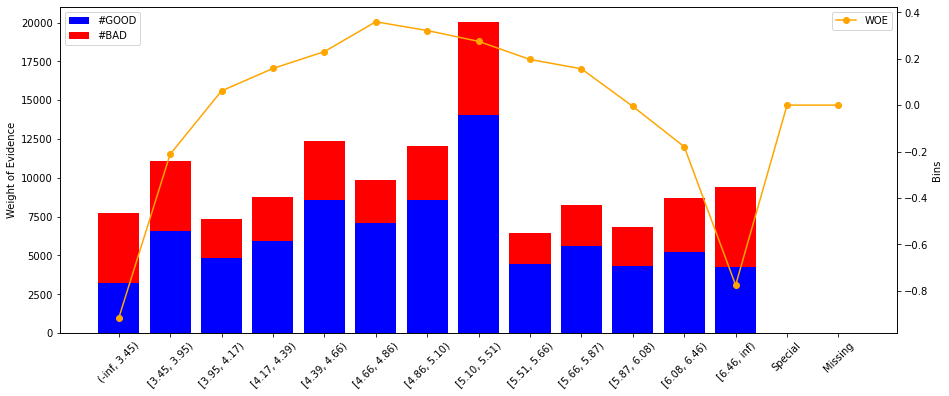

In [21]:
tmp = rev_bin_num(df_train,'NUMERICAL_1')
print(tmp)
plot_by_woe(tmp)

        bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0   02.<3.59   14525   6563   7962  0.824290  0.122014  0.056205 -0.775127   
1   03.<4.25   26789  17025   9764  1.743650  0.149628  0.145801 -0.025914   
2   05.<4.66   25424  17524   7900  2.218228  0.121064  0.150074  0.214814   
3   07.<5.10   31450  22392   9058  2.472069  0.138809  0.191763  0.323160   
4   09.<5.54   30069  21080   8989  2.345088  0.137752  0.180527  0.270428   
5   10.<6.09   28491  18992   9499  1.999368  0.145567  0.162646  0.110936   
6  99.>=5.54   25276  13193  12083  1.091865  0.185166  0.112984 -0.494008   

         IV IV_Rank           COLUMN   %_no_obs  
0  0.123575  Medium  NUMERICAL_1_BIN   7.979717  
1  0.123575  Medium  NUMERICAL_1_BIN  14.717290  
2  0.123575  Medium  NUMERICAL_1_BIN  13.967389  
3  0.123575  Medium  NUMERICAL_1_BIN  17.277941  
4  0.123575  Medium  NUMERICAL_1_BIN  16.519250  
5  0.123575  Medium  NUMERICAL_1_BIN  15.652332  
6  0.123575  Medium  NUME

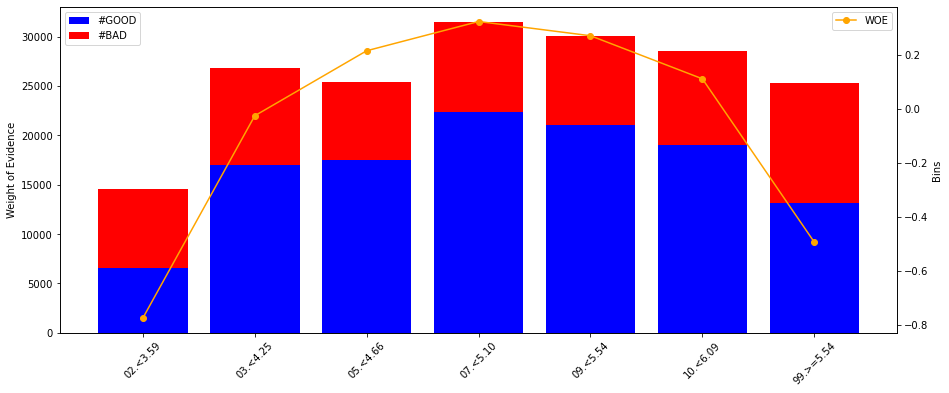

In [50]:
# def group_bin(x):
#     if x <3.59: return '02.<3.59'
#     elif x <4.25: return '03.<4.25'
# #     elif x <4.43: return '04.<4.43'
#     elif x <4.66: return '05.<4.66'
# #     elif x <4.86: return '06.<4.86'
#     elif x <5.10: return '07.<5.10'
# #     elif x <5.27: return '08.<5.27'
#     elif x <5.54: return '09.<5.54'
#     elif x <6.09: return '10.<6.09'
# #     elif x <6.47: return '11.<6.47'
#     else: return '99.>=5.54'  
    
# tmp = df_train.copy()    
# tmp['NUMERICAL_1_BIN'] =  tmp['NUMERICAL_1'].apply(lambda x: group_bin(x))
# tmp=_bin_table_manual(tmp,'NUMERICAL_1_BIN')
# print(tmp)
# plot_by_woe(tmp)    

                bins  No_Obs  #GOOD  #BAD  ...        IV  IV_Rank  \
0  01.<3.95_or_>6.47   17639   7761  9878  ...  0.141015   Medium   
1  02.<3.59_or_>6.09   10476   6173  4303  ...  0.141015   Medium   
2  03.<4.25_or_>5.87   26033  16542  9491  ...  0.141015   Medium   
3  04.<4.43_or_>5.70   13889   9406  4483  ...  0.141015   Medium   
4  05.<4.66_or_>5.54   17390  11982  5408  ...  0.141015   Medium   
5           06.<5.10   22186  15845  6341  ...  0.141015   Medium   
6           07.<5.27    8485   5915  2570  ...  0.141015   Medium   
7           08.<5.54   12813   9005  3808  ...  0.141015   Medium   

            COLUMN   %_no_obs  
0  NUMERICAL_1_BIN  13.683084  
1  NUMERICAL_1_BIN   8.126537  
2  NUMERICAL_1_BIN  20.194553  
3  NUMERICAL_1_BIN  10.774100  
4  NUMERICAL_1_BIN  13.489927  
5  NUMERICAL_1_BIN  17.210323  
6  NUMERICAL_1_BIN   6.582060  
7  NUMERICAL_1_BIN   9.939416  

[8 rows x 12 columns]


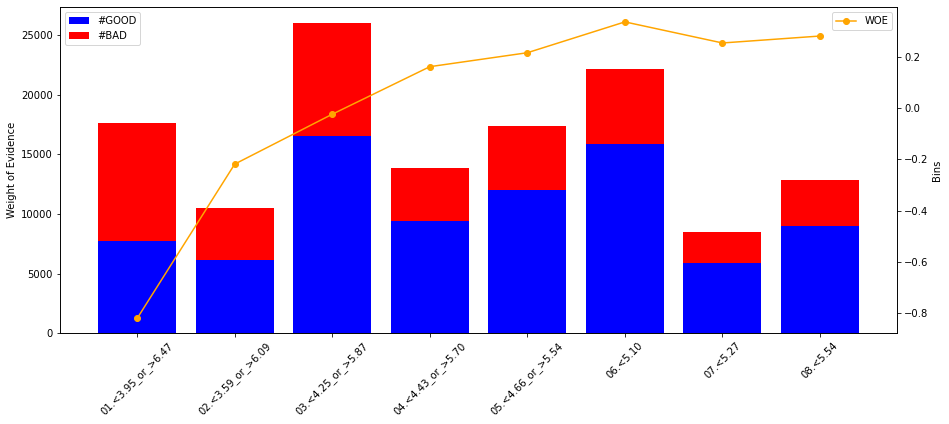

In [31]:
def group_bin(x):
    if x <3.49 or x >6.47: return '01.<3.95_or_>6.47'
    elif x <3.59 or x >6.09: return '02.<3.59_or_>6.09'
    elif x <4.25 or x >5.87: return '03.<4.25_or_>5.87'
    elif x <4.43 or x >5.70: return '04.<4.43_or_>5.70'
    elif x <4.66 or x >5.54: return '05.<4.66_or_>5.54'
#     elif x <4.86: return '06.<4.86'
    elif x <5.10: return '06.<5.10'
    elif x <5.27: return '07.<5.27'
    elif x <5.54: return '08.<5.54'
    else: return '09.Other'
    

df_train['NUMERICAL_1_BIN'] = df_train['NUMERICAL_1'].apply(lambda x: group_bin(x))
df_test['NUMERICAL_1_BIN'] = df_test['NUMERICAL_1'].apply(lambda x: group_bin(x))

tmp=_bin_table_manual(df_train,'NUMERICAL_1_BIN')
df_train = WOE_mapping(df_train,tmp, 'NUMERICAL_1_BIN')
print(tmp)
plot_by_woe(tmp)

              bins  Count  Count (%)  #GOOD  #BAD  Event rate       WOE  \
0    (-inf, -1.41)  10066   0.078085   7604  2462    0.244586  0.548093   
1   [-1.41, -1.13)   6518   0.050562   4711  1807    0.277232  0.378625   
2   [-1.13, -0.75)  12567   0.097486   8783  3784    0.301106  0.262429   
3   [-0.75, -0.47)  11832   0.091784   8091  3741    0.316176  0.191792   
4   [-0.47, -0.32)   7204   0.055884   4819  2385    0.331066   0.12376   
5   [-0.32, -0.14)   8839   0.068567   5765  3074    0.347777  0.049218   
6    [-0.14, 0.18)  16478   0.127825  10650  5828    0.353684  0.023278   
7     [0.18, 0.31)   6532   0.050671   4139  2393    0.366350 -0.031701   
8     [0.31, 0.57)  11902   0.092327   7326  4576    0.384473 -0.109003   
9     [0.57, 0.75)   7391   0.057334   4466  2925    0.395752 -0.156409   
10    [0.75, 0.99)   8392   0.065099   4897  3495    0.416468 -0.242318   
11    [0.99, 1.31)   8725   0.067682   4964  3761    0.431060 -0.302081   
12     [1.31, inf)  12465

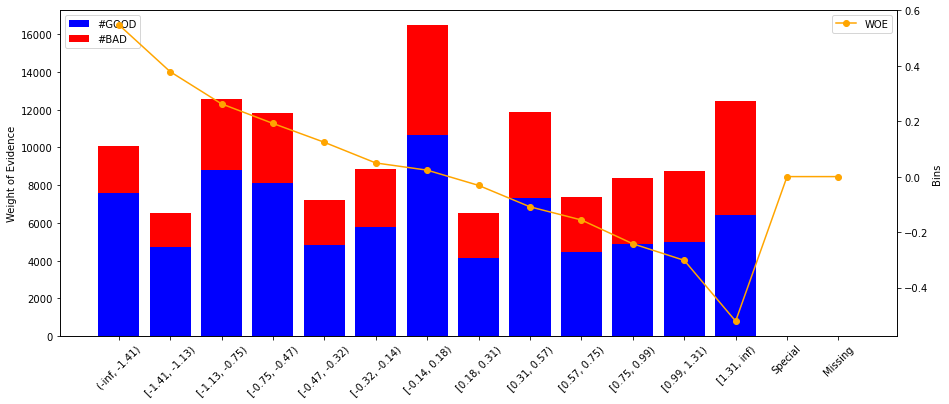

In [23]:
tmp = rev_bin_num(df_train,'NUMERICAL_30')
print(tmp)
plot_by_woe(tmp)

         bins  No_Obs  #GOOD  #BAD  ...        IV  IV_Rank            COLUMN  \
0   01.<-1.41   10122   7638  2484  ...  0.079129     Weak  NUMERICAL_30_BIN   
1   02.<-1.13    6451   4667  1784  ...  0.079129     Weak  NUMERICAL_30_BIN   
2   03.<-0.75   12434   8681  3753  ...  0.079129     Weak  NUMERICAL_30_BIN   
3   04.<-0.47   11931   8168  3763  ...  0.079129     Weak  NUMERICAL_30_BIN   
4   06.<-0.32    7241   4847  2394  ...  0.079129     Weak  NUMERICAL_30_BIN   
5   07.<-0.14    8961   5835  3126  ...  0.079129     Weak  NUMERICAL_30_BIN   
6    08.<0.18   16452  10635  5817  ...  0.079129     Weak  NUMERICAL_30_BIN   
7    09.<0.31    6430   4080  2350  ...  0.079129     Weak  NUMERICAL_30_BIN   
8    10.<0.57   11934   7343  4591  ...  0.079129     Weak  NUMERICAL_30_BIN   
9    11.<0.75    7503   4533  2970  ...  0.079129     Weak  NUMERICAL_30_BIN   
10   12.<0.99    8363   4879  3484  ...  0.079129     Weak  NUMERICAL_30_BIN   
11   13.<1.31    8582   4882  3700  ... 

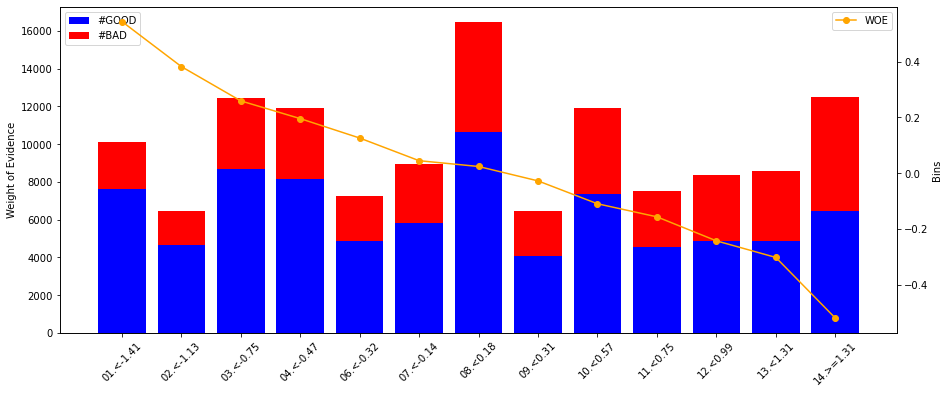

In [32]:
def group_bin(x):
    if x <-1.41: return '01.<-1.41'
    elif x <-1.13: return '02.<-1.13'
    elif x <-0.75: return '03.<-0.75'
    elif x <-0.47: return '04.<-0.47'
    elif x <-0.32: return '06.<-0.32'
    elif x <-0.14: return '07.<-0.14'
    elif x <0.18: return '08.<0.18'
    elif x <0.31: return '09.<0.31'
    elif x <0.57: return '10.<0.57'
    elif x <0.75: return '11.<0.75'
    elif x <0.99: return '12.<0.99'
    elif x <1.31: return '13.<1.31'
    else: return '14.>=1.31'
    
df_train['NUMERICAL_30_BIN'] = df_train['NUMERICAL_30'].apply(lambda x: group_bin(x))
df_test['NUMERICAL_30_BIN'] = df_test['NUMERICAL_30'].apply(lambda x: group_bin(x))

tmp=_bin_table_manual(df_train,'NUMERICAL_30_BIN')
df_train = WOE_mapping(df_train,tmp, 'NUMERICAL_30_BIN')
print(tmp)
plot_by_woe(tmp)

  bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0    A   54780  29978  24802  1.208693  0.535889  0.362802 -0.390068   
1    B   37162  24961  12201  2.045816  0.263623  0.302085  0.136189   
2    C   36969  27690   9279  2.984158  0.200488  0.335112  0.513710   

         IV IV_Rank         COLUMN   %_no_obs  
0  0.141911  Medium  CATEGORICAL_6  42.494434  
1  0.141911  Medium  CATEGORICAL_6  28.827641  
2  0.141911  Medium  CATEGORICAL_6  28.677925  


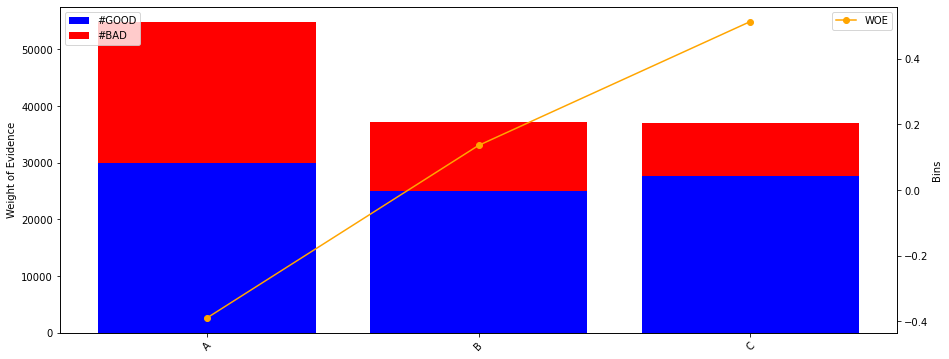

In [121]:
tmp = _bin_table_manual(df_train,'CATEGORICAL_6')
df_train = WOE_mapping(df_train,tmp, 'CATEGORICAL_6')
print(tmp)
plot_by_woe(tmp)

    bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0  DVSOM   42746  32985   9761  3.379264  0.210903  0.399194  0.638050   
1  FCOHQ   43162  25482  17680  1.441290  0.382006  0.308391 -0.214069   
2  OMFDE   43003  24162  18841  1.282416  0.407091  0.292415 -0.330862   

        IV IV_Rank         COLUMN   %_no_obs  
0  0.17384  Medium  CATEGORICAL_1  33.159311  
1  0.17384  Medium  CATEGORICAL_1  33.482015  
2  0.17384  Medium  CATEGORICAL_1  33.358674  


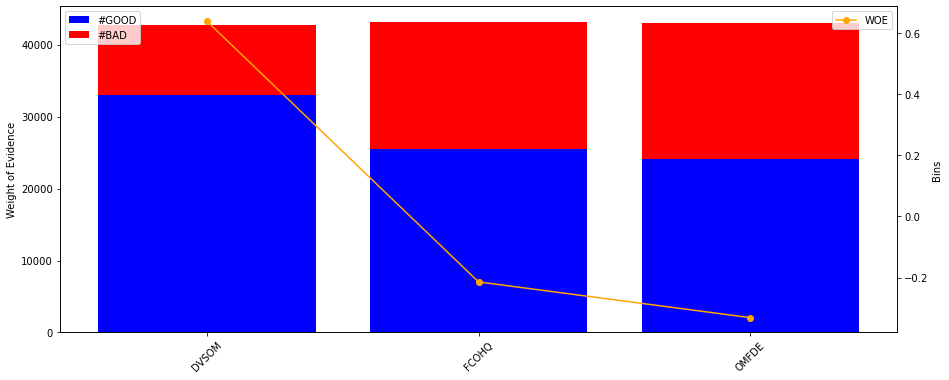

In [122]:
tmp = _bin_table_manual(df_train,'CATEGORICAL_1')
df_train = WOE_mapping(df_train,tmp, 'CATEGORICAL_1')
print(tmp)
plot_by_woe(tmp)

  bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0   AA   64495  37851  26644  1.420620  0.575688  0.458084 -0.228514   
1   BB   64416  44778  19638  2.280171  0.424312  0.541916  0.244643   

         IV IV_Rank         COLUMN   %_no_obs  
0  0.055645    Weak  CATEGORICAL_8  50.030641  
1  0.055645    Weak  CATEGORICAL_8  49.969359  


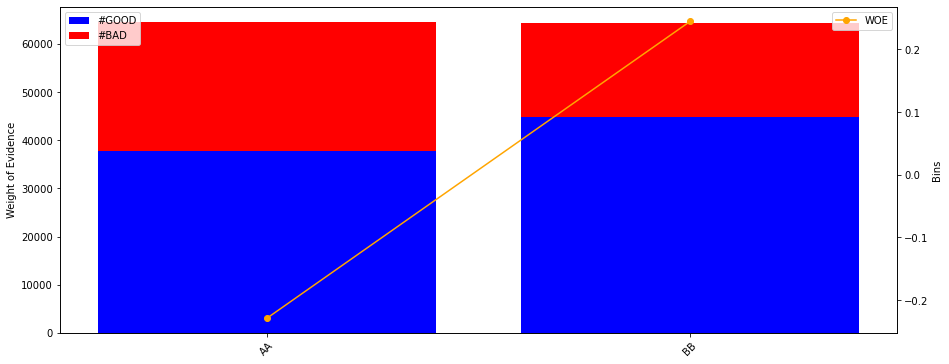

In [123]:
tmp = _bin_table_manual(df_train,'CATEGORICAL_8')
df_train = WOE_mapping(df_train,tmp, 'CATEGORICAL_8')
print(tmp)
plot_by_woe(tmp)

  bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0   AA   38799  28503  10296  2.768357  0.418299  0.537387  0.250523   
1   AB   38855  24537  14318  1.713717  0.581701  0.462613 -0.229066   

         IV IV_Rank         COLUMN   %_no_obs  
0  0.057113    Weak  CATEGORICAL_2  49.963943  
1  0.057113    Weak  CATEGORICAL_2  50.036057  


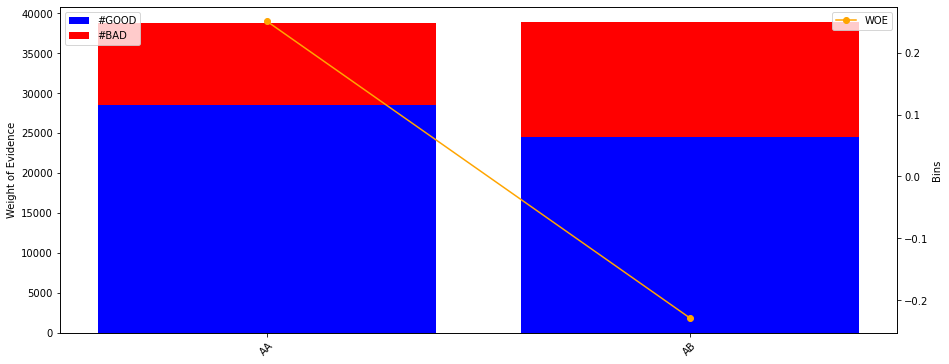

In [124]:
tmp = _bin_table_manual(df_train,'CATEGORICAL_2')
df_train = WOE_mapping(df_train,tmp, 'CATEGORICAL_2')
print(tmp)
plot_by_woe(tmp)

  bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0   TR   38824  28524  10300  2.769320  0.418461  0.537783  0.250871   
1   WE   38830  24516  14314  1.712729  0.581539  0.462217 -0.229643   

         IV IV_Rank         COLUMN   %_no_obs  
0  0.057336    Weak  CATEGORICAL_5  49.996137  
1  0.057336    Weak  CATEGORICAL_5  50.003863  


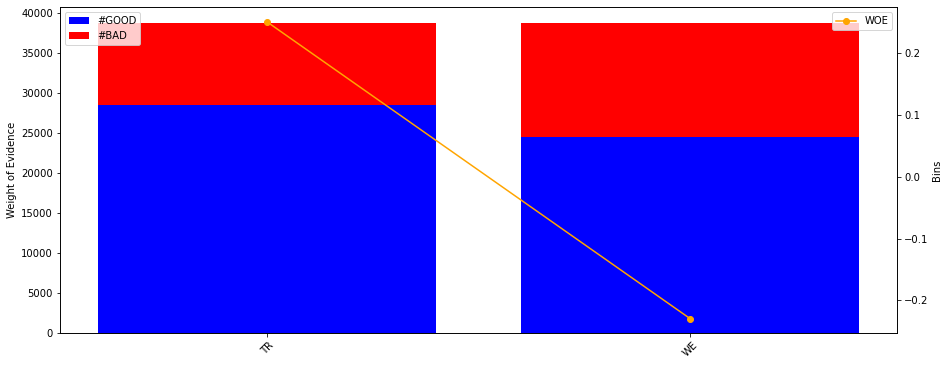

In [125]:
tmp = _bin_table_manual(df_train,'CATEGORICAL_5')
df_train = WOE_mapping(df_train,tmp, 'CATEGORICAL_5')
print(tmp)
plot_by_woe(tmp)

  bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0   AA   64474  30820  33654  0.915790  0.727151  0.372993 -0.667576   
1   BB   64437  51809  12628  4.102708  0.272849  0.627007  0.832040   

         IV     IV_Rank         COLUMN   %_no_obs  
0  0.531101  suspicious  CATEGORICAL_9  50.014351  
1  0.531101  suspicious  CATEGORICAL_9  49.985649  


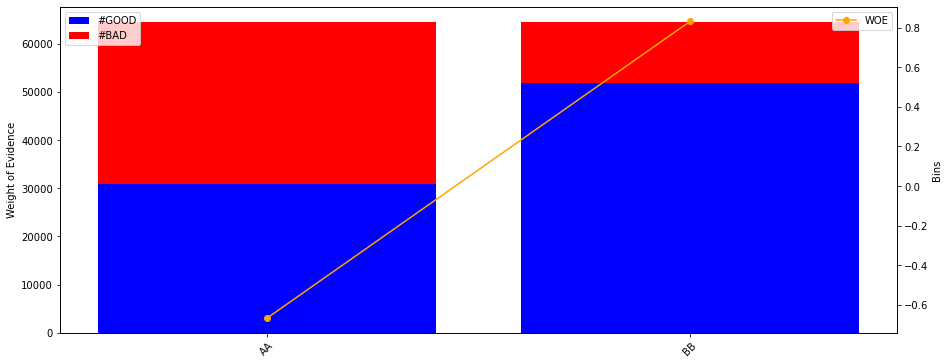

In [126]:
tmp = _bin_table_manual(df_train,'CATEGORICAL_9')
df_train = WOE_mapping(df_train,tmp, 'CATEGORICAL_9')
print(tmp)
plot_by_woe(tmp)

          bins  No_Obs  #GOOD   #BAD  GOOD/BAD      %BAD     %GOOD       WOE  \
0  FRI_SAT_SUN   54858  35144  19714  1.782693  0.425954  0.425323 -0.001483   
1        OTHER   74053  47485  26568  1.787301  0.574046  0.574677  0.001099   

         IV  IV_Rank                    COLUMN   %_no_obs  
0  0.000002  Useless  CALC_CATEGORICAL_DAYNAME  42.554941  
1  0.000002  Useless  CALC_CATEGORICAL_DAYNAME  57.445059  


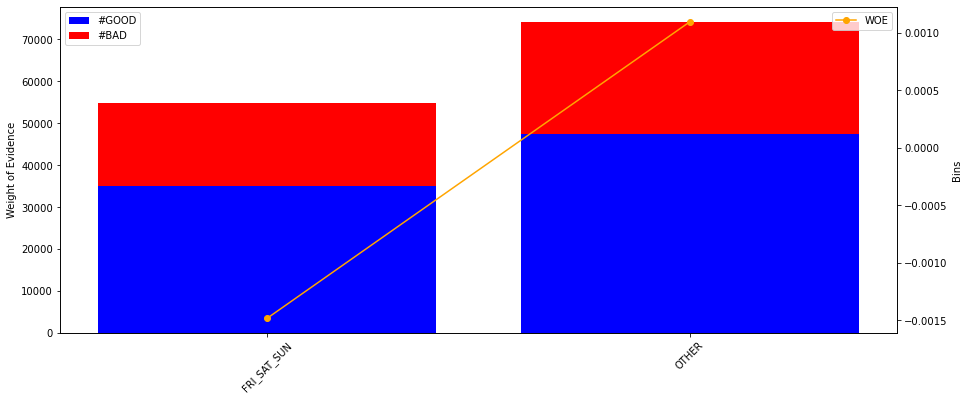

In [127]:
tmp = _bin_table_manual(df_train,'CALC_CATEGORICAL_DAYNAME')
df_train = WOE_mapping(df_train,tmp, 'CALC_CATEGORICAL_DAYNAME')
print(tmp)
plot_by_woe(tmp)

In [134]:
df_train.columns

Index(['ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_1', 'NUMERICAL_10',
       'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41', 'CATEGORICAL_1',
       'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6', 'CATEGORICAL_7',
       'CATEGORICAL_8', 'CATEGORICAL_9', 'CALC_CATEGORICAL_DAYNAME', 'TARGET',
       'NUMERICAL_10_BIN', 'WOE_NUMERICAL_10_BIN', 'NUMERICAL_41_BIN',
       'WOE_NUMERICAL_41_BIN', 'NUMERICAL_40_BIN', 'WOE_NUMERICAL_40_BIN',
       'NUMERICAL_1_BIN', 'WOE_NUMERICAL_1_BIN', 'NUMERICAL_30_BIN',
       'WOE_NUMERICAL_30_BIN', 'WOE_CATEGORICAL_6', 'WOE_CATEGORICAL_1',
       'WOE_CATEGORICAL_8', 'WOE_CATEGORICAL_2', 'WOE_CATEGORICAL_5',
       'WOE_CATEGORICAL_9', 'WOE_CALC_CATEGORICAL_DAYNAME'],
      dtype='object')

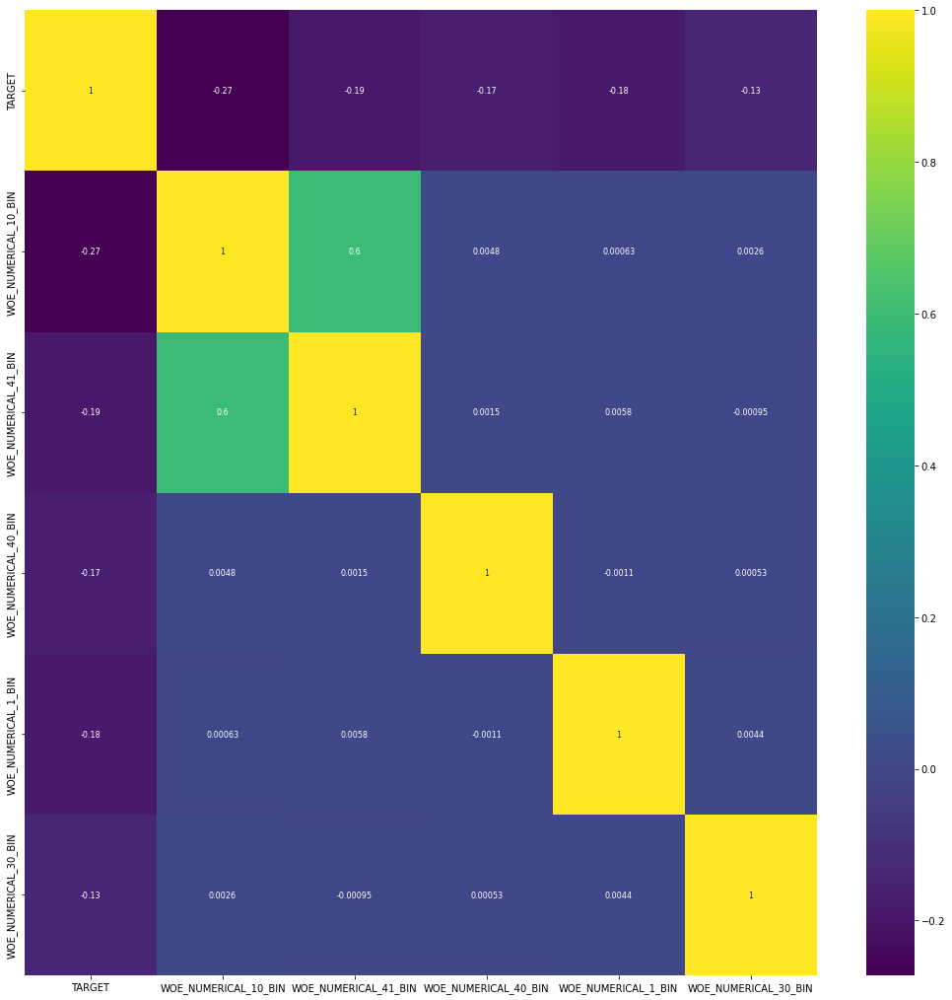

In [33]:
import numpy as np
np.bool = np.bool_

corr_feat = [col for col in df_train.columns if col == 'TARGET' or col.startswith('WOE')]

corr =df_train[corr_feat].corr(method ='pearson')

lst=[]
 
for i in corr_feat:
    if(str(corr[i][i])=='nan'):
        lst.append(i)
for i in corr_feat:
    if i in lst:
        pass
    else:
        upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
        to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]
for i in to_drop:
    lst.append(i)
for i in lst:
    corr_feat.remove(i)

lst_used_var=[col for col in corr_feat if col not in lst]
plt.figure(figsize=(18,18))
cor1 = df_train[lst_used_var].corr()
sns.heatmap(cor1, annot=True, cmap="viridis",annot_kws={"size":8})
plt.show()
 

In [146]:
print(lst)

[]


In [24]:
df_train.columns

Index(['TARGET', 'ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_1',
       'NUMERICAL_30', 'NUMERICAL_40', 'NUMERICAL_41', 'NUMERICAL_10',
       'CATEGORICAL_1', 'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_6',
       'CATEGORICAL_8', 'CATEGORICAL_9', 'NUMERICAL_10_BIN',
       'NUMERICAL_41_BIN', 'NUMERICAL_40_BIN', 'NUMERICAL_1_BIN',
       'NUMERICAL_30_BIN'],
      dtype='object')

In [34]:
used_col = ['TARGET','ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_10_BIN', 'NUMERICAL_41_BIN', 'NUMERICAL_40_BIN', 'NUMERICAL_1_BIN',
            'NUMERICAL_30_BIN', 'CATEGORICAL_6', 'CATEGORICAL_1', 'CATEGORICAL_8', 'CATEGORICAL_2', 'CATEGORICAL_5', 'CATEGORICAL_9',
            'CALC_CATEGORICAL_DAYNAME'
           ]


df_train_LR = df_train[used_col]
df_test_LR = df_test[used_col]

df_train_LR.head()

,TARGET,ID_APPLICATION,TIME,MONTH,...,CATEGORICAL_2,CATEGORICAL_5,CATEGORICAL_9,CALC_CATEGORICAL_DAYNAME
0,1,0,2014-06-20 11:03:04,2014-06,...,AB,TR,AA,FRI_SAT_SUN
1,0,1,2014-06-20 11:05:39,2014-06,...,AA,WE,BB,FRI_SAT_SUN
2,0,2,2014-06-20 11:07:00,2014-06,...,AB,TR,BB,FRI_SAT_SUN
3,0,3,2014-06-20 11:09:38,2014-06,...,AB,TR,BB,FRI_SAT_SUN
4,0,4,2014-06-20 11:11:10,2014-06,...,NaN,NaN,BB,FRI_SAT_SUN


In [148]:
cols_psi = ['NUMERICAL_10_BIN', 'NUMERICAL_41_BIN', 'NUMERICAL_40_BIN', 'NUMERICAL_1_BIN',
            'NUMERICAL_30_BIN', 'CATEGORICAL_6', 'CATEGORICAL_1', 'CATEGORICAL_8', 'CATEGORICAL_2', 'CATEGORICAL_5',
            'CATEGORICAL_9','CALC_CATEGORICAL_DAYNAME'
           ]

for col in cols_psi:
    print(psi_calc(df_train_LR,df_test_LR,col))

       feature_name         feature_value  cnt_app_dev  per_obs_dev  \
0  NUMERICAL_10_BIN  01.Missing_or_<-1.46        12238     0.094934   
1  NUMERICAL_10_BIN             02.<-1.02        10172     0.078907   
2  NUMERICAL_10_BIN             03.<-0.69        11420     0.088588   
3  NUMERICAL_10_BIN             04.<-0.32        16369     0.126979   
4  NUMERICAL_10_BIN              05.<0.10        20892     0.162065   
5  NUMERICAL_10_BIN              06.<0.48        18084     0.140283   
6  NUMERICAL_10_BIN              07.<0.80        13133     0.101876   
7  NUMERICAL_10_BIN              08.<1.08         9004     0.069847   
8  NUMERICAL_10_BIN             09.>=1.08        17599     0.136521   

   cnt_app_val  per_obs_val  psi_value  psi_total psi_comment  
0         1301     0.072374   0.006121   0.007138   No change  
1         1449     0.080607   0.000036   0.007138   No change  
2         1581     0.087951   0.000005   0.007138   No change  
3         2300     0.127948   0.0

In [149]:
import statsmodels.api as sm
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import f_classif
from sklearn.metrics import roc_auc_score
from category_encoders.woe import WOEEncoder
import xgboost as xgb
from xgboost.sklearn import XGBClassifier

target = ['TARGET']

feature = [ 'NUMERICAL_10_BIN', 'NUMERICAL_41_BIN', 'NUMERICAL_40_BIN', 'NUMERICAL_1_BIN',
            'NUMERICAL_30_BIN', 'CATEGORICAL_6', 'CATEGORICAL_1', 'CATEGORICAL_8', 'CATEGORICAL_2', 'CATEGORICAL_5',
            'CATEGORICAL_9','CALC_CATEGORICAL_DAYNAME']


X_train = df_train_LR[feature]    
y_train = df_train_LR[target]  
X_test = df_test_LR[feature]    
y_test = df_test_LR[target] 

encoder = WOEEncoder()
X_train = encoder.fit_transform(X_train,y=y_train)
X_test = encoder.transform(X_test)

def stepwise_forward(X_train, y_train, X_test, y_test):
    selected_features = []
    gini_init_scr = []
    gini_train_scr = []
    gini_test_scr = []
    
    model = LogisticRegression(max_iter=10000)
        
    init_feature = list(X_train.columns)
    
    for feature in init_feature:
        model.fit(X_train[[feature]],y_train)
        y_pred_test = model.predict_proba(X_test[[feature]])[:, 1]
        auc_test = roc_auc_score(y_test, y_pred_test)
        gini_test=(2*auc_test-1)*100
        gini_init_scr.append(gini_test)        
        selected_features.append(feature)
        
    sorted_selected_features = sorted(list((k, v) for k, v in zip(selected_features, gini_init_scr)), key=lambda x: x[1], reverse=True)
    sorted_selected_features = [x[0] for x in sorted_selected_features]  
        
    selected_features = list(k for k, v in zip(selected_features, gini_init_scr) if v == max(gini_init_scr))
    remaining_features = list([x for x in X_train[sorted_selected_features].columns if x not in selected_features]) ### sort feature descending by its' own AUC score and exclude best feature that is already in selected_features 

    
    X_train_init = X_train[selected_features]
    X_test_init = X_test[selected_features]
    model.fit(X_train_init, y_train)

    y_pred_train = model.predict_proba(X_train_init)[:, 1]
    auc_train = roc_auc_score(y_train, y_pred_train)
    gini_train=(2*auc_train-1)*100
    gini_train_scr.append(gini_train)
    
    y_pred_test = model.predict_proba(X_test_init)[:, 1]
    auc_test = roc_auc_score(y_test, y_pred_test)
    gini_test=(2*auc_test-1)*100
    gini_test_scr.append(gini_test)
    
    for feature in remaining_features:
        model_features = selected_features + [feature]
        model.fit(X_train[model_features], y_train)
        
        y_pred_train = model.predict_proba(X_train[model_features])[:, 1]
        auc_train = roc_auc_score(y_train, y_pred_train)
        gini_train=(2*auc_train-1)*100
        
        y_pred_test = model.predict_proba(X_test[model_features])[:, 1]
        auc_test = roc_auc_score(y_test, y_pred_test)
        gini_test=(2*auc_test-1)*100
        
        if float(gini_test) > float(max(gini_test_scr)):
            gini_train_scr.append(gini_train)
            gini_test_scr.append(gini_test)
            selected_features.append(feature)    
            
    return selected_features, gini_train_scr, gini_test_scr

stepwise_forward(X_train, y_train, X_test, y_test)


(['NUMERICAL_10_BIN',
  'CATEGORICAL_6',
  'CATEGORICAL_1',
  'NUMERICAL_40_BIN',
  'NUMERICAL_1_BIN',
  'NUMERICAL_30_BIN',
  'CATEGORICAL_5',
  'CATEGORICAL_2',
  'CATEGORICAL_8',
  'CALC_CATEGORICAL_DAYNAME'],
 [32.12707186037649,
  38.83156516837183,
  45.482911250867055,
  49.57785435768749,
  54.24553323610824,
  56.64395469645176,
  59.136514556871504,
  59.70321419373676,
  61.42073933295431,
  61.42073797320538],
 [33.482332709602034,
  39.931736018506946,
  46.08617996707953,
  50.72847632123177,
  55.14417286874234,
  57.61270501993236,
  59.81484372493362,
  60.24079187642744,
  61.959723439760104,
  61.95973950231433])

In [35]:
feature = ['NUMERICAL_10_BIN',
  'CATEGORICAL_6',
  'CATEGORICAL_1',
  'NUMERICAL_40_BIN',
  'NUMERICAL_1_BIN',
  'NUMERICAL_30_BIN',
  'CATEGORICAL_5',
  'CATEGORICAL_2',
  'CATEGORICAL_8',
  'CALC_CATEGORICAL_DAYNAME']

df_train_dev = pd.get_dummies(df_train_LR, columns = feature, dtype=np.int64)
df_test_dev = pd.get_dummies(df_test_LR, columns = feature, dtype=np.int64)
print(df_train_dev.columns)
print(df_test_dev.columns)

Index(['TARGET', 'ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_41_BIN',
       'CATEGORICAL_9', 'NUMERICAL_10_BIN_01.Missing_or_<-1.46',
       'NUMERICAL_10_BIN_02.<-1.02', 'NUMERICAL_10_BIN_03.<-0.69',
       'NUMERICAL_10_BIN_04.<-0.32', 'NUMERICAL_10_BIN_05.<0.10',
       'NUMERICAL_10_BIN_06.<0.48', 'NUMERICAL_10_BIN_07.<0.80',
       'NUMERICAL_10_BIN_08.<1.08', 'NUMERICAL_10_BIN_09.>=1.08',
       'CATEGORICAL_6_A', 'CATEGORICAL_6_B', 'CATEGORICAL_6_C',
       'CATEGORICAL_1_DVSOM', 'CATEGORICAL_1_FCOHQ', 'CATEGORICAL_1_OMFDE',
       'NUMERICAL_40_BIN_01.<-1.73', 'NUMERICAL_40_BIN_02.<-0.67',
       'NUMERICAL_40_BIN_03.<0.48', 'NUMERICAL_40_BIN_04.<2.90',
       'NUMERICAL_40_BIN_05.>=-2.90_or_Missing',
       'NUMERICAL_1_BIN_01.<3.95_or_>6.47',
       'NUMERICAL_1_BIN_02.<3.59_or_>6.09',
       'NUMERICAL_1_BIN_03.<4.25_or_>5.87',
       'NUMERICAL_1_BIN_04.<4.43_or_>5.70',
       'NUMERICAL_1_BIN_05.<4.66_or_>5.54', 'NUMERICAL_1_BIN_06.<5.10',
       'NUMERICAL_1_BIN_07.<5.

In [36]:
df_train_dev['BAD'] = 1-df_train_dev['TARGET']
df_test_dev['BAD'] = 1-df_test_dev['TARGET']

AUC train: 80.90
AUC test: 81.19
GINI train: 61.80
GINI test: 62.38


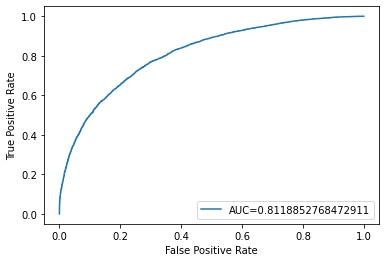

              precision    recall  f1-score   support

           0       0.69      0.58      0.63      6523
           1       0.78      0.85      0.81     11453

    accuracy                           0.75     17976
   macro avg       0.74      0.72      0.72     17976
weighted avg       0.75      0.75      0.75     17976



In [37]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTENC
from imblearn.over_sampling import SMOTE
from category_encoders.woe import WOEEncoder
from sklearn.preprocessing import LabelEncoder
from category_encoders.target_encoder import TargetEncoder
from target_encoding import TargetEncoderClassifier
# from target_encoding import TargetEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from scipy.stats import randint
from scipy import stats
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn import neighbors
from sklearn.metrics import classification_report
from matplotlib import pyplot

target = ['BAD']

feature =['NUMERICAL_10_BIN_01.Missing_or_<-1.46',
       'NUMERICAL_10_BIN_02.<-1.02', 'NUMERICAL_10_BIN_03.<-0.69',
       'NUMERICAL_10_BIN_04.<-0.32', 'NUMERICAL_10_BIN_05.<0.10',
       'NUMERICAL_10_BIN_06.<0.48', 'NUMERICAL_10_BIN_07.<0.80',
       'NUMERICAL_10_BIN_08.<1.08', 'NUMERICAL_10_BIN_09.>=1.08',
       'CATEGORICAL_6_A', 'CATEGORICAL_6_B', 'CATEGORICAL_6_C',
       'CATEGORICAL_1_DVSOM', 'CATEGORICAL_1_FCOHQ', 'CATEGORICAL_1_OMFDE',
       'NUMERICAL_40_BIN_01.<-1.73', 'NUMERICAL_40_BIN_02.<-0.67',
       'NUMERICAL_40_BIN_03.<0.48', 'NUMERICAL_40_BIN_04.<2.90',
       'NUMERICAL_40_BIN_05.>=-2.90_or_Missing',
       'NUMERICAL_1_BIN_01.<3.95_or_>6.47',
       'NUMERICAL_1_BIN_02.<3.59_or_>6.09',
       'NUMERICAL_1_BIN_03.<4.25_or_>5.87',
       'NUMERICAL_1_BIN_04.<4.43_or_>5.70',
       'NUMERICAL_1_BIN_05.<4.66_or_>5.54', 'NUMERICAL_1_BIN_06.<5.10',
       'NUMERICAL_1_BIN_07.<5.27', 'NUMERICAL_1_BIN_08.<5.54',
       'NUMERICAL_30_BIN_01.<-1.41', 'NUMERICAL_30_BIN_02.<-1.13',
       'NUMERICAL_30_BIN_03.<-0.75', 'NUMERICAL_30_BIN_04.<-0.47',
       'NUMERICAL_30_BIN_06.<-0.32', 'NUMERICAL_30_BIN_07.<-0.14',
       'NUMERICAL_30_BIN_08.<0.18', 'NUMERICAL_30_BIN_09.<0.31',
       'NUMERICAL_30_BIN_10.<0.57', 'NUMERICAL_30_BIN_11.<0.75',
       'NUMERICAL_30_BIN_12.<0.99', 'NUMERICAL_30_BIN_13.<1.31',
       'NUMERICAL_30_BIN_14.>=1.31', 'CATEGORICAL_5_TR', 'CATEGORICAL_5_WE',
       'CATEGORICAL_2_AA', 'CATEGORICAL_2_AB', 'CATEGORICAL_8_AA',
       'CATEGORICAL_8_BB', 'CALC_CATEGORICAL_DAYNAME_FRI_SAT_SUN',
       'CALC_CATEGORICAL_DAYNAME_OTHER'
         ]

X_train = df_train_dev[feature]    
y_train = df_train_dev[target]  
X_test = df_test_dev[feature]    
y_test = df_test_dev[target] 

model = LogisticRegression(max_iter=1000)

model.fit(X_train,y_train)

y_pred_train = model.predict_proba(X_train)[:, 1]
roc_auc_train = roc_auc_score(y_train, y_pred_train)
gini_train=2*roc_auc_train-1
    
y_pred_test = model.predict_proba(X_test)[:, 1]
roc_auc_test = roc_auc_score(y_test, y_pred_test)
gini_test=2*roc_auc_test-1

print('AUC train: %.2f'%(roc_auc_train*100))
print('AUC test: %.2f'%(roc_auc_test*100))

print('GINI train: %.2f'%(gini_train*100))
print('GINI test: %.2f'%(gini_test*100))
 
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_test)  
roc_auc_dtest_predprob =  metrics.roc_auc_score(y_test, y_pred_test)
plt.plot(fpr,tpr,label="AUC="+str(roc_auc_dtest_predprob))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()
     
ypred_test = model.predict(X_test)
print(classification_report(y_test,ypred_test))

In [38]:
# feature_name = X_train.columns.values
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature)
summary_table['Coefficients'] = np.transpose(model.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', model.intercept_[0]]
summary_table.sort_index(inplace = True)
summary_table

,Feature name,Coefficients
0,Intercept,0.241591
1,NUMERICAL_10_BIN_01.Missing_or_<-1.46,1.045545
2,NUMERICAL_10_BIN_02.<-1.02,1.025561
3,NUMERICAL_10_BIN_03.<-0.69,0.664066
4,NUMERICAL_10_BIN_04.<-0.32,0.395156
5,NUMERICAL_10_BIN_05.<0.10,0.038911
6,NUMERICAL_10_BIN_06.<0.48,-0.266367
7,NUMERICAL_10_BIN_07.<0.80,-0.545077
8,NUMERICAL_10_BIN_08.<1.08,-0.790986
9,NUMERICAL_10_BIN_09.>=1.08,-1.326287


In [39]:
def original_feat(x):
    if x.startswith('NUMERICAL_10'): return 'NUMERICAL_10'
    elif x.startswith('CATEGORICAL_6'): return 'CATEGORICAL_6'
    elif x.startswith('CATEGORICAL_1'): return 'CATEGORICAL_1'
    elif x.startswith('NUMERICAL_40'): return 'NUMERICAL_40'
    elif x.startswith('NUMERICAL_1'): return 'NUMERICAL_1'
    elif x.startswith('NUMERICAL_30'): return 'NUMERICAL_30'
    elif x.startswith('CATEGORICAL_5'): return 'CATEGORICAL_5'
    elif x.startswith('CATEGORICAL_2'): return 'CATEGORICAL_2'
    elif x.startswith('CATEGORICAL_8'): return 'CATEGORICAL_8'
    elif x.startswith('CALC_CATEGORICAL_DAYNAME'): return 'CALC_CATEGORICAL_DAYNAME'
    else : return 'Intercept'
    
summary_table['Original feature name'] = summary_table['Feature name'].apply(lambda x: original_feat(x))
summary_table

,Feature name,Coefficients,Original feature name
0,Intercept,0.241591,Intercept
1,NUMERICAL_10_BIN_01.Missing_or_<-1.46,1.045545,NUMERICAL_10
2,NUMERICAL_10_BIN_02.<-1.02,1.025561,NUMERICAL_10
3,NUMERICAL_10_BIN_03.<-0.69,0.664066,NUMERICAL_10
4,NUMERICAL_10_BIN_04.<-0.32,0.395156,NUMERICAL_10
5,NUMERICAL_10_BIN_05.<0.10,0.038911,NUMERICAL_10
6,NUMERICAL_10_BIN_06.<0.48,-0.266367,NUMERICAL_10
7,NUMERICAL_10_BIN_07.<0.80,-0.545077,NUMERICAL_10
8,NUMERICAL_10_BIN_08.<1.08,-0.790986,NUMERICAL_10
9,NUMERICAL_10_BIN_09.>=1.08,-1.326287,NUMERICAL_10


In [40]:
# Define the min and max threshholds for our scorecard
min_score = 300
max_score = 900
# calculate the sum of the minimum coefficients of each category within the original feature name
min_sum_coef = summary_table.groupby('Original feature name')['Coefficients'].min().sum()
# calculate the sum of the maximum coefficients of each category within the original feature name
max_sum_coef = summary_table.groupby('Original feature name')['Coefficients'].max().sum()
# create a new columns that has the imputed calculated Score based on the multiplication of the coefficient by the ratio of the differences between
# maximum & minimum score and maximum & minimum sum of cefficients.
summary_table['Score - Calculation'] = summary_table['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)
# update the calculated score of the Intercept (i.e. the default score for each loan)
summary_table.loc[0, 'Score - Calculation'] = ((summary_table.loc[0,'Coefficients'] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score
# round the values of the 'Score - Calculation' column and store them in a new column
summary_table['Score - Preliminary'] = summary_table['Score - Calculation'].round()
summary_table

,Feature name,Coefficients,Original feature name,Score - Calculation,Score - Preliminary
0,Intercept,0.241591,Intercept,561.722195,562.0
1,NUMERICAL_10_BIN_01.Missing_or_<-1.46,1.045545,NUMERICAL_10,56.533113,57.0
2,NUMERICAL_10_BIN_02.<-1.02,1.025561,NUMERICAL_10,55.452609,55.0
3,NUMERICAL_10_BIN_03.<-0.69,0.664066,NUMERICAL_10,35.906386,36.0
4,NUMERICAL_10_BIN_04.<-0.32,0.395156,NUMERICAL_10,21.366278,21.0
5,NUMERICAL_10_BIN_05.<0.10,0.038911,NUMERICAL_10,2.103963,2.0
6,NUMERICAL_10_BIN_06.<0.48,-0.266367,NUMERICAL_10,-14.402581,-14.0
7,NUMERICAL_10_BIN_07.<0.80,-0.545077,NUMERICAL_10,-29.472602,-29.0
8,NUMERICAL_10_BIN_08.<1.08,-0.790986,NUMERICAL_10,-42.769026,-43.0
9,NUMERICAL_10_BIN_09.>=1.08,-1.326287,NUMERICAL_10,-71.712995,-72.0


In [41]:
# check the min and max possible scores of our scorecard
min_sum_score_prel = summary_table.groupby('Original feature name')['Score - Preliminary'].min().sum()
max_sum_score_prel = summary_table.groupby('Original feature name')['Score - Preliminary'].max().sum()
print(min_sum_score_prel)
print(max_sum_score_prel)

301.0
900.0


In [42]:
summary_table['Difference'] = summary_table['Score - Preliminary'] - summary_table['Score - Calculation']
summary_table

,Feature name,Coefficients,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,Intercept,0.241591,Intercept,561.722195,562.0,0.277805
1,NUMERICAL_10_BIN_01.Missing_or_<-1.46,1.045545,NUMERICAL_10,56.533113,57.0,0.466887
2,NUMERICAL_10_BIN_02.<-1.02,1.025561,NUMERICAL_10,55.452609,55.0,-0.452609
3,NUMERICAL_10_BIN_03.<-0.69,0.664066,NUMERICAL_10,35.906386,36.0,0.093614
4,NUMERICAL_10_BIN_04.<-0.32,0.395156,NUMERICAL_10,21.366278,21.0,-0.366278
5,NUMERICAL_10_BIN_05.<0.10,0.038911,NUMERICAL_10,2.103963,2.0,-0.103963
6,NUMERICAL_10_BIN_06.<0.48,-0.266367,NUMERICAL_10,-14.402581,-14.0,0.402581
7,NUMERICAL_10_BIN_07.<0.80,-0.545077,NUMERICAL_10,-29.472602,-29.0,0.472602
8,NUMERICAL_10_BIN_08.<1.08,-0.790986,NUMERICAL_10,-42.769026,-43.0,-0.230974
9,NUMERICAL_10_BIN_09.>=1.08,-1.326287,NUMERICAL_10,-71.712995,-72.0,-0.287005


In [43]:
summary_table['Score - Final'] = summary_table['Score - Preliminary']
summary_table.loc[0, 'Score - Final'] = 562
summary_table

,Feature name,Coefficients,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,Intercept,0.241591,Intercept,561.722195,562.0,0.277805,562.0
1,NUMERICAL_10_BIN_01.Missing_or_<-1.46,1.045545,NUMERICAL_10,56.533113,57.0,0.466887,57.0
2,NUMERICAL_10_BIN_02.<-1.02,1.025561,NUMERICAL_10,55.452609,55.0,-0.452609,55.0
3,NUMERICAL_10_BIN_03.<-0.69,0.664066,NUMERICAL_10,35.906386,36.0,0.093614,36.0
4,NUMERICAL_10_BIN_04.<-0.32,0.395156,NUMERICAL_10,21.366278,21.0,-0.366278,21.0
5,NUMERICAL_10_BIN_05.<0.10,0.038911,NUMERICAL_10,2.103963,2.0,-0.103963,2.0
6,NUMERICAL_10_BIN_06.<0.48,-0.266367,NUMERICAL_10,-14.402581,-14.0,0.402581,-14.0
7,NUMERICAL_10_BIN_07.<0.80,-0.545077,NUMERICAL_10,-29.472602,-29.0,0.472602,-29.0
8,NUMERICAL_10_BIN_08.<1.08,-0.790986,NUMERICAL_10,-42.769026,-43.0,-0.230974,-43.0
9,NUMERICAL_10_BIN_09.>=1.08,-1.326287,NUMERICAL_10,-71.712995,-72.0,-0.287005,-72.0


In [44]:
# check the min and max possible scores of our scorecard
min_sum_score_prel = summary_table.groupby('Original feature name')['Score - Final'].min().sum()
max_sum_score_prel = summary_table.groupby('Original feature name')['Score - Final'].max().sum()
print(min_sum_score_prel)
print(max_sum_score_prel)

301.0
900.0


In [45]:
ref_score=summary_table[['Feature name','Score - Final']]
ref_score

,Feature name,Score - Final
0,Intercept,562.0
1,NUMERICAL_10_BIN_01.Missing_or_<-1.46,57.0
2,NUMERICAL_10_BIN_02.<-1.02,55.0
3,NUMERICAL_10_BIN_03.<-0.69,36.0
4,NUMERICAL_10_BIN_04.<-0.32,21.0
5,NUMERICAL_10_BIN_05.<0.10,2.0
6,NUMERICAL_10_BIN_06.<0.48,-14.0
7,NUMERICAL_10_BIN_07.<0.80,-29.0
8,NUMERICAL_10_BIN_08.<1.08,-43.0
9,NUMERICAL_10_BIN_09.>=1.08,-72.0


In [162]:
df_train_dev.columns

Index(['TARGET', 'ID_APPLICATION', 'TIME', 'MONTH', 'NUMERICAL_41_BIN',
       'CATEGORICAL_9', 'NUMERICAL_10_BIN_01.Missing_or_<-1.46',
       'NUMERICAL_10_BIN_02.<-1.02', 'NUMERICAL_10_BIN_03.<-0.69',
       'NUMERICAL_10_BIN_04.<-0.32', 'NUMERICAL_10_BIN_05.<0.10',
       'NUMERICAL_10_BIN_06.<0.48', 'NUMERICAL_10_BIN_07.<0.80',
       'NUMERICAL_10_BIN_08.<1.08', 'NUMERICAL_10_BIN_09.>=1.08',
       'CATEGORICAL_6_A', 'CATEGORICAL_6_B', 'CATEGORICAL_6_C',
       'CATEGORICAL_1_DVSOM', 'CATEGORICAL_1_FCOHQ', 'CATEGORICAL_1_OMFDE',
       'NUMERICAL_40_BIN_01.<-1.73', 'NUMERICAL_40_BIN_02.<-0.67',
       'NUMERICAL_40_BIN_03.<0.48', 'NUMERICAL_40_BIN_04.<2.90',
       'NUMERICAL_40_BIN_05.>=-2.90_or_Missing',
       'NUMERICAL_1_BIN_01.<3.95_or_>6.47',
       'NUMERICAL_1_BIN_02.<3.59_or_>6.09',
       'NUMERICAL_1_BIN_03.<4.25_or_>5.87',
       'NUMERICAL_1_BIN_04.<4.43_or_>5.70',
       'NUMERICAL_1_BIN_05.<4.66_or_>5.54', 'NUMERICAL_1_BIN_06.<5.10',
       'NUMERICAL_1_BIN_07.<5.

In [46]:
df_test_dev= df_test_dev.reset_index()
# .drop(columns=['index'])

# df_test_dev.drop(columns=['level_0','BAD'],axis=1, inplace=True)
df_test_dev

,index,TARGET,ID_APPLICATION,TIME,...,CATEGORICAL_8_BB,CALC_CATEGORICAL_DAYNAME_FRI_SAT_SUN,CALC_CATEGORICAL_DAYNAME_OTHER,BAD
0,182024,0,182024,2015-05-01 00:02:55,...,1,1,0,1
1,182025,1,182025,2015-05-01 00:07:19,...,1,1,0,0
2,182026,1,182026,2015-05-01 00:10:46,...,1,1,0,0
3,182027,0,182027,2015-05-01 00:12:55,...,1,1,0,1
4,182028,1,182028,2015-05-01 00:13:54,...,1,1,0,0
...,...,...,...,...,...,...,...,...,...
17971,199995,1,199995,2015-05-31 23:08:41,...,0,1,0,0
17972,199996,0,199996,2015-05-31 23:11:20,...,1,1,0,1
17973,199997,0,199997,2015-05-31 23:15:45,...,1,1,0,1
17974,199998,1,199998,2015-05-31 23:20:13,...,1,1,0,0


In [47]:
df_test_dev.drop(columns=['BAD'],axis=1, inplace=True)

In [48]:
calc_score_feats = (list(summary_table['Original feature name'].drop_duplicates()))
not_calc_score_feats = [col for col in df_train.columns if col not in calc_score_feats]

df_test_dev.insert(0, 'Intercept', 1) #### thêm vào để cộng thêm base_score

def find_score(x,y):
    
    s = 0
    for i in range(0,len(ref_score)):
        if x in not_calc_score_feats:
            pass
        elif (x==ref_score['Feature name'][i]) &(y==1):
            s = ref_score['Score - Final'][i]
    return s

def find_total(t):
    sc=0
    s = t.columns
    t['score'] = t.apply(lambda x: find_score(x['index'],x[s[1]]),axis = 1)
    sc = sum(t['score'])
    return sc

df_test_dev['score'] = 0
for i in range(0,len(df_test_dev)):
    df_test_dev['score'][i] = find_total(df_test_dev.iloc[i].reset_index())
    
df_test_dev

,Intercept,index,TARGET,ID_APPLICATION,...,CATEGORICAL_8_BB,CALC_CATEGORICAL_DAYNAME_FRI_SAT_SUN,CALC_CATEGORICAL_DAYNAME_OTHER,score
0,1,182024,0,182024,...,1,1,0,644
1,1,182025,1,182025,...,1,1,0,543
2,1,182026,1,182026,...,1,1,0,572
3,1,182027,0,182027,...,1,1,0,716
4,1,182028,1,182028,...,1,1,0,619
...,...,...,...,...,...,...,...,...,...
17971,1,199995,1,199995,...,0,1,0,424
17972,1,199996,0,199996,...,1,1,0,652
17973,1,199997,0,199997,...,1,1,0,624
17974,1,199998,1,199998,...,1,1,0,503


Text(0.5, 1.0, 'Distribution Score in Default vs Non-Default')

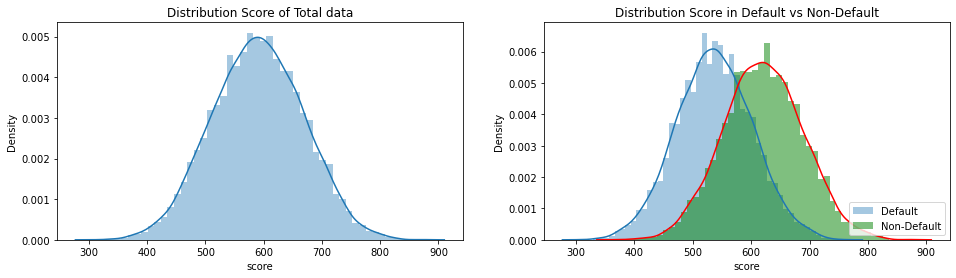

In [49]:
plt.figure(figsize=(16, 4))
plt.subplot(121)
sns.distplot(df_test_dev['score'])
plt.title('Distribution Score of Total data')
plt.subplot(122)
sns.distplot(df_test_dev[df_test_dev['TARGET']==1]['score'], label='Default')
sns.distplot(df_test_dev[df_test_dev['TARGET']==0]['score'], label='Non-Default',
              kde_kws={"color": "r"},
               hist_kws={"color": "g", "alpha":0.5})
plt.legend(loc = 'lower right')
plt.title('Distribution Score in Default vs Non-Default')

In [52]:
df_ab_lr = df_test_dev[['ID_APPLICATION','MONTH','score','TARGET']]
df_ab_lr['GOOD'] = np.where((df_ab_lr['TARGET']==0) &(df_ab_lr['score']>= 560),1,0)

df_ab_lr['ALG'] = 'LR'
df_ab_lr.drop(columns='score',axis=1,inplace=True)    
df_ab_lr

,ID_APPLICATION,MONTH,TARGET,GOOD,ALG
0,182024,2015-05,0,1,LR
1,182025,2015-05,1,0,LR
2,182026,2015-05,1,0,LR
3,182027,2015-05,0,1,LR
4,182028,2015-05,1,0,LR
...,...,...,...,...,...
17971,199995,2015-05,1,0,LR
17972,199996,2015-05,0,1,LR
17973,199997,2015-05,0,1,LR
17974,199998,2015-05,1,0,LR


In [53]:
df_ab_lr.to_csv('C:\\Users\\Admins\\Desktop\\df_ab_lr.csv')

In [28]:
df_test_dev['score_band']= pd.cut(df_test_dev['score'].sort_values(),20)
df_test_dev

,Intercept,index,TARGET,ID_APPLICATION,TIME,MONTH,NUMERICAL_10_BIN,CATEGORICAL_9,CATEGORICAL_6_A,CATEGORICAL_6_B,...,NUMERICAL_30_BIN_08.<1.28,NUMERICAL_30_BIN_09.>=1.65,CATEGORICAL_5_TR,CATEGORICAL_5_WE,CATEGORICAL_2_AA,CATEGORICAL_2_AB,CATEGORICAL_8_AA,CATEGORICAL_8_BB,score,score_band
0,1,182024,0.0,182024,2015-05-01 00:02:55,2015-05,06.<0.10,BB,1,0,...,0,0,0,0,0,0,0,1,595,"(588.5, 616.25]"
1,1,182025,1.0,182025,2015-05-01 00:07:19,2015-05,05.<-0.32,AA,1,0,...,1,0,0,0,0,0,0,1,489,"(477.5, 505.25]"
2,1,182026,1.0,182026,2015-05-01 00:10:46,2015-05,05.<-0.32,BB,0,0,...,0,1,0,0,0,0,0,1,531,"(505.25, 533.0]"
3,1,182027,0.0,182027,2015-05-01 00:12:55,2015-05,05.<-0.32,AA,0,0,...,0,0,1,0,1,0,0,1,651,"(644.0, 671.75]"
4,1,182028,1.0,182028,2015-05-01 00:13:54,2015-05,05.<-0.32,BB,1,0,...,0,0,0,0,0,0,0,1,600,"(588.5, 616.25]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17971,1,199995,1.0,199995,2015-05-31 23:08:41,2015-05,07.<0.48,BB,1,0,...,0,0,0,0,0,0,1,0,408,"(394.25, 422.0]"
17972,1,199996,0.0,199996,2015-05-31 23:11:20,2015-05,05.<-0.32,AA,0,0,...,0,0,1,0,0,1,0,1,585,"(560.75, 588.5]"
17973,1,199997,0.0,199997,2015-05-31 23:15:45,2015-05,09.<1.08,BB,1,0,...,0,0,1,0,0,1,0,1,627,"(616.25, 644.0]"
17974,1,199998,1.0,199998,2015-05-31 23:20:13,2015-05,08.<0.80,AA,0,1,...,1,0,0,1,0,1,0,1,473,"(449.75, 477.5]"


In [203]:
data = df_test_dev['score_band'].drop_duplicates()
df_tmp = pd.DataFrame(data=data)
df_tmp = df_tmp.reset_index().drop(columns='index')
df_tmp

,score_band
0,"(588.5, 616.25]"
1,"(477.5, 505.25]"
2,"(505.25, 533.0]"
3,"(644.0, 671.75]"
4,"(616.25, 644.0]"
5,"(422.0, 449.75]"
6,"(533.0, 560.75]"
7,"(366.5, 394.25]"
8,"(699.5, 727.25]"
9,"(394.25, 422.0]"


pandas.core.series.Series

In [230]:
s = 0
df_tmp['start']=0
for i in range(0,len(df_tmp)):
    s = df_tmp['score_band'].astype(str).split(',')
    
    
    
    
df_tmp   

AttributeError: 'Series' object has no attribute 'split'

In [191]:
def df_cutoff(df):
    
    tbl = df.groupby('score_band').agg(
                                        TOTAL=('score', 'count')
                                        , BAD=('TARGET', 'sum')
        
                                        ).reset_index()
    
    tbl['GOOD'] = tbl['TOTAL']-tbl['BAD']
    tbl['BAD_RATE'] = round((tbl['BAD']/tbl['TOTAL'])*100,2)

    tbl['SHARE BAD ELIMINATE(%)'] = round(tbl['BAD'].cumsum() / sum(tbl['BAD'])*100,2)
    tbl['SHARE GOOD ELIMINATE(%)'] = round(tbl['GOOD'].cumsum() / sum(tbl['GOOD'])*100,2)
    
    
    tbl['GOOD'] = tbl['GOOD'].astype(int)
    tbl['BAD'] = tbl['BAD'].astype(int)
    
    
    
    # reverse dataframe to calc cumulative approve
    
    tbl_revs = tbl[::-1][['score_band','TOTAL','BAD']]
    tbl_revs['cum_TOTAL'] = tbl_revs['TOTAL'].cumsum()
    tbl_revs['AR(%)'] = round(tbl_revs['TOTAL'].cumsum() / sum(tbl_revs['TOTAL'])*100,2)
    
    tbl_revs['cum_BAD'] = tbl_revs['BAD'].cumsum()
    tbl_revs['cum_BAD_RATE(%)'] = round((tbl_revs['cum_BAD']/ tbl_revs['cum_TOTAL'])*100,2)
    
    
    tbl_revs = tbl_revs[['score_band','cum_BAD_RATE(%)','AR(%)']]
    
    tbl = tbl.merge(tbl_revs,how='left',on='score_band')
    
    
    # Kolmogorov-Smirnov
    
    tbl['cum_BAD(%)']=(tbl['BAD'] / tbl['BAD'].sum()).cumsum()
    tbl['cum_GOOD(%)']=(tbl['GOOD'] / tbl['GOOD'].sum()).cumsum()
    tbl['KS'] = abs(np.round(tbl['cum_BAD(%)']-tbl['cum_GOOD(%)'], 3) * 100)
    tbl.drop(columns=['cum_BAD(%)','cum_GOOD(%)'],axis=1,inplace=True)
    
    # Apply color scaling to selected columns
#     pd.options.display.float_format = '{:.2f}'.format
    tbl_style = tbl.style.background_gradient(cmap='viridis', subset=['cum_BAD_RATE(%)','AR(%)','KS'])
    
    
    return tbl, tbl_style

tmp, tmp_style = df_cutoff(df_test_dev)
tmp

,score_band,TOTAL,BAD,GOOD,BAD_RATE,SHARE BAD ELIMINATE(%),SHARE GOOD ELIMINATE(%),cum_BAD_RATE(%),AR(%),KS
0,"(310.445, 338.75]",5,5,0,100.00,0.08,0.00,36.29,100.00,0.10
1,"(338.75, 366.5]",33,29,4,87.88,0.52,0.03,36.27,99.97,0.50
2,"(366.5, 394.25]",117,108,9,92.31,2.18,0.11,36.17,99.79,2.10
3,"(394.25, 422.0]",283,238,45,84.10,5.83,0.51,35.81,99.14,5.30
4,"(422.0, 449.75]",555,454,101,81.80,12.79,1.39,35.03,97.56,11.40
5,"(449.75, 477.5]",1055,786,269,74.50,24.84,3.74,33.50,94.48,21.10
6,"(477.5, 505.25]",1491,913,578,61.23,38.83,8.78,30.78,88.61,30.00
7,"(505.25, 533.0]",1961,1034,927,52.73,54.68,16.88,27.64,80.31,37.80
8,"(533.0, 560.75]",2320,980,1340,42.24,69.71,28.58,23.69,69.40,41.10
9,"(560.75, 588.5]",2586,840,1746,32.48,82.58,43.82,19.46,56.50,38.80


In [192]:
tmp_style

,score_band,TOTAL,BAD,GOOD,BAD_RATE,SHARE BAD ELIMINATE(%),SHARE GOOD ELIMINATE(%),cum_BAD_RATE(%),AR(%),KS
0,"(310.445, 338.75]",5,5,0,100.000000,0.080000,0.000000,36.290000,100.000000,0.100000
1,"(338.75, 366.5]",33,29,4,87.880000,0.520000,0.030000,36.270000,99.970000,0.500000
2,"(366.5, 394.25]",117,108,9,92.310000,2.180000,0.110000,36.170000,99.790000,2.100000
3,"(394.25, 422.0]",283,238,45,84.100000,5.830000,0.510000,35.810000,99.140000,5.300000
4,"(422.0, 449.75]",555,454,101,81.800000,12.790000,1.390000,35.030000,97.560000,11.400000
5,"(449.75, 477.5]",1055,786,269,74.500000,24.840000,3.740000,33.500000,94.480000,21.100000
6,"(477.5, 505.25]",1491,913,578,61.230000,38.830000,8.780000,30.780000,88.610000,30.000000
7,"(505.25, 533.0]",1961,1034,927,52.730000,54.680000,16.880000,27.640000,80.310000,37.800000
8,"(533.0, 560.75]",2320,980,1340,42.240000,69.710000,28.580000,23.690000,69.400000,41.100000
9,"(560.75, 588.5]",2586,840,1746,32.480000,82.580000,43.820000,19.460000,56.500000,38.800000


In [64]:
print(tmp['TOTAL'].sum())

17976


In [145]:

print(12476/tmp['TOTAL'].sum())
print(2956/12476)

0.6940364931019136
0.23693491503687078


In [67]:
df_temp = pd.read_excel('C:\\Users\\Admins\\Desktop\\test_cutoff.xlsx')
print(df_temp.info())
print(df_temp.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   BINS                   40 non-null     int64  
 1   Total                  40 non-null     int64  
 2   BAD                    40 non-null     int64  
 3   GOOD                   0 non-null      float64
 4   BAD RATE(%)            40 non-null     float64
 5   SHARE BAD ELIM (%)     40 non-null     float64
 6   SHARE GOOD ELIM (%)    0 non-null      float64
 7   REMAINING BAD RATE(%)  39 non-null     float64
 8   AR(%)                  39 non-null     float64
dtypes: float64(6), int64(3)
memory usage: 2.9 KB
None
   BINS  Total  BAD  GOOD  BAD RATE(%)  SHARE BAD ELIM (%)  \
0     1    450  337   NaN     0.748889            0.018493   
1     2    192  139   NaN     0.723958            0.026121   
2     3    250  181   NaN     0.724000            0.036053   
3     4    362  251   N

In [68]:
df_temp
# tbl_revs['cum_BAD'] = tbl_revs['BAD'].cumsum()
# tbl_revs['cum_BAD_RATE(%)'] = round((tbl_revs['cum_BAD']/ tbl_revs['cum_TOTAL'])*100,1)

,BINS,Total,BAD,GOOD,BAD RATE(%),SHARE BAD ELIM (%),SHARE GOOD ELIM (%),REMAINING BAD RATE(%),AR(%)
0,1,450,337,NaN,0.748889,0.018493,NaN,0.317776,0.992068
1,2,192,139,NaN,0.723958,0.026121,NaN,0.316385,0.988684
2,3,250,181,NaN,0.724000,0.036053,NaN,0.314560,0.984278
3,4,362,251,NaN,0.693370,0.049827,NaN,0.312089,0.977897
4,5,423,267,NaN,0.631206,0.064479,NaN,0.309637,0.970442
5,6,593,383,NaN,0.645868,0.085496,NaN,0.305976,0.959989
6,7,785,491,NaN,0.625478,0.112440,NaN,0.301304,0.946153
7,8,814,485,NaN,0.595823,0.139055,NaN,0.296769,0.931806
8,9,985,611,NaN,0.620305,0.172584,NaN,0.290627,0.914444
9,10,1269,706,NaN,0.556344,0.211326,NaN,0.283964,0.892077


In [136]:
tbl_revs = df_temp[::-1][['BINS','Total','BAD']]
tbl_revs['cum_TOTAL'] = tbl_revs['Total'].cumsum()

tbl_revs['AR(%)'] = round(tbl_revs['Total'].cumsum() / sum(tbl_revs['Total'])*100,2)
tbl_revs
    
    
tbl_revs['AR(%)_v2'] =0


for i in range(0,len(tbl_revs)-1):
    if i == len(tbl_revs):
        tbl_revs['AR(%)_v2'][i] = pd.isnull()
    else:
        tbl_revs['AR(%)_v2'][i] = tbl_revs['AR(%)'][i+1]

# print(len(tbl_revs))

# for i in range(0,len(tbl_revs)):
#     if i == len(tbl_revs)-1:
#         pass
#     elif i == len(tbl_revs)-2:
#         tbl_revs['AR(%)_v2'][i] = (tbl_revs['Total'][i+1]/sum(tbl_revs['Total']))*100
#     else:
#         tbl_revs['AR(%)_v2'][i] = tbl_revs['Total'].cumsum()
    
tbl_revs

,BINS,Total,BAD,cum_TOTAL,AR(%),AR(%)_v2
39,40,938,21,938,1.65,0.00
38,39,544,14,1482,2.61,1.65
37,38,484,24,1966,3.47,2.61
36,37,684,31,2650,4.67,3.47
35,36,710,44,3360,5.92,4.67
34,35,946,70,4306,7.59,5.92
33,34,1062,77,5368,9.46,7.59
32,33,1109,110,6477,11.42,9.46
31,32,1295,145,7772,13.70,11.42
30,31,1701,215,9473,16.70,13.70


In [101]:
print(df_temp['Total'].sum())

56735


In [13]:
a = (['CATEGORICAL_6',
  'CATEGORICAL_1',
  'NUMERICAL_40_BIN',
  'NUMERICAL_41_BIN',
  'NUMERICAL_1_BIN',
  'NUMERICAL_30_BIN',
  'CATEGORICAL_5',
  'CATEGORICAL_2',
  'CATEGORICAL_8'],
 [19.845886703617175,
  30.976683580654974,
  37.181011211218284,
  42.439786729297694,
  47.66184597812511,
  50.355302576582936,
  53.11528906930907,
  53.74836651620769,
  55.556998391693035],
 [20.69368041157724,
  31.638240385199335,
  38.34647703143761,
  42.85758782813907,
  47.78019850880868,
  50.38161483255878,
  53.00832967921379,
  53.549747517395076,
  55.43568681119335])
print(a[0])

['CATEGORICAL_6', 'CATEGORICAL_1', 'NUMERICAL_40_BIN', 'NUMERICAL_41_BIN', 'NUMERICAL_1_BIN', 'NUMERICAL_30_BIN', 'CATEGORICAL_5', 'CATEGORICAL_2', 'CATEGORICAL_8']


In [ ]:
# def plot(df):
    categories = df[0]
#     values1 = [x for x in df['#GOOD'].values]
#     values2 = [x for x in df['#BAD'].values]
    line_data_train = df[1]
    line_data_test = df[2]
    fig, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    ax1.plot(categories, line_data_train, color='b')
#     ax1.bar(categories, values2, color='r', bottom=values1, label='#BAD')
    ax1.set_ylabel('Gini Coefficient')
    ax2.plot(categories, line_data_test, color='orange', marker='o')
#     ax2.set_ylabel('Bins')
    ax1.legend(loc='upper left')
#     ax2.legend(loc='upper right')
    ax1.tick_params(axis='x', rotation=45)
    plt.gcf().set_size_inches(15, 6) 
    plt.show()
    
plot(a)

# Natural Language Processing (NLP)

In [100]:
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')

df = pd.read_csv('C:\\Users\\Admins\\Desktop\\spam.csv', encoding='latin-1')
print(df.shape)
print(df.head(10))

(5572, 5)
     v1                                                 v2 Unnamed: 2  \
0   ham  Go until jurong point, crazy.. Available only ...        NaN   
1   ham                      Ok lar... Joking wif u oni...        NaN   
2  spam  Free entry in 2 a wkly comp to win FA Cup fina...        NaN   
3   ham  U dun say so early hor... U c already then say...        NaN   
4   ham  Nah I don't think he goes to usf, he lives aro...        NaN   
5  spam  FreeMsg Hey there darling it's been 3 week's n...        NaN   
6   ham  Even my brother is not like to speak with me. ...        NaN   
7   ham  As per your request 'Melle Melle (Oru Minnamin...        NaN   
8  spam  WINNER!! As a valued network customer you have...        NaN   
9  spam  Had your mobile 11 months or more? U R entitle...        NaN   

  Unnamed: 3 Unnamed: 4  
0        NaN        NaN  
1        NaN        NaN  
2        NaN        NaN  
3        NaN        NaN  
4        NaN        NaN  
5        NaN        NaN  
6   

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admins\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [101]:
df = df.rename(columns={"v1": "label", "v2": "message"})
print(df.columns)
print(df.isnull().sum())

Index(['label', 'message', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4'], dtype='object')
label            0
message          0
Unnamed: 2    5522
Unnamed: 3    5560
Unnamed: 4    5566
dtype: int64


In [102]:
df['label_num'] = df['label'].apply(lambda x: 0 if x == 'ham' else 1)
print(df['label_num'].value_counts())
print(df['label'].value_counts())

0    4825
1     747
Name: label_num, dtype: int64
ham     4825
spam     747
Name: label, dtype: int64


In [103]:
df['message_len'] = df['message'].apply(lambda x: len(x))
df.head()

,label,message,Unnamed: 2,Unnamed: 3,Unnamed: 4,label_num,message_len
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN,0,111
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN,0,29
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN,1,155
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN,0,49
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN,0,61


In [104]:
df['message'] = df['message'].apply(lambda x: x.lower())
df.head()

,label,message,Unnamed: 2,Unnamed: 3,Unnamed: 4,label_num,message_len
0,ham,"go until jurong point, crazy.. available only ...",NaN,NaN,NaN,0,111
1,ham,ok lar... joking wif u oni...,NaN,NaN,NaN,0,29
2,spam,free entry in 2 a wkly comp to win fa cup fina...,NaN,NaN,NaN,1,155
3,ham,u dun say so early hor... u c already then say...,NaN,NaN,NaN,0,49
4,ham,"nah i don't think he goes to usf, he lives aro...",NaN,NaN,NaN,0,61


In [43]:
max_mess = df['message_len'].max()
print(df.loc[df['message_len']==max_mess]['message'])

1084    for me the love should start with attraction.i...
Name: message, dtype: object


In [46]:
temp_mess = 'This is a boy !'

stop_words = set(stopwords.words('english')+['u', 'ü', 'ur', '4', '2', 'im', 'dont', 'doin', 'ure'])
print(stop_words)
# filtered_text = [w for w in temp_mess.split() if w not in stop_words]

# print(' '.join(filtered_text))

{"you've", 'doing', "weren't", 'before', "hasn't", "hadn't", 'whom', 'once', "aren't", 'its', "that'll", 'out', 'yours', 'other', "she's", "couldn't", 'when', 'wasn', 'am', 'after', 'at', 'had', "wasn't", 'if', "wouldn't", 'through', 'myself', 'and', 'both', 'no', 'further', 'his', 'me', "it's", 'himself', 'some', 've', 'haven', 'while', 'but', 'all', 'same', 'their', 'dont', "you're", 'theirs', 'any', 'y', 'been', 'hasn', 'the', 'nor', 'more', 'my', "mightn't", 'him', 'doesn', 'against', 'he', 'few', 'themselves', 'be', 'did', 'how', 'why', 'mustn', 'that', 'between', 'have', 'couldn', "shan't", "didn't", 'they', '2', 'with', "needn't", 'not', 'i', 'our', 'she', 'im', 'being', "doesn't", 'above', 'should', 'ur', 'o', "you'd", 'which', 'we', 'so', 'what', 'during', 'of', 'such', 'd', 'from', 'very', 'it', 'these', 'mightn', 'until', 'those', 'a', 'again', 'now', 'needn', 'wouldn', 'here', "mustn't", 'hadn', 'won', 'this', 'hers', 'are', 'under', 'own', 're', 'shouldn', 's', 'ure', 'don

In [106]:
import string

def filter_word(message):
    
    stop_words = set(stopwords.words('english')+['u', 'ü', 'ur', '4', '2', 'im', 'dont', 'doin', 'ure'])
    str_punc = string.punctuation
    
    filtered_punc = [char for char in message if char not in str_punc]
    filtered_text = ''.join(filtered_punc)
    filtered_text = [w for w in filtered_text.split() if w not in stop_words]
    
#     ps = nltk.PorterStemmer()
#     filtered_text = [ps.stem(w) for w in filtered_text]

    return ' '.join(filtered_text)

df['clean_message'] = df['message'].apply(lambda x: filter_word(x))
df.head()

,label,message,Unnamed: 2,Unnamed: 3,Unnamed: 4,label_num,message_len,body_message,clean_message
0,ham,"go until jurong point, crazy.. available only ...",NaN,NaN,NaN,0,111,"[go, jurong, point, crazy, available, bugis, n...",go jurong point crazy available bugis n great ...
1,ham,ok lar... joking wif u oni...,NaN,NaN,NaN,0,29,"[ok, lar, joking, wif, oni]",ok lar joking wif oni
2,spam,free entry in 2 a wkly comp to win fa cup fina...,NaN,NaN,NaN,1,155,"[free, entry, wkly, comp, win, fa, cup, final,...",free entry wkly comp win fa cup final tkts 21s...
3,ham,u dun say so early hor... u c already then say...,NaN,NaN,NaN,0,49,"[dun, say, early, hor, c, already, say]",dun say early hor c already say
4,ham,"nah i don't think he goes to usf, he lives aro...",NaN,NaN,NaN,0,61,"[nah, think, goes, usf, lives, around, though]",nah think goes usf lives around though


In [60]:
print(filter_word(temp_mess))
print(string.punctuation)

This boy
!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [114]:
from collections import Counter

def counter_update(df, label_input):
    
    counter = Counter()
    
    words = df[df.label==label_input].clean_message.apply(lambda x: [word for word in x.split()])
    for msg in words:
        counter.update(msg)
            
    return counter.most_common(10)

print(counter_update(df, 'ham'))
print(counter_update(df, 'spam'))

[('get', 303), ('ltgt', 276), ('ok', 272), ('go', 247), ('ill', 236), ('know', 232), ('got', 231), ('like', 229), ('call', 229), ('come', 224)]
[('call', 347), ('free', 216), ('txt', 150), ('mobile', 123), ('text', 120), ('claim', 113), ('stop', 113), ('reply', 101), ('prize', 92), ('get', 83)]


In [108]:
from sklearn.model_selection import train_test_split

X = df['clean_message']
y = df['label_num']

X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.3, random_state=1)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3900,)
(1672,)
(3900,)
(1672,)


In [2]:
df = pd.read_csv('C:\\Users\\Admins\\Desktop\\df_ab.csv')
print(df.shape)
print(df.head())

(17976, 5)
   ID_APPLICATION    MONTH  TARGET  GOOD      MODEL
0          182024  2015-05       0     1  old_model
1          182025  2015-05       1     0  old_model
2          182026  2015-05       1     0  old_model
3          182027  2015-05       0     1  old_model
4          182028  2015-05       1     0  old_model


In [3]:
tmp = df[['MODEL','GOOD']]
tmp = tmp.groupby('MODEL').agg({'GOOD':['sum','count']}).reset_index()
tmp['GOOD_RATE'] = (tmp.iloc[:, 1]/tmp.iloc[:, 2])*100
tmp

MODEL  GOOD        GOOD_RATE
               sum count           
0  new_model  3767  8988  41.911437
1  old_model  4696  8988  52.247441

In [4]:
import scipy.stats as stats
import statsmodels.stats.api as sms
import matplotlib as mpl
from math import ceil
from statsmodels.stats.proportion import proportions_ztest, proportion_confint
# %matplotlib inline

# We will minimum 4720 observations for each group

effect_size = sms.proportion_effectsize(0.52, 0.54)

required_s = sms.NormalIndPower().solve_power(effect_size, 
                                              power=0.7,  ### default value is 0.8
                                              alpha=0.05, 
                                              ratio=1)                                                  

required_s = ceil(required_s)                       

required_s

7687

In [6]:
df['MODEL'].drop_duplicates()

0       old_model
8988    new_model
Name: MODEL, dtype: object

In [7]:
old_model_group = df[df['MODEL']=='old_model'].sample(n= required_s, random_state=22)
new_model_group = df[df['MODEL']=='new_model'].sample(n= required_s, random_state=22)
print(old_model_group.shape[0])
print(new_model_group.shape[0])

7687
7687


In [8]:
ab_test = pd.concat([old_model_group,new_model_group], axis=0)
ab_test.reset_index(drop=True, inplace=True)
ab_test.head()

,ID_APPLICATION,MONTH,TARGET,GOOD,MODEL
0,185620,2015-05,0,1,old_model
1,182042,2015-05,1,0,old_model
2,184988,2015-05,1,0,old_model
3,185165,2015-05,0,1,old_model
4,183325,2015-05,0,1,old_model


In [10]:
conversion_rates = ab_test.groupby('MODEL')['GOOD']

# Std. deviation of the proportion
std_p = lambda x: np.std(x, ddof=0)  

# Std. error of the proportion (std / sqrt(n))
se_p = lambda x: stats.sem(x, ddof=0)            

conversion_rates = conversion_rates.agg([np.mean, std_p, se_p])
conversion_rates.columns = ['conversion_rate', 'std_deviation', 'std_error']

conversion_rates.style.format('{:.3f}')

,conversion_rate,std_deviation,std_error
MODEL,,,
new_model,0.418,0.493,0.006
old_model,0.521,0.500,0.006


In [18]:
import plotly.graph_objs as go
import plotly.offline as pyo

data = [go.Bar(x=conversion_rates.index, y=conversion_rates['conversion_rate'],
              error_y=dict(type='data', array=conversion_rates['std_error'],visible=True), marker_color = ['#7149C6', '#FC2947'])]

layout = go.Layout(title='Conversion rate by group', xaxis=dict(title='Group'),yaxis=dict(title='Converted (proportion)',
                                                                                        range=[0, 0.17]))

fig = go.Figure(data=data, layout=layout)

pyo.iplot(fig)

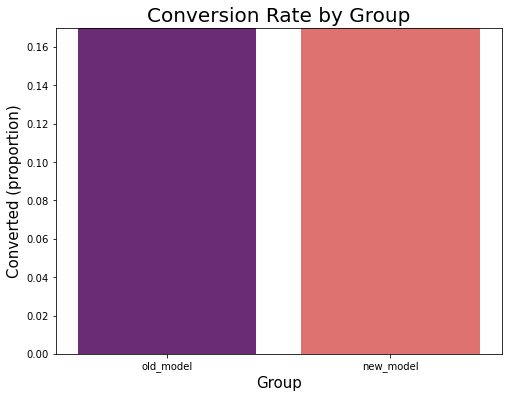

In [16]:
# plt.figure(figsize=(8,6))

# sns.barplot(x=ab_test['MODEL'], y=ab_test['GOOD'], ci=False, palette='magma')

# plt.ylim(0, 0.17)
# plt.title('Conversion Rate by Group', size=20)
# plt.xlabel('Group', size=15)
# plt.ylabel('Converted (proportion)', size=15);

In [20]:
old_model_results = ab_test[ab_test['MODEL'] == 'old_model']['GOOD']
new_model_results = ab_test[ab_test['MODEL'] == 'new_model']['GOOD']

nr_old_model= old_model_results.count()
nr_new_model = new_model_results.count()
successes = [old_model_results.sum(), new_model_results.sum()]
nr_obs = [nr_old_model, nr_new_model]

z_stat, pvalue = proportions_ztest(successes, nobs=nr_obs)

# Confidence interval
(lower_old_model, lower_new_model), (upper_old_model, upper_new_model) = proportion_confint(successes, nobs=nr_obs, alpha=0.05)

print('Z Statistic              : {:.2f}'.format(z_stat))
print('P-Value                  : {:6.3f}'.format(pvalue))   ## If the p-value from the statistical test is low (typically <0.05), it suggests a significant difference between the models.
print('CI 95% for old_model group : [{:.3f},{:.3f}]'.format(lower_old_model, upper_old_model))
print('CI 95% for new_model group : [{:.3f},{:.3f}]'.format(lower_new_model, upper_new_model))

Z Statistic              : 12.77
P-Value                  :  0.000
CI 95% for old_model group : [0.510,0.532]
CI 95% for new_model group : [0.407,0.429]


In [27]:
# features = ['mileage','year','mpg','tax','engineSize']

# X = ford_[features]

# # normalizing features
# X_norm = (X - X.mean(axis=0))/X.std(axis=0)

# # principal component analysis on features
# pca = PCA()

# # fit and transform X_norm to PCA dataframe
# X_pca = pca.fit_transform(X_norm)

# # converting to dataframe
# names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
# X_pcadf = pd.DataFrame(X_pca, columns=names)


# print(X_pcadf.head())
# print("+++++++++++++++++++++++++++++++++++++++++++++++++++")
# print("shape of pca df:", X_pcadf.shape)

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris

# Load the Iris dataset
data = load_iris()
X = data.data
y = data.target

# Convert to DataFrame for better readability
df = pd.DataFrame(X, columns=data.feature_names)
df['species'] = y

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize PCA and reduce to 2 components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Convert PCA result to DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['species'] = y

print(df)
print(df_pca)

# # Plot the PCA result
# plt.figure(figsize=(10, 6))
# scatter = plt.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['species'], cmap='viridis')
# plt.colorbar(scatter, label='Species')
# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title('PCA of Iris Dataset')
# plt.show()

# # Print explained variance ratio
# print(f'Explained variance ratio: {pca.explained_variance_ratio_}')
# print(f'Explained variance (cumulative): {np.cumsum(pca.explained_variance_ratio_)}')

     sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)  \
0                  5.1               3.5                1.4               0.2   
1                  4.9               3.0                1.4               0.2   
2                  4.7               3.2                1.3               0.2   
3                  4.6               3.1                1.5               0.2   
4                  5.0               3.6                1.4               0.2   
..                 ...               ...                ...               ...   
145                6.7               3.0                5.2               2.3   
146                6.3               2.5                5.0               1.9   
147                6.5               3.0                5.2               2.0   
148                6.2               3.4                5.4               2.3   
149                5.9               3.0                5.1               1.8   

     species  
0          0

In [4]:
# from learntools.core import binder
# binder.bind(globals())
# from learntools.feature_engineering_new.ex5 import *

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)


def apply_pca(X, standardize=True):
    # Standardize
    if standardize:
        X = (X - X.mean(axis=0)) / X.std(axis=0)
    # Create principal components
    pca = PCA()
    X_pca = pca.fit_transform(X)
    # Convert to dataframe
    component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)
    # Create loadings
    loadings = pd.DataFrame(
        pca.components_.T,  # transpose the matrix of loadings
        columns=component_names,  # so the columns are the principal components
        index=X.columns,  # and the rows are the original features
    )
    return pca, X_pca, loadings


def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs


def make_mi_scores(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores


def score_dataset(X, y, model=XGBRegressor()):
    # Label encoding for categoricals
    for colname in X.select_dtypes(["category", "object"]):
        X[colname], _ = X[colname].factorize()
    # Metric for Housing competition is RMSLE (Root Mean Squared Log Error)
    score = cross_val_score(
        model, X, y, cv=5, scoring="neg_mean_squared_log_error",
    )
    score = -1 * score.mean()
    score = np.sqrt(score)
    return score


df = pd.read_csv("C:\\Users\\Admins\\Documents\\Downloads\\New folder\\ames.csv")
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YearSold,SaleType,SaleCondition,SalePrice
0,One_Story_1946_and_Newer_All_Styles,Residential_Low_Density,141.0,31770.0,Pave,No_Alley_Access,Slightly_Irregular,Lvl,AllPub,Corner,...,0.0,No_Pool,No_Fence,None,0.0,5,2010,WD,Normal,215000
1,One_Story_1946_and_Newer_All_Styles,Residential_High_Density,80.0,11622.0,Pave,No_Alley_Access,Regular,Lvl,AllPub,Inside,...,0.0,No_Pool,Minimum_Privacy,None,0.0,6,2010,WD,Normal,105000
2,One_Story_1946_and_Newer_All_Styles,Residential_Low_Density,81.0,14267.0,Pave,No_Alley_Access,Slightly_Irregular,Lvl,AllPub,Corner,...,0.0,No_Pool,No_Fence,Gar2,12500.0,6,2010,WD,Normal,172000
3,One_Story_1946_and_Newer_All_Styles,Residential_Low_Density,93.0,11160.0,Pave,No_Alley_Access,Regular,Lvl,AllPub,Corner,...,0.0,No_Pool,No_Fence,None,0.0,4,2010,WD,Normal,244000
4,Two_Story_1946_and_Newer,Residential_Low_Density,74.0,13830.0,Pave,No_Alley_Access,Slightly_Irregular,Lvl,AllPub,Inside,...,0.0,No_Pool,Minimum_Privacy,None,0.0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,Split_or_Multilevel,Residential_Low_Density,37.0,7937.0,Pave,No_Alley_Access,Slightly_Irregular,Lvl,AllPub,CulDSac,...,0.0,No_Pool,Good_Privacy,None,0.0,3,2006,WD,Normal,142500
2926,One_Story_1946_and_Newer_All_Styles,Residential_Low_Density,0.0,8885.0,Pave,No_Alley_Access,Slightly_Irregular,Low,AllPub,Inside,...,0.0,No_Pool,Minimum_Privacy,None,0.0,6,2006,WD,Normal,131000
2927,Split_Foyer,Residential_Low_Density,62.0,10441.0,Pave,No_Alley_Access,Regular,Lvl,AllPub,Inside,...,0.0,No_Pool,Minimum_Privacy,Shed,700.0,7,2006,WD,Normal,132000
2928,One_Story_1946_and_Newer_All_Styles,Residential_Low_Density,77.0,10010.0,Pave,No_Alley_Access,Regular,Lvl,AllPub,Inside,...,0.0,No_Pool,No_Fence,None,0.0,4,2006,WD,Normal,170000


In [6]:
features = [
    "GarageArea",
    "YearRemodAdd",
    "TotalBsmtSF",
    "GrLivArea",
]

print("Correlation with SalePrice:\n")
print(df[features].corrwith(df.SalePrice))

X = df.copy()
y = X.pop("SalePrice")
X = X.loc[:, features]

# `apply_pca`, defined above, reproduces the code from the tutorial
pca, X_pca, loadings = apply_pca(X)
print(loadings)

Correlation with SalePrice:

GarageArea      0.640138
YearRemodAdd    0.532974
TotalBsmtSF     0.632529
GrLivArea       0.706780
dtype: float64
                   PC1       PC2       PC3       PC4
GarageArea    0.541229  0.102375 -0.038470  0.833733
YearRemodAdd  0.427077 -0.886612 -0.049062 -0.170639
TotalBsmtSF   0.510076  0.360778 -0.666836 -0.406192
GrLivArea     0.514294  0.270700  0.742592 -0.332837


In [9]:
X.shape

(2930, 4)

In [10]:
X_pca

,PC1,PC2,PC3,PC4
0,-0.165346,1.164936,0.233330,0.283527
1,-0.639050,0.649561,-0.622155,1.740770
2,-0.794227,1.175790,-0.580254,-0.551055
3,1.636658,1.907874,-0.675063,-1.052854
4,0.293648,-0.610856,0.342374,-0.047752
...,...,...,...,...
2925,-0.276496,-0.239255,-0.676658,0.820547
2926,-0.822084,-0.414039,-0.593885,0.620322
2927,-1.730457,-0.951137,-0.501221,-1.417521
2928,-0.049130,0.584898,-0.641779,-0.374198


In [36]:
# You can change PC1 to PC2, PC3, or PC4
component = "PC1"

idx = X_pca[component].sort_values(ascending=False).index
df.loc[idx, ["SalePrice", "Neighborhood", "SaleCondition"] ]
# tmp = df.loc[idx, ["SalePrice", "Neighborhood", "SaleCondition"] + features]
# tmp.reset_index().sort_values(by='index',ascending=True)
# tmp.sort_values(by=tmp[0],ascending=True)

,SalePrice,Neighborhood,SaleCondition
1498,160000,Edwards,Partial
2180,183850,Edwards,Partial
2181,184750,Edwards,Partial
1760,745000,Northridge,Abnorml
1767,755000,Northridge,Normal
...,...,...,...
662,59000,Old_Town,Normal
2679,80500,Brookside,Normal
2879,51689,Iowa_DOT_and_Rail_Road,Abnorml
780,63900,Sawyer,Normal


In [18]:
df[["SalePrice", "Neighborhood", "SaleCondition"]]

,SalePrice,Neighborhood,SaleCondition
0,215000,North_Ames,Normal
1,105000,North_Ames,Normal
2,172000,North_Ames,Normal
3,244000,North_Ames,Normal
4,189900,Gilbert,Normal
...,...,...,...
2925,142500,Mitchell,Normal
2926,131000,Mitchell,Normal
2927,132000,Mitchell,Normal
2928,170000,Mitchell,Normal
